# Statistical filtering for Deep learning implementation

> 3 datasets: EVN-HCM, NYISO, PJM-RTO; 6 deep learning models


Created by Duy Anh Pham
## No installation requires. All the blocks of code are implements on Google Colab (colab.research.google.com)
The reasons of using Google Colab are (1) it is free of charge, (2) it does not require you to install any further libraries to your systems (which is really troublesome sometimes) and (3) it provides 12 consecutive hours of free GPU.

### Instructions:
1. Go to colab.research.google.com (sign in with your gmail account)
2. Upload this notebook to your working repository by clicking File - Upload notebook
3. Change runtime: in order to use free GPU on google colab, please go to Runtime - Change runtime type - set Hardware accelerator to GPU
4. Go through the following sections step by step to achieve the results in the paper.

# NYISO dataset

## Setup environment, import libraries

In [0]:
import tensorflow as tf
import pandas as pd
import numpy as np
import os
from collections import Counter
import matplotlib
import matplotlib.pyplot as plt
import random
import shutil
import tensorflow.contrib.learn as tflearn
import tensorflow.contrib.layers as tflayers
from tensorflow.contrib.learn.python.learn import learn_runner
import tensorflow.contrib.metrics as metrics
import tensorflow.contrib.rnn as rnn
from google.colab import files
from matplotlib.pyplot import figure
from sklearn.model_selection import train_test_split

#Set a fixed random value so that every time the code is running it will yield the same results.
from numpy.random import seed
seed(1611)

#Set a fixed random value so that every time the code is running it will yield the same results.
from tensorflow import set_random_seed
set_random_seed(3116)

!git clone https://github.com/a11to1n3/StatFilterAppliedInSTLFDeeplearning.git


# Change to the repository folder
%cd StatFilterAppliedInSTLFDeeplearning

# Import all the neccessary modules in the cloned repository
import dataWrangling
import dataPCA
import dataHourSplit
import dataFilter
import confidenceLevelFitness
import LSTMModelBuilder
import CNNLSTMModelBuilder
import wavenet
import RBMDAE
import waveletFunction
import modelBuilder

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

Cloning into 'StatFilterAppliedInSTLFDeeplearning'...
remote: Enumerating objects: 141, done.
remote: Counting objects: 100% (141/141), done.
remote: Compressing objects: 100% (100/100), done.
remote: Total 141 (delta 83), reused 99 (delta 41), pack-reused 0
Receiving objects: 100% (141/141), 23.13 KiB | 5.78 MiB/s, done.
Resolving deltas: 100% (83/83), done.
/content/StatFilterAppliedInSTLFDeeplearning


Using TensorFlow backend.


## Load dataset

In [0]:
# Run this and select the DayMarked.csv file in your computer
files.upload()

Saving DayMarkedNYISOO.csv to DayMarkedNYISOO.csv


{'DayMarkedNYISOO.csv': b'Thu,Ngay,00:00,01:00,02:00,03:00,04:00,05:00,06:00,07:00,08:00,09:00,10:00,11:00,12:00,13:00,14:00,15:00,16:00,17:00,18:00,19:00,20:00,21:00,22:00,23:00,Holiday,Week number\r\n4,1/1/14,17587.8,16902.2,16357.9,16041,15932.2,16034.2,16452.8,16648.8,17016.7,17593.5,18215.7,18592.1,18811.6,18853.8,18877.8,19039.1,19947.8,21320.6,21322.6,21015.9,20592.9,19809.4,18619.7,17442.9,1,1\r\n5,1/2/14,16561.6,15989.2,15744,15677.2,15943.3,16836.8,18541.5,20039.7,20883.1,21677.5,22243.1,22533.3,22639.2,22679,22647,22725.6,23492,24454.9,24287.1,23807.9,23104.8,22082,20814.6,19570,0,1\r\n6,1/3/14,18511.3,17880.7,17594,17490.5,17648.9,18265.7,19377.9,20357.7,21150.5,21844.3,22207.7,22328,22374.5,22306.9,22194.6,22166.3,22913.1,24413.2,24393.1,23995.4,23380,22512.7,21425.4,20178.8,0,1\r\n7,1/4/14,19060.7,18303.2,17859.4,17619.5,17633.4,17902.5,18566.6,19205.1,20005,20609.8,20882.9,20843.9,20569.4,20274.2,20059.9,20065.6,20890.3,22400,22462.6,22001.3,21500.9,20790.9,19774.8,18640

## Pre-process dataset to 133 dimensions and scale it

The shape of the array is: (1818, 24, 133)


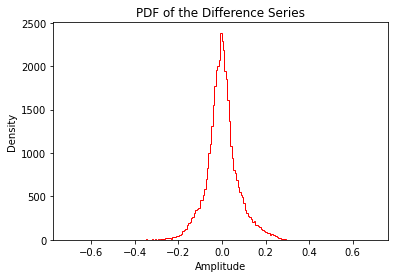

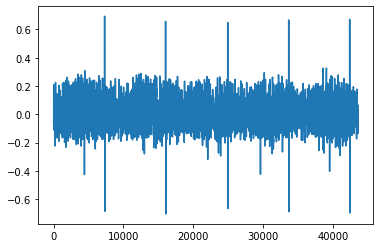

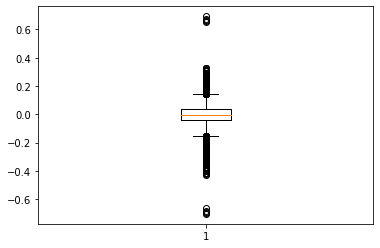

In [0]:
wrangledData = dataWrangling.csvToArray('DayMarkedNYISOO.csv')
#wrangledData = dataWrangling.csvToArray('DayMarked (STLF Data Inputs Template) 13112019.csv')

# Check for the shape of the array after wrangling the data
print("The shape of the array is: {}".format(np.shape(wrangledData)))

data_scaled, data_orig = dataPCA.diffandScaleISONE(wrangledData)

## Search confidence level

In [0]:
# Data filtered with confidence level of 90
data_90 = dataFilter.filterWithConfidenceLevel(data_scaled, 90)

# Data filtered with confidence level of 91
data_91 = dataFilter.filterWithConfidenceLevel(data_scaled, 91)

# Data filtered with confidence level of 92
data_92 = dataFilter.filterWithConfidenceLevel(data_scaled, 92)

# Data filtered with confidence level of 93
data_93 = dataFilter.filterWithConfidenceLevel(data_scaled, 93)

# Data filtered with confidence level of 94
data_94 = dataFilter.filterWithConfidenceLevel(data_scaled, 94)

# Data filtered with confidence level of 95
data_95 = dataFilter.filterWithConfidenceLevel(data_scaled, 95)

# Data filtered with confidence level of 96
data_96 = dataFilter.filterWithConfidenceLevel(data_scaled, 96)

# Data filtered with confidence level of 97
data_97 = dataFilter.filterWithConfidenceLevel(data_scaled, 97)

# Data filtered with confidence level of 98
data_98 = dataFilter.filterWithConfidenceLevel(data_scaled, 98)

# Data filtered with confidence level of 99
data_99 = dataFilter.filterWithConfidenceLevel(data_scaled, 99)

# Data filtered with confidence level of 99.73
data_3sigma = dataFilter.filterWithConfidenceLevel(data_scaled, 99.73)

# Data filtered with confidence level of 99.99366
data_4sigma = dataFilter.filterWithConfidenceLevel(data_scaled, 99.99366)

# Data filtered with confidence level of 99.99932
data_4sigma5 = dataFilter.filterWithConfidenceLevel(data_scaled, 99.99932)

In [0]:
MAPE = {
    "data" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0,
        "full": 0
    }
}

MAPE['data']['90'] = confidenceLevelFitness.calculateMAPE(data_90,data_scaled,200,8)

In [0]:
MAPE['data']['91'] = confidenceLevelFitness.calculateMAPE(data_91,data_scaled,200,8)

In [0]:
MAPE['data']['92'] = confidenceLevelFitness.calculateMAPE(data_92,data_scaled,200,8)

In [0]:
MAPE['data']['93'] = confidenceLevelFitness.calculateMAPE(data_93,data_scaled,200,8)

In [0]:
MAPE['data']['94'] = confidenceLevelFitness.calculateMAPE(data_94,data_scaled,200,8)

In [0]:
MAPE['data']['95'] = confidenceLevelFitness.calculateMAPE(data_95,data_scaled,200,8)

In [0]:
MAPE['data']['96'] = confidenceLevelFitness.calculateMAPE(data_96,data_scaled,200,8)

In [0]:
MAPE['data']['97'] = confidenceLevelFitness.calculateMAPE(data_97,data_scaled,200,8)

In [0]:
MAPE['data']['98'] = confidenceLevelFitness.calculateMAPE(data_98,data_scaled,200,8)

In [0]:
MAPE['data']['99'] = confidenceLevelFitness.calculateMAPE(data_99,data_scaled,200,8)

In [0]:
MAPE['data']['3sigma'] = confidenceLevelFitness.calculateMAPE(data_3sigma,data_scaled,200,8)

In [0]:
MAPE['data']['4sigma'] = confidenceLevelFitness.calculateMAPE(data_4sigma,data_scaled,200,8)

In [0]:
MAPE['data']['4sigma5'] = confidenceLevelFitness.calculateMAPE(data_4sigma5,data_scaled,200,8)

In [0]:
MAPE['data']['full'] = confidenceLevelFitness.calculateMAPE(data_scaled,data_scaled,200,8)

In [0]:
print(MAPE['data'])

## Data preparation for the main forecasting algorithm

### With filter

In [0]:
inp = data_95[:-int(0.1*len(data_98))-1]
out = data_95[1:-int(0.1*len(data_98))]
test_inp = data_scaled[-int(0.1*len(data_scaled)):-1]
test_out = data_scaled[-int(0.1*len(data_scaled))+1:]
pretest_inp = data_orig[-int(0.1*len(data_orig)):-1]
pretest_out = data_orig[-int(0.1*len(data_orig))+1:]

In [0]:
data_filtered = np.zeros_like(data_98)
data_unfiltered = np.zeros_like(data_98)
for i in range(len(data_98)):
  data_filtered[i,:,0] = np.e**(np.log(data_orig[i,:,0]) + data_98[i,:,0])
  data_filtered[i,:,1:]= data_orig[i,:,1:]
  data_unfiltered[i,:,0] = np.e**(np.log(data_orig[i,:,0]) + data_scaled[i,:,0])
  data_unfiltered[i,:,1:] = data_orig[i,:,1:]

from sklearn.preprocessing import MinMaxScaler

train_scaler = MinMaxScaler()
test_scaler = MinMaxScaler()

data_filtered[:,:,0] = train_scaler.fit_transform(data_filtered[:,:,0])
data_unfiltered[:,:,0] = test_scaler.fit_transform(data_unfiltered[:,:,0])

inp = data_filtered[:-int(0.1*len(data_filtered))-1]
out = data_filtered[1:-int(0.1*len(data_filtered))]
test_inp = data_unfiltered[-int(0.1*len(data_filtered)):-1]
test_out = data_unfiltered[-int(0.1*len(data_filtered))+1:]
pretest_inp = data_orig[-int(0.1*len(data_filtered)):-1]
pretest_out = data_orig[-int(0.1*len(data_filtered))+1:]

### No filter

In [0]:
inp = data_scaled[:-int(0.1*len(data_scaled))-1]
out = data_scaled[1:-int(0.1*len(data_scaled))]
test_inp = data_scaled[-int(0.1*len(data_scaled)):-1]
test_out = data_scaled[-int(0.1*len(data_scaled))+1:]
pretest_inp = data_orig[-int(0.1*len(data_scaled)):-1]
pretest_out = data_orig[-int(0.1*len(data_scaled))+1:]

In [0]:
from sklearn.preprocessing import MinMaxScaler

test_scaler = MinMaxScaler()

data_orig[:,:,0] = test_scaler.fit_transform(data_orig[:,:,0])

inp = data_orig[:-int(0.1*len(data_orig))-1]
out = data_orig[1:-int(0.1*len(data_orig))]
test_inp = data_orig[-int(0.1*len(data_orig)):-1]
test_out = data_orig[-int(0.1*len(data_orig))+1:]
pretest_inp = data_orig[-int(0.1*len(data_orig)):-1]
pretest_out = data_orig[-int(0.1*len(data_orig))+1:]

In [0]:
np.shape(data_scaled)

## Model preparation

### LSTM 

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
#train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

In [0]:
model = LSTMModelBuilder.build(data_scaled.shape[1],data_scaled.shape[2])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 24, 20)            12320     
_________________________________________________________________
lstm_1 (LSTM)                (None, 20)                3280      
_________________________________________________________________
dropout (Dropout)            (None, 20)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 24)                504       
Total params: 16,104
Trainable params: 16,104
Non-trainable params: 0
_________________________________________________________________


##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=500,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/500
 85/273 [========>.....................] - ETA: 25s - loss: 0.0578 - mean_squared_error: 0.0066 - mean_absolute_percentage_error: 420.3877

KeyboardInterrupt: ignored

In [0]:
4.231860362987466
861.2655625059399
1095.8509395420504

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      #AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)**2)
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=500,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/500
272/273 [============================>.] - ETA: 0s - loss: 0.0464 - mean_squared_error: 0.0043 - mean_absolute_percentage_error: 11319.2666Evaluating: epoch 0 ends at 22:10:37.845658 with MAPE 
5.125770887904106
1024.9271346106568
1288.4751666494533
273/273 [==============================] - 32s 116ms/step - loss: 0.0464 - mean_squared_error: 0.0042 - mean_absolute_percentage_error: 11278.4775 - val_loss: 0.0346 - val_mean_squared_error: 0.0020 - val_mean_absolute_percentage_error: 624.4863
Epoch 2/500
272/273 [============================>.] - ETA: 0s - loss: 0.0354 - mean_squared_error: 0.0021 - mean_absolute_percentage_error: 11832.2773Evaluating: epoch 1 ends at 22:11:08.277703 with MAPE 
4.986232890860012
1004.3056021411278
1222.0141615473149
273/273 [==============================] - 30s 109ms/step - loss: 0.0354 - mean_squared_error: 0.0021 - mean_absolute_percentage_error: 11789.5410 - val_loss: 0.0342 - val_mean_squared_err

KeyboardInterrupt: ignored

In [0]:
4.297441530099145
877.068285431094
1108.1276932773046

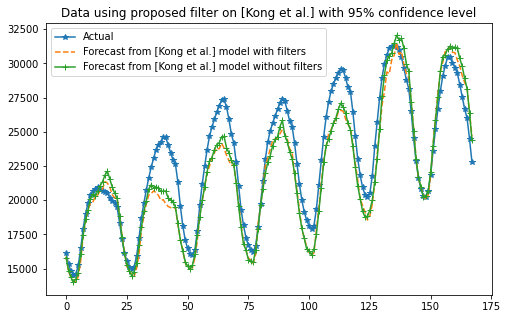

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from [Kong et al.] model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from [Kong et al.] model without filters')
plt.legend()
plt.title("Data using proposed filter on [Kong et al.] with 95% confidence level")
plt.show()

### CNNLSTM 

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
#train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [0]:
model = CNNLSTMModelBuilder.build(data_scaled.shape[1],data_scaled.shape[2])
model.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "mnist_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
inp (InputLayer)                [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 20, 16)       10656       inp[0][0]                        
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 18, 32)       1568        conv1d[0][0]                     
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, 16, 64)       6208        conv1d_1[0][0]                   
_______

##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=25,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/25
272/273 [============================>.] - ETA: 0s - loss: 0.0576 - mean_squared_error: 0.0061 - mean_absolute_percentage_error: 21261.0469Evaluating: epoch 0 ends at 12:32:35.875075 with MAPE 
6.0862893242201395
1220.1877004463897
1424.6065812539373
273/273 [==============================] - 22s 81ms/step - loss: 0.0575 - mean_squared_error: 0.0060 - mean_absolute_percentage_error: 21184.3047 - val_loss: 0.0470 - val_mean_squared_error: 0.0035 - val_mean_absolute_percentage_error: 23242.0742
Epoch 2/25
271/273 [============================>.] - ETA: 0s - loss: 0.0455 - mean_squared_error: 0.0033 - mean_absolute_percentage_error: 10124.7559Evaluating: epoch 1 ends at 12:32:50.776732 with MAPE 
5.691779920953653
1117.876804818214
1357.580108268159
273/273 [==============================] - 15s 54ms/step - loss: 0.0454 - mean_squared_error: 0.0033 - mean_absolute_percentage_error: 10057.2383 - val_loss: 0.0439 - val_mean_squared_error:

In [0]:
4.753956621007906
963.9974689470539
1219.5950756797185

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=25,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/25
272/273 [============================>.] - ETA: 0s - loss: 0.0301 - mean_squared_error: 0.0015 - mean_absolute_percentage_error: 10265.6064Evaluating: epoch 0 ends at 12:38:42.038305 with MAPE 
5.013415111081297
1000.4299328318443
1237.6407335951815
273/273 [==============================] - 15s 54ms/step - loss: 0.0301 - mean_squared_error: 0.0015 - mean_absolute_percentage_error: 10228.6924 - val_loss: 0.0373 - val_mean_squared_error: 0.0023 - val_mean_absolute_percentage_error: 36997.8203
Epoch 2/25
272/273 [============================>.] - ETA: 0s - loss: 0.0259 - mean_squared_error: 0.0011 - mean_absolute_percentage_error: 6871.5049Evaluating: epoch 1 ends at 12:38:55.994637 with MAPE 
4.685703070123043
946.4450754595681
1177.7982267137875
273/273 [==============================] - 14s 50ms/step - loss: 0.0259 - mean_squared_error: 0.0011 - mean_absolute_percentage_error: 6847.1460 - val_loss: 0.0347 - val_mean_squared_error: 0

KeyboardInterrupt: ignored

In [0]:
4.773294913191957
954.9648893971229
1237.9537618976822

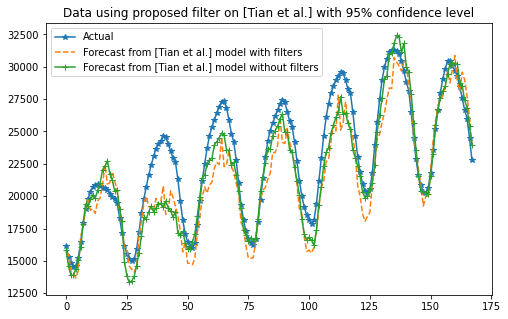

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from [Tian et al.] model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from [Tian et al.] model without filters')
plt.legend()
plt.title("Data using proposed filter on [Tian et al.] with 95% confidence level")
plt.show()

### Wavenet 

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
#train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [0]:
model = wavenet.build_wavenet_model(data_scaled.shape[1],data_scaled.shape[2],16,3,18)
model.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 24, 16)       6400        input_1[0][0]                    
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 24, 16)       784         conv1d[0][0]                     
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, 24, 16)       784         conv1d[0][0]                     
_____________

##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/50
272/273 [============================>.] - ETA: 0s - loss: 0.0416 - mean_squared_error: 0.0028 - mean_absolute_percentage_error: 3618.3730Evaluating: epoch 0 ends at 22:15:22.135903 with MAPE 
5.664661833974636
1126.3253560728713
1387.425614806963
273/273 [==============================] - 266s 973ms/step - loss: 0.0416 - mean_squared_error: 0.0028 - mean_absolute_percentage_error: 3605.6399 - val_loss: 0.0387 - val_mean_squared_error: 0.0024 - val_mean_absolute_percentage_error: 16232.9238
Epoch 2/50
272/273 [============================>.] - ETA: 0s - loss: 0.0354 - mean_squared_error: 0.0021 - mean_absolute_percentage_error: 5310.1821Evaluating: epoch 1 ends at 22:19:37.966059 with MAPE 
5.196283215947767
1038.8182040459185
1312.8556754459828
273/273 [==============================] - 250s 916ms/step - loss: 0.0354 - mean_squared_error: 0.0021 - mean_absolute_percentage_error: 5291.0972 - val_loss: 0.0359 - val_mean_squared_error:

In [0]:
4.480616974983943
896.3963349031022
1120.9839151743586

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      #AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)**2)
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/50
272/273 [============================>.] - ETA: 0s - loss: 0.0416 - mean_squared_error: 0.0028 - mean_absolute_percentage_error: 3428.7988Evaluating: epoch 0 ends at 05:51:36.955325 with MAPE 
5.6679424837197665
1126.7912865050585
1390.9532836101373
273/273 [==============================] - 263s 964ms/step - loss: 0.0416 - mean_squared_error: 0.0028 - mean_absolute_percentage_error: 3416.7346 - val_loss: 0.0385 - val_mean_squared_error: 0.0024 - val_mean_absolute_percentage_error: 14509.0566
Epoch 2/50
272/273 [============================>.] - ETA: 0s - loss: 0.0357 - mean_squared_error: 0.0021 - mean_absolute_percentage_error: 6535.6963Evaluating: epoch 1 ends at 05:55:50.750770 with MAPE 
5.27835816817014
1054.9706876420414
1327.3734510875427
273/273 [==============================] - 249s 914ms/step - loss: 0.0357 - mean_squared_error: 0.0021 - mean_absolute_percentage_error: 6512.1807 - val_loss: 0.0368 - val_mean_squared_error

KeyboardInterrupt: ignored

In [0]:
5.042519185658148
1008.8906281657394
1284.5484209503

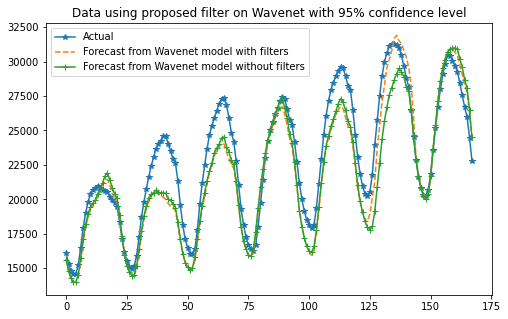

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from Wavenet model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from Wavenet model without filters')
plt.legend()
plt.title("Data using proposed filter on Wavenet with 95% confidence level")
plt.show()

### Wavenet + LSTM

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
#train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [0]:
model = wavenet.build_wavenet_model(data_scaled.shape[1],data_scaled.shape[2],16,3,18)
model.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 24, 16)       6400        input_1[0][0]                    
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 24, 16)       784         conv1d[0][0]                     
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, 24, 16)       784         conv1d[0][0]                     
_____________

##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
#plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      #plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=25,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/25
272/273 [============================>.] - ETA: 0s - loss: 0.0417 - mean_squared_error: 0.0028 - mean_absolute_percentage_error: 4055.7131Evaluating: epoch 0 ends at 08:59:04.728419 with MAPE 
5.644573586930985
1116.1551670814733
1375.4130582730788
273/273 [==============================] - 266s 976ms/step - loss: 0.0417 - mean_squared_error: 0.0028 - mean_absolute_percentage_error: 4041.5608 - val_loss: 0.0391 - val_mean_squared_error: 0.0025 - val_mean_absolute_percentage_error: 14372.1826
Epoch 2/25
272/273 [============================>.] - ETA: 0s - loss: 0.0356 - mean_squared_error: 0.0021 - mean_absolute_percentage_error: 5373.1621Evaluating: epoch 1 ends at 09:03:22.112868 with MAPE 
5.182880793782955
1032.9773022488714
1299.402536589687
273/273 [==============================] - 253s 928ms/step - loss: 0.0356 - mean_squared_error: 0.0021 - mean_absolute_percentage_error: 5353.8965 - val_loss: 0.0365 - val_mean_squared_error:

KeyboardInterrupt: ignored

In [0]:
from tensorflow import keras
from tensorflow.keras import layers, Model
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.00001
  else:
    return 0.00001 * np.math.exp(0.1 * (10 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
model_fine = model.output
model_fine = layers.Reshape((24,1))(model_fine)
model_fine = layers.LSTM(100,return_sequences = True, activation='relu')(model_fine)
model_fine = layers.Dense(1)(model_fine)
model_fine = layers.Flatten()(model_fine)
model_final = Model(inputs=model.input, outputs=model_fine)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=15,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])



Train on 273 steps, validate on 135 steps
Epoch 1/15
272/273 [============================>.] - ETA: 0s - loss: 0.0278 - mean_squared_error: 0.0015 - mean_absolute_percentage_error: 6703.2778Evaluating: epoch 0 ends at 10:20:06.567841 with MAPE 
4.989305488819526
997.9221214403155
1262.5978067716662
273/273 [==============================] - 257s 941ms/step - loss: 0.0278 - mean_squared_error: 0.0015 - mean_absolute_percentage_error: 6679.1475 - val_loss: 0.0339 - val_mean_squared_error: 0.0021 - val_mean_absolute_percentage_error: 8828.1279
Epoch 2/15
272/273 [============================>.] - ETA: 0s - loss: 0.0277 - mean_squared_error: 0.0015 - mean_absolute_percentage_error: 6234.7886Evaluating: epoch 1 ends at 10:24:20.650180 with MAPE 
4.985580314478445
996.939937849554
1261.7770695592792
273/273 [==============================] - 253s 926ms/step - loss: 0.0277 - mean_squared_error: 0.0015 - mean_absolute_percentage_error: 6212.1826 - val_loss: 0.0339 - val_mean_squared_error: 0.

In [0]:
5.001118169956127
999.5305578282422
1263.69660313595

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
#plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      #plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      #AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)**2)
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=500,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/500
272/273 [============================>.] - ETA: 0s - loss: 0.0492 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 5512.8315Evaluating: epoch 0 ends at 23:57:35.776178 with MAPE 
6.622000204974834
1302.002388145604
1635.8096938668857
273/273 [==============================] - 269s 984ms/step - loss: 0.0493 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 5493.0996 - val_loss: 0.0480 - val_mean_squared_error: 0.0035 - val_mean_absolute_percentage_error: 9400.5996
Epoch 2/500
272/273 [============================>.] - ETA: 0s - loss: 0.0496 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 11589.4629Evaluating: epoch 1 ends at 00:02:00.540468 with MAPE 
6.564630119162653
1304.4957647077645
1614.739487032414
273/273 [==============================] - 249s 913ms/step - loss: 0.0495 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 11548.3525 - val_loss: 0.0466 - val_mean_squared_erro

KeyboardInterrupt: ignored

KeyboardInterrupt: ignored

In [0]:
from tensorflow import keras
from tensorflow.keras import layers, Model
#for tensorflow 2.0
import datetime
plot_val1= []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.00001
  else:
    return 0.00001 * np.math.exp(0.1 * (10 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
model_fine = model.output
model_fine = layers.Reshape((24,1))(model_fine)
model_fine = layers.LSTM(100,return_sequences = True, activation='relu')(model_fine)
model_fine = layers.Dense(1)(model_fine)
model_fine = layers.Flatten()(model_fine)
model_final = Model(inputs=model.input, outputs=model_fine)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])



Train on 273 steps, validate on 135 steps
Epoch 1/50
272/273 [============================>.] - ETA: 0s - loss: 0.0290 - mean_squared_error: 0.0016 - mean_absolute_percentage_error: 3530.0198Evaluating: epoch 0 ends at 06:55:31.348889 with MAPE 
5.026042798349589
1006.0929505157758
1276.0564652011217
273/273 [==============================] - 253s 928ms/step - loss: 0.0290 - mean_squared_error: 0.0016 - mean_absolute_percentage_error: 3517.5696 - val_loss: 0.0346 - val_mean_squared_error: 0.0022 - val_mean_absolute_percentage_error: 5809.9922
Epoch 2/50
272/273 [============================>.] - ETA: 0s - loss: 0.0287 - mean_squared_error: 0.0016 - mean_absolute_percentage_error: 3703.7822Evaluating: epoch 1 ends at 06:59:41.968994 with MAPE 
5.022976538837883
1005.7181079698106
1276.6696662925117
273/273 [==============================] - 250s 914ms/step - loss: 0.0287 - mean_squared_error: 0.0016 - mean_absolute_percentage_error: 3690.7261 - val_loss: 0.0345 - val_mean_squared_error:

KeyboardInterrupt: ignored

In [0]:
5.02562081417932
1006.6846987297878
1277.991604509303

In [0]:
files.upload()

Saving wavenetLstmNF.npz to wavenetLstmNF.npz


{'wavenetLstmNF.npz': b'PK\x03\x04\x14\x00\x00\x00\x00\x00\x00\x00!\x00\x82?\xf4\xab\x80\x8c\n\x00\x80\x8c\n\x00\t\x00\x14\x00arr_0.npy\x01\x00\x10\x00\x80\x8c\n\x00\x00\x00\x00\x00\x80\x8c\n\x00\x00\x00\x00\x00\x93NUMPY\x01\x00v\x00{\'descr\': \'<f8\', \'fortran_order\': False, \'shape\': (1800, 2, 24), }                                                   \nmEMF\xb3E\xcf@\xae"\xa9\xf8\xf0n\xcd@X\xec2WG1\xcc@\'\xb3\xdc\x9f\xac\xa9\xcb@*\xf0r\xed)\xb4\xcb@]\xa2|\xaf"O\xcc@\x9e_\x88.\x10\xaf\xce@\x0f.\xc6\x98-\xf0\xd0@h\x8e\xf7\xa7\xa1\xda\xd1@\x93 \xea>\x92\x94\xd2@\xab\xe1\x0c\xbfm#\xd3@8\x88\x80\x06\xb0}\xd3@\x98hJ\x15\xe1\xd9\xd3@\xf2k\xfe\xd10"\xd4@+\xfe\x98\xeaRp\xd4@\x9e-\xe9\xb1\xe9\xc7\xd4@\x84\xa1Z\xfdKD\xd5@\xcf\xf6\xad.\x83B\xd5@\x9aV6b\x9c\xbd\xd4@\x12\xa1G\x84\x1f0\xd4@\x9d\xb5P\xe8\x83\xb2\xd3@\x0b\xbfC\x9c\x9c\x85\xd3@\x12\x8fz\x1a\xebO\xd2@\xa0\x1b"X\x9f\xe7\xd0@\xcd\xcc\xcc\xcc\xcc~\xcf@\x00\x00\x00\x00\x00\xe6\xcd@\x00\x00\x00\x00\x00\xea\xcc@\xcd\xcc\xcc\xcc\x0cj\xcc@\

In [0]:
plot_val1 = np.load('wavenetLstmNF.npz')

In [0]:
plot_val1['arr_0']

array([[[16011.40058294, 15069.88258852, 14434.5573486 , ...,
         19990.44703764, 18751.67349113, 17310.48975423],
        [16125.6       , 15308.        , 14804.        , ...,
         19472.        , 18346.4       , 17144.2       ]],

       [[16012.74992297, 15186.11830137, 14636.44989469, ...,
         19157.41673448, 18161.85913629, 17017.24669408],
        [16176.7       , 15520.9       , 15117.9       , ...,
         22621.3       , 21316.        , 19593.9       ]],

       [[16063.36988069, 15395.85379134, 14950.85042679, ...,
         22281.87261272, 21116.68195361, 19451.21643878],
        [18136.7       , 17099.6       , 16471.2       , ...,
         24188.        , 22761.6       , 21010.8       ]],

       ...,

       [[16285.89027777, 15556.82984785, 15198.22014189, ...,
         18918.75734466, 17769.06175501, 16388.15857842],
        [15215.3       , 14577.9       , 14190.4       , ...,
         17949.2       , 16920.3       , 15785.        ]],

       [[15207.4559

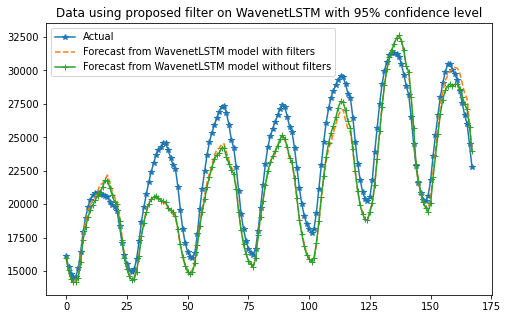

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
#plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1['arr_0'][:,0,:].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from WavenetLSTM model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from WavenetLSTM model without filters')
plt.legend()
plt.title("Data using proposed filter on WavenetLSTM with 95% confidence level")
plt.show()

In [0]:
np.savez('wavenetLstmNF.npz',np.array(plot_val1))

In [0]:
files.download('wavenetLstmNF.npz')

### DAE

#### Training

##### With filter

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

bbrbm = RBMDAE.BBRBM(n_visible=24, n_hidden=64, learning_rate=0.001, momentum=0.95, use_tqdm=True)
errs = bbrbm.fit(x_train[:,:,0], n_epoches=200, batch_size=4)



Instructions for updating:
Use `tf.cast` instead.


Epoch: 0: 100%|##########| 274/274 [00:00<00:00, 339.38it/s]
Train error: 0.2733

Epoch: 1: 100%|##########| 274/274 [00:00<00:00, 498.71it/s]
Train error: 0.1943

Epoch: 2: 100%|##########| 274/274 [00:00<00:00, 505.56it/s]
Train error: 0.1395

Epoch: 3: 100%|##########| 274/274 [00:00<00:00, 482.19it/s]
Train error: 0.1021

Epoch: 4: 100%|##########| 274/274 [00:00<00:00, 482.55it/s]
Train error: 0.0763

Epoch: 5: 100%|##########| 274/274 [00:00<00:00, 465.62it/s]
Train error: 0.0584

Epoch: 6: 100%|##########| 274/274 [00:00<00:00, 480.73it/s]
Train error: 0.0458

Epoch: 7: 100%|##########| 274/274 [00:00<00:00, 472.60it/s]
Train error: 0.0367

Epoch: 8: 100%|##########| 274/274 [00:00<00:00, 485.88it/s]
Train error: 0.0299

Epoch: 9: 100%|##########| 274/274 [00:00<00:00, 502.99it/s]
Train error: 0.0249

Epoch: 10: 100%|##########| 274/274 [00:00<00:00, 476.47it/s]
Train error: 0.0211

Epoch: 11: 100%|##########| 274/274 [00:00<

In [0]:
AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val = []
for i in range(len(test_inp)):
  test_pred = bbrbm.reconstruct(test_inp[i,:,0:1].reshape(-1,24))
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

6.423943499010525
1270.4002412708705
1601.9973208081374


In [0]:
6.423943499010525
1270.4002412708705
1601.9973208081374

##### No filter

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

bbrbm = RBMDAE.BBRBM(n_visible=24, n_hidden=64, learning_rate=0.001, momentum=0.95, use_tqdm=True)
errs = bbrbm.fit(x_train[:,:,0], n_epoches=150, batch_size=4)

Epoch: 0: 100%|##########| 274/274 [00:00<00:00, 458.74it/s]
Train error: 0.2342

Epoch: 1: 100%|##########| 274/274 [00:00<00:00, 469.13it/s]
Train error: 0.1665

Epoch: 2: 100%|##########| 274/274 [00:00<00:00, 497.24it/s]
Train error: 0.1201

Epoch: 3: 100%|##########| 274/274 [00:00<00:00, 485.53it/s]
Train error: 0.0886

Epoch: 4: 100%|##########| 274/274 [00:00<00:00, 505.50it/s]
Train error: 0.0669

Epoch: 5: 100%|##########| 274/274 [00:00<00:00, 475.56it/s]
Train error: 0.0519

Epoch: 6: 100%|##########| 274/274 [00:00<00:00, 482.30it/s]
Train error: 0.0411

Epoch: 7: 100%|##########| 274/274 [00:00<00:00, 497.92it/s]
Train error: 0.0332

Epoch: 8: 100%|##########| 274/274 [00:00<00:00, 502.24it/s]
Train error: 0.0273

Epoch: 9: 100%|##########| 274/274 [00:00<00:00, 464.91it/s]
Train error: 0.0229

Epoch: 10: 100%|##########| 274/274 [00:00<00:00, 488.74it/s]
Train error: 0.0195

Epoch: 11: 100%|##########| 274/274 [00:00<00:00, 508.62it/s]
Train error: 0.0168

Epoch: 12: 100

In [0]:
AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val1 = []
for i in range(len(test_inp)):
  test_pred = bbrbm.reconstruct(test_inp[i,:,0:1].reshape(-1,24))
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

6.433218906351467
1270.7381143069322
1603.872728399013


In [0]:
6.433218906351467
1270.7381143069322
1603.872728399013

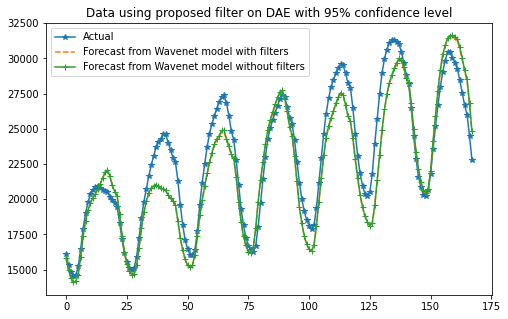

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0,:].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from Wavenet model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from Wavenet model without filters')
plt.legend()
plt.title("Data using proposed filter on DAE with 95% confidence level")
plt.show()

### WNN 

In [0]:
inp_high, inp_low_low, inp_low_high = waveletFunction.extract(inp)

In [0]:
# for pure keras
x_train_high, x_val_high, y_train, y_val = train_test_split(inp_high,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

In [0]:
# for pure keras
x_train_low_low, x_val_low_low, y_train, y_val = train_test_split(inp_low_low,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

In [0]:
# for pure keras
x_train_low_high, x_val_low_high, y_train, y_val = train_test_split(inp_low_high,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

In [0]:
# define two sets of inputs
inputA = tf.keras.Input(shape=(x_train_high.shape[1],x_train_high.shape[2]))
inputB = tf.keras.Input(shape=(x_train_low_low.shape[1],x_train_low_low.shape[2]))
inputC = tf.keras.Input(shape=(x_train_low_high.shape[1],x_train_low_high.shape[2]))

# the first branch opreates on the first input
x = tf.keras.layers.Dense(100, activation="selu")(inputA)
x = tf.keras.layers.Dense(100, activation="selu")(x)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dropout(0.3)(x)
x = tf.keras.layers.Dense(24, activation="linear")(x)
x = tf.keras.Model(inputs = inputA, outputs = x)

# the second branch opreates on the second input
y = tf.keras.layers.Dense(100, activation="selu")(inputB)
y = tf.keras.layers.Dense(100, activation="selu")(y)
y = tf.keras.layers.Flatten()(y)
y = tf.keras.layers.Dropout(0.3)(y)
y = tf.keras.layers.Dense(24, activation="linear")(y)
y = tf.keras.Model(inputs = inputB, outputs = y)

# the third branch opreates on the third input
z = tf.keras.layers.Dense(100, activation="selu")(inputC)
z = tf.keras.layers.Dense(100, activation="selu")(z)
z = tf.keras.layers.Flatten()(z)
z = tf.keras.layers.Dropout(0.3)(z)
z = tf.keras.layers.Dense(24, activation="linear")(z)
z = tf.keras.Model(inputs = inputC, outputs = z)

total = tf.keras.layers.Add()([x.output,y.output,z.output])

model = tf.keras.Model(inputs=[x.input, y.input, z.input], outputs=total)

In [0]:
model.summary()

Model: "model_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
input_5 (InputLayer)            [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
input_6 (InputLayer)            [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
dense_9 (Dense)                 (None, 24, 100)      13400       input_4[0][0]                    
____________________________________________________________________________________________

##### Training

###### With filter

In [0]:
#for tensorflow 2.0

def scheduler(epoch):
  if epoch < 5:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer='rmsprop', loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit([x_train_high,x_train_low_low,x_train_low_high],y_train[:,:,0], batch_size=4, epochs=50,
                      validation_data=([x_val_high,x_val_low_low,x_val_low_high],y_val[:,:,0]),callbacks=[callback])

Train on 1095 samples, validate on 540 samples
Epoch 1/50
1095/1095 [==============================] - 5s 5ms/sample - loss: 4.3816 - mean_squared_error: 48.7271 - mean_absolute_percentage_error: 5345835.5000 - val_loss: 2.5156 - val_mean_squared_error: 10.0359 - val_mean_absolute_percentage_error: 339818.2500
Epoch 2/50
1095/1095 [==============================] - 3s 3ms/sample - loss: 2.8932 - mean_squared_error: 13.6694 - mean_absolute_percentage_error: 2942551.2500 - val_loss: 2.8197 - val_mean_squared_error: 12.2363 - val_mean_absolute_percentage_error: 137652.8281
Epoch 3/50
1095/1095 [==============================] - 3s 3ms/sample - loss: 2.8808 - mean_squared_error: 13.2976 - mean_absolute_percentage_error: 2090230.0000 - val_loss: 2.8454 - val_mean_squared_error: 13.1870 - val_mean_absolute_percentage_error: 383127.1250
Epoch 4/50
1095/1095 [==============================] - 3s 3ms/sample - loss: 2.9907 - mean_squared_error: 14.2106 - mean_absolute_percentage_error: 3097398.0

In [0]:
import pywt

testinp_high, testinp_low_low, testinp_low_high = waveletFunction.extract(test_inp)

AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val = []
for i in range(len(test_inp)):
  test_pred = model.predict([testinp_high[i].reshape(-1,24,133),testinp_low_low[i].reshape(-1,24,133),testinp_low_high[i].reshape(-1,24,133)])
  
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred.reshape(-1)
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

4.045128354336581
820.7399487085597
1037.398849828443


In [0]:
4.045128354336581
820.7399487085597
1037.398849828443

###### No filter

In [0]:
#for tensorflow 2.0

def scheduler(epoch):
  if epoch < 5:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer='rmsprop', loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit([x_train_high,x_train_low_low,x_train_low_high],y_train[:,:,0], batch_size=4, epochs=50,
                      validation_data=([x_val_high,x_val_low_low,x_val_low_high],y_val[:,:,0]),callbacks=[callback])

Train on 1095 samples, validate on 540 samples
Epoch 1/50
1095/1095 [==============================] - 4s 3ms/sample - loss: 4.5437 - mean_squared_error: 54.1021 - mean_absolute_percentage_error: 5530042.5000 - val_loss: 2.9377 - val_mean_squared_error: 13.6906 - val_mean_absolute_percentage_error: 244034.6562
Epoch 2/50
1095/1095 [==============================] - 3s 3ms/sample - loss: 2.8098 - mean_squared_error: 12.7111 - mean_absolute_percentage_error: 5223853.0000 - val_loss: 3.1521 - val_mean_squared_error: 15.5773 - val_mean_absolute_percentage_error: 71617.1562
Epoch 3/50
1095/1095 [==============================] - 3s 3ms/sample - loss: 2.9067 - mean_squared_error: 13.6630 - mean_absolute_percentage_error: 2897887.2500 - val_loss: 3.4062 - val_mean_squared_error: 18.2708 - val_mean_absolute_percentage_error: 154958.3281
Epoch 4/50
1095/1095 [==============================] - 3s 3ms/sample - loss: 2.9405 - mean_squared_error: 13.7982 - mean_absolute_percentage_error: 3058719.50

In [0]:
import pywt

testinp_high, testinp_low_low, testinp_low_high = waveletFunction.extract(test_inp)

AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val1 = []
for i in range(len(test_inp)):
  test_pred = model.predict([testinp_high[i].reshape(-1,24,133),testinp_low_low[i].reshape(-1,24,133),testinp_low_high[i].reshape(-1,24,133)])
  
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred.reshape(-1)
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

4.131879482838031
838.3222091599289
1055.5262735040349


In [0]:
4.131879482838031
838.3222091599289
1055.5262735040349

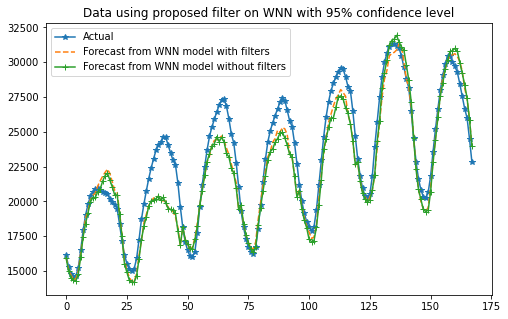

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0,:].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from WNN model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from WNN model without filters')
plt.legend()
plt.title("Data using proposed filter on WNN with 95% confidence level")
plt.show()

# PJM RTO dataset

## Setup environment, import libraries

In [0]:
import tensorflow as tf
import pandas as pd
import numpy as np
import os
from collections import Counter
import matplotlib
import matplotlib.pyplot as plt
import random
import shutil
import tensorflow.contrib.learn as tflearn
import tensorflow.contrib.layers as tflayers
from tensorflow.contrib.learn.python.learn import learn_runner
import tensorflow.contrib.metrics as metrics
import tensorflow.contrib.rnn as rnn
from google.colab import files
from matplotlib.pyplot import figure
from sklearn.model_selection import train_test_split

#Set a fixed random value so that every time the code is running it will yield the same results.
from numpy.random import seed
seed(1611)

#Set a fixed random value so that every time the code is running it will yield the same results.
from tensorflow import set_random_seed
set_random_seed(3116)

!git clone https://github.com/a11to1n3/StatFilterAppliedInSTLFDeeplearning.git


# Change to the repository folder
%cd StatFilterAppliedInSTLFDeeplearning

# Import all the neccessary modules in the cloned repository
import dataWrangling
import dataPCA
import dataHourSplit
import dataFilter
import confidenceLevelFitness
import LSTMModelBuilder
import CNNLSTMModelBuilder
import wavenet
import RBMDAE
import waveletFunction
import modelBuilder

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

Cloning into 'StatFilterAppliedInSTLFDeeplearning'...
remote: Enumerating objects: 141, done.
remote: Counting objects: 100% (141/141), done.
remote: Compressing objects: 100% (100/100), done.
remote: Total 141 (delta 83), reused 99 (delta 41), pack-reused 0
Receiving objects: 100% (141/141), 23.13 KiB | 5.78 MiB/s, done.
Resolving deltas: 100% (83/83), done.
/content/StatFilterAppliedInSTLFDeeplearning


Using TensorFlow backend.


## Load dataset

In [0]:
# Run this and select the DayMarked.csv file in your computer
files.upload()

Saving DayMarkedPJMM.csv to DayMarkedPJMM.csv


{'DayMarkedPJMM.csv': b'Thu,Ngay,00:00,01:00,02:00,03:00,04:00,05:00,06:00,07:00,08:00,09:00,10:00,11:00,12:00,13:00,14:00,15:00,16:00,17:00,18:00,19:00,20:00,21:00,22:00,23:00,Holiday,Week number\r\n4,1/1/14,91392412,89227554,87668736,87062268,87373595,88632963,90575953,91895899,92502138,93018173,93238325,92739080,91572544,90127954,88964428,89018517,91986300,99585156,102303815,101889004,100727123,97952414,93588866,88722240,1,1\r\n5,1/2/14,85368263,83575648,82946837,83423930,85653425,90873923,99454744,105736494,107147905,107934414,108875027,108880170,108605642,108738890,108636012,109165394,112000142,118005055,119985492,119085645,117009880,113261100,108322288,103424122,0,1\r\n6,1/3/14,99487350,97783510,97746096,98699818,101588998,106824574,113859000,119478385,121360553,121534176,120741116,119372298,117650301,116124782,114484787,113710078,116351977,124561530,127294741,126378516,125175236,122125023,117801579,112949177,0,1\r\n7,1/4/14,109090126,106929393,105826647,105685901,106169219,10795

## Pre-process dataset to 133 dimensions and scale it

The shape of the array is: (1818, 24, 133)


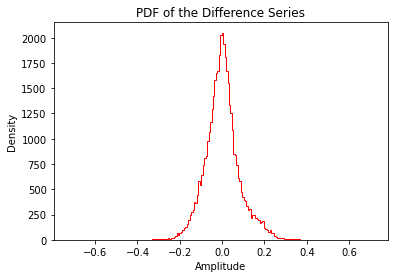

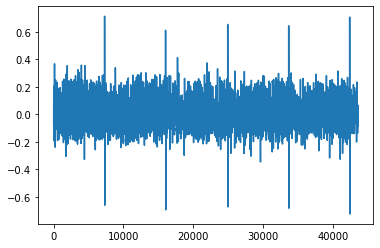

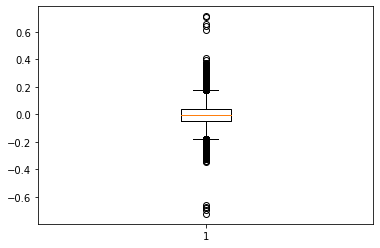

In [0]:
wrangledData = dataWrangling.csvToArray('DayMarkedPJMM.csv')
#wrangledData = dataWrangling.csvToArray('DayMarked (STLF Data Inputs Template) 13112019.csv')

# Check for the shape of the array after wrangling the data
print("The shape of the array is: {}".format(np.shape(wrangledData)))

data_scaled, data_orig = dataPCA.diffandScaleISONE(wrangledData)

## Search confidence level

In [0]:
# Data filtered with confidence level of 90
data_90 = dataFilter.filterWithConfidenceLevel(data_scaled, 90)

# Data filtered with confidence level of 91
data_91 = dataFilter.filterWithConfidenceLevel(data_scaled, 91)

# Data filtered with confidence level of 92
data_92 = dataFilter.filterWithConfidenceLevel(data_scaled, 92)

# Data filtered with confidence level of 93
data_93 = dataFilter.filterWithConfidenceLevel(data_scaled, 93)

# Data filtered with confidence level of 94
data_94 = dataFilter.filterWithConfidenceLevel(data_scaled, 94)

# Data filtered with confidence level of 95
data_95 = dataFilter.filterWithConfidenceLevel(data_scaled, 95)

# Data filtered with confidence level of 96
data_96 = dataFilter.filterWithConfidenceLevel(data_scaled, 96)

# Data filtered with confidence level of 97
data_97 = dataFilter.filterWithConfidenceLevel(data_scaled, 97)

# Data filtered with confidence level of 98
data_98 = dataFilter.filterWithConfidenceLevel(data_scaled, 98)

# Data filtered with confidence level of 99
data_99 = dataFilter.filterWithConfidenceLevel(data_scaled, 99)

# Data filtered with confidence level of 99.73
data_3sigma = dataFilter.filterWithConfidenceLevel(data_scaled, 99.73)

# Data filtered with confidence level of 99.99366
data_4sigma = dataFilter.filterWithConfidenceLevel(data_scaled, 99.99366)

# Data filtered with confidence level of 99.99932
data_4sigma5 = dataFilter.filterWithConfidenceLevel(data_scaled, 99.99932)

In [0]:
MAPE = {
    "data" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0,
        "full": 0
    }
}

MAPE['data']['90'] = confidenceLevelFitness.calculateMAPE(data_90,data_scaled,200,8)

In [0]:
MAPE['data']['91'] = confidenceLevelFitness.calculateMAPE(data_91,data_scaled,200,8)

In [0]:
MAPE['data']['92'] = confidenceLevelFitness.calculateMAPE(data_92,data_scaled,200,8)

In [0]:
MAPE['data']['93'] = confidenceLevelFitness.calculateMAPE(data_93,data_scaled,200,8)

In [0]:
MAPE['data']['94'] = confidenceLevelFitness.calculateMAPE(data_94,data_scaled,200,8)

In [0]:
MAPE['data']['95'] = confidenceLevelFitness.calculateMAPE(data_95,data_scaled,200,8)

In [0]:
MAPE['data']['96'] = confidenceLevelFitness.calculateMAPE(data_96,data_scaled,200,8)

In [0]:
MAPE['data']['97'] = confidenceLevelFitness.calculateMAPE(data_97,data_scaled,200,8)

In [0]:
MAPE['data']['98'] = confidenceLevelFitness.calculateMAPE(data_98,data_scaled,200,8)

In [0]:
MAPE['data']['99'] = confidenceLevelFitness.calculateMAPE(data_99,data_scaled,200,8)

In [0]:
MAPE['data']['3sigma'] = confidenceLevelFitness.calculateMAPE(data_3sigma,data_scaled,200,8)

In [0]:
MAPE['data']['4sigma'] = confidenceLevelFitness.calculateMAPE(data_4sigma,data_scaled,200,8)

In [0]:
MAPE['data']['4sigma5'] = confidenceLevelFitness.calculateMAPE(data_4sigma5,data_scaled,200,8)

In [0]:
MAPE['data']['full'] = confidenceLevelFitness.calculateMAPE(data_scaled,data_scaled,200,8)

In [0]:
print(MAPE['data'])

## Data preparation for the main forecasting algorithm

### With filter

In [0]:
inp = data_98[:-int(0.1*len(data_98))-1]
out = data_98[1:-int(0.1*len(data_98))]
test_inp = data_scaled[-int(0.1*len(data_scaled)):-1]
test_out = data_scaled[-int(0.1*len(data_scaled))+1:]
pretest_inp = data_orig[-int(0.1*len(data_orig)):-1]
pretest_out = data_orig[-int(0.1*len(data_orig))+1:]

In [0]:
data_filtered = np.zeros_like(data_98)
data_unfiltered = np.zeros_like(data_98)
for i in range(len(data_98)):
  data_filtered[i,:,0] = np.e**(np.log(data_orig[i,:,0]) + data_98[i,:,0])
  data_filtered[i,:,1:]= data_orig[i,:,1:]
  data_unfiltered[i,:,0] = np.e**(np.log(data_orig[i,:,0]) + data_scaled[i,:,0])
  data_unfiltered[i,:,1:] = data_orig[i,:,1:]

from sklearn.preprocessing import MinMaxScaler

train_scaler = MinMaxScaler()
test_scaler = MinMaxScaler()

data_filtered[:,:,0] = train_scaler.fit_transform(data_filtered[:,:,0])
data_unfiltered[:,:,0] = test_scaler.fit_transform(data_unfiltered[:,:,0])

inp = data_filtered[:-int(0.1*len(data_filtered))-1]
out = data_filtered[1:-int(0.1*len(data_filtered))]
test_inp = data_unfiltered[-int(0.1*len(data_filtered)):-1]
test_out = data_unfiltered[-int(0.1*len(data_filtered))+1:]
pretest_inp = data_orig[-int(0.1*len(data_filtered)):-1]
pretest_out = data_orig[-int(0.1*len(data_filtered))+1:]

### No filter

In [0]:
inp = data_scaled[:-int(0.1*len(data_scaled))-1]
out = data_scaled[1:-int(0.1*len(data_scaled))]
test_inp = data_scaled[-int(0.1*len(data_scaled)):-1]
test_out = data_scaled[-int(0.1*len(data_scaled))+1:]
pretest_inp = data_orig[-int(0.1*len(data_scaled)):-1]
pretest_out = data_orig[-int(0.1*len(data_scaled))+1:]

In [0]:
from sklearn.preprocessing import MinMaxScaler

test_scaler = MinMaxScaler()

data_orig[:,:,0] = test_scaler.fit_transform(data_orig[:,:,0])

inp = data_orig[:-int(0.1*len(data_orig))-1]
out = data_orig[1:-int(0.1*len(data_orig))]
test_inp = data_orig[-int(0.1*len(data_orig)):-1]
test_out = data_orig[-int(0.1*len(data_orig))+1:]
pretest_inp = data_orig[-int(0.1*len(data_orig)):-1]
pretest_out = data_orig[-int(0.1*len(data_orig))+1:]

In [0]:
np.shape(data_scaled)

## Model preparation

### LSTM 

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
#train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

In [0]:
model = LSTMModelBuilder.build(data_scaled.shape[1],data_scaled.shape[2])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_5 (LSTM)                (None, 24, 20)            12320     
_________________________________________________________________
lstm_6 (LSTM)                (None, 20)                3280      
_________________________________________________________________
dropout (Dropout)            (None, 20)                0         
_________________________________________________________________
dense_10 (Dense)             (None, 24)                504       
Total params: 16,104
Trainable params: 16,104
Non-trainable params: 0
_________________________________________________________________


##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/50
272/273 [============================>.] - ETA: 0s - loss: 0.0517 - mean_squared_error: 0.0047 - mean_absolute_percentage_error: 410.3140Evaluating: epoch 0 ends at 13:01:23.686371 with MAPE 
4.311327976143875
4104343.340931483
4793681.7618965525
273/273 [==============================] - 34s 123ms/step - loss: 0.0517 - mean_squared_error: 0.0047 - mean_absolute_percentage_error: 410.6919 - val_loss: 0.0403 - val_mean_squared_error: 0.0027 - val_mean_absolute_percentage_error: 770.5692
Epoch 2/50
272/273 [============================>.] - ETA: 0s - loss: 0.0403 - mean_squared_error: 0.0027 - mean_absolute_percentage_error: 405.5449Evaluating: epoch 1 ends at 13:01:54.420469 with MAPE 
4.145612013649409
3963464.953436119
4582471.603861845
273/273 [==============================] - 30s 111ms/step - loss: 0.0404 - mean_squared_error: 0.0027 - mean_absolute_percentage_error: 405.1916 - val_loss: 0.0386 - val_mean_squared_error: 0.0025 - 

In [0]:
3.4229892505664465
3324147.6764914957
3980056.6665089168

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      #AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)**2)
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/50
272/273 [============================>.] - ETA: 0s - loss: 0.0315 - mean_squared_error: 0.0017 - mean_absolute_percentage_error: 380.7971Evaluating: epoch 0 ends at 13:27:01.417764 with MAPE 
4.039121211863844
3867796.9176917844
4596021.721427224
273/273 [==============================] - 33s 121ms/step - loss: 0.0315 - mean_squared_error: 0.0017 - mean_absolute_percentage_error: 381.9510 - val_loss: 0.0353 - val_mean_squared_error: 0.0020 - val_mean_absolute_percentage_error: 436.2045
Epoch 2/50
272/273 [============================>.] - ETA: 0s - loss: 0.0308 - mean_squared_error: 0.0017 - mean_absolute_percentage_error: 394.6004Evaluating: epoch 1 ends at 13:27:32.787516 with MAPE 
4.202399007021872
3981520.019276029
4662802.142336157
273/273 [==============================] - 31s 113ms/step - loss: 0.0308 - mean_squared_error: 0.0017 - mean_absolute_percentage_error: 394.2958 - val_loss: 0.0382 - val_mean_squared_error: 0.0023 - 

In [0]:
3.5002222774202902
3402689.1239137226
4115141.708245982

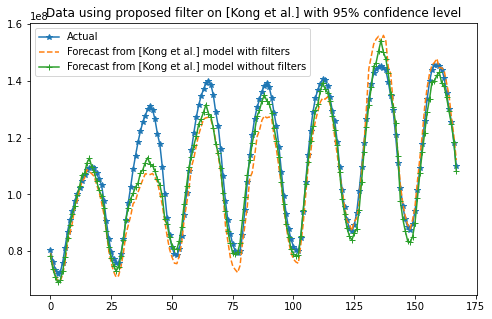

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from [Kong et al.] model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from [Kong et al.] model without filters')
plt.legend()
plt.title("Data using proposed filter on [Kong et al.] with 95% confidence level")
plt.show()

### CNNLSTM 

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
#train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

In [0]:
model = CNNLSTMModelBuilder.build(data_scaled.shape[1],data_scaled.shape[2])
model.summary()

Model: "mnist_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
inp (InputLayer)                [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
conv1d_21 (Conv1D)              (None, 20, 16)       10656       inp[0][0]                        
__________________________________________________________________________________________________
conv1d_22 (Conv1D)              (None, 18, 32)       1568        conv1d_21[0][0]                  
__________________________________________________________________________________________________
conv1d_23 (Conv1D)              (None, 16, 64)       6208        conv1d_22[0][0]                  
________________________________________________________________________________________

##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/50
272/273 [============================>.] - ETA: 0s - loss: 0.0685 - mean_squared_error: 0.0100 - mean_absolute_percentage_error: 1012.4241Evaluating: epoch 0 ends at 16:49:13.904015 with MAPE 
5.522150606587685
5206937.806673802
5971023.3814837225
273/273 [==============================] - 20s 74ms/step - loss: 0.0684 - mean_squared_error: 0.0100 - mean_absolute_percentage_error: 1009.5243 - val_loss: 0.0477 - val_mean_squared_error: 0.0036 - val_mean_absolute_percentage_error: 858.1829
Epoch 2/50
271/273 [============================>.] - ETA: 0s - loss: 0.0517 - mean_squared_error: 0.0042 - mean_absolute_percentage_error: 702.2484Evaluating: epoch 1 ends at 16:49:31.931985 with MAPE 
6.077571610247287
5802557.722006983
6567566.346307108
273/273 [==============================] - 15s 53ms/step - loss: 0.0517 - mean_squared_error: 0.0042 - mean_absolute_percentage_error: 698.9025 - val_loss: 0.0549 - val_mean_squared_error: 0.0047 - 

KeyboardInterrupt: ignored

In [0]:
4.152950006681657
3987458.3394198087
4707120.701705252

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=10,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/10
272/273 [============================>.] - ETA: 0s - loss: 0.0338 - mean_squared_error: 0.0018 - mean_absolute_percentage_error: 500.7116Evaluating: epoch 0 ends at 16:30:07.645793 with MAPE 
4.912950471237156
4711301.711015395
5253762.892988698
273/273 [==============================] - 17s 63ms/step - loss: 0.0338 - mean_squared_error: 0.0018 - mean_absolute_percentage_error: 499.6502 - val_loss: 0.0422 - val_mean_squared_error: 0.0029 - val_mean_absolute_percentage_error: 1218.1752
Epoch 2/10
272/273 [============================>.] - ETA: 0s - loss: 0.0315 - mean_squared_error: 0.0016 - mean_absolute_percentage_error: 420.9528Evaluating: epoch 1 ends at 16:30:23.457262 with MAPE 
4.4037851232576335
4231672.467274368
4780264.8092721775
273/273 [==============================] - 15s 54ms/step - loss: 0.0314 - mean_squared_error: 0.0016 - mean_absolute_percentage_error: 419.9406 - val_loss: 0.0401 - val_mean_squared_error: 0.0027 - 

In [0]:
4.192445436735163
4030197.561013129
4728715.575749914

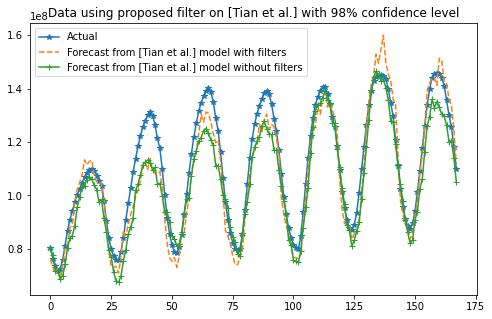

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from [Tian et al.] model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from [Tian et al.] model without filters')
plt.legend()
plt.title("Data using proposed filter on [Tian et al.] with 98% confidence level")
plt.show()

### Wavenet 

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
#train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

In [0]:
model = wavenet.build_wavenet_model(data_scaled.shape[1],data_scaled.shape[2],16,3,18)
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
conv1d_57 (Conv1D)              (None, 24, 16)       6400        input_2[0][0]                    
__________________________________________________________________________________________________
conv1d_58 (Conv1D)              (None, 24, 16)       784         conv1d_57[0][0]                  
__________________________________________________________________________________________________
conv1d_59 (Conv1D)              (None, 24, 16)       784         conv1d_57[0][0]                  
____________________________________________________________________________________________

##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/50
272/273 [============================>.] - ETA: 0s - loss: 0.0548 - mean_squared_error: 0.0045 - mean_absolute_percentage_error: 193.6253Evaluating: epoch 0 ends at 19:25:07.043679 with MAPE 
6.052956046517402
5659749.854659497
6874276.66473388
273/273 [==============================] - 295s 1s/step - loss: 0.0548 - mean_squared_error: 0.0045 - mean_absolute_percentage_error: 193.2762 - val_loss: 0.0510 - val_mean_squared_error: 0.0041 - val_mean_absolute_percentage_error: 215.8931
Epoch 2/50
272/273 [============================>.] - ETA: 0s - loss: 0.0501 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 283.1905Evaluating: epoch 1 ends at 19:29:55.808010 with MAPE 
5.21962942457956
4941459.138103955
5859196.09078068
273/273 [==============================] - 253s 928ms/step - loss: 0.0501 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 282.7728 - val_loss: 0.0445 - val_mean_squared_error: 0.0032 - val_m

KeyboardInterrupt: ignored

In [0]:
3.559792447660026
3424608.3939229795
4054294.407598905

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      #AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)**2)
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=25,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/25
272/273 [============================>.] - ETA: 0s - loss: 0.0547 - mean_squared_error: 0.0045 - mean_absolute_percentage_error: 177.5920Evaluating: epoch 0 ends at 18:29:31.923960 with MAPE 
6.097390582678994
5698455.2507043565
6924595.548416461
273/273 [==============================] - 285s 1s/step - loss: 0.0548 - mean_squared_error: 0.0045 - mean_absolute_percentage_error: 177.3134 - val_loss: 0.0514 - val_mean_squared_error: 0.0041 - val_mean_absolute_percentage_error: 204.6026
Epoch 2/25
272/273 [============================>.] - ETA: 0s - loss: 0.0547 - mean_squared_error: 0.0045 - mean_absolute_percentage_error: 170.7908Evaluating: epoch 1 ends at 18:34:11.972476 with MAPE 
6.108843636881997
5743596.105769022
6951027.165223599
273/273 [==============================] - 253s 928ms/step - loss: 0.0547 - mean_squared_error: 0.0045 - mean_absolute_percentage_error: 170.5335 - val_loss: 0.0517 - val_mean_squared_error: 0.0042 - v

KeyboardInterrupt: ignored

In [0]:
3.6016885726862977
3463870.8078632844
4076884.7237214483

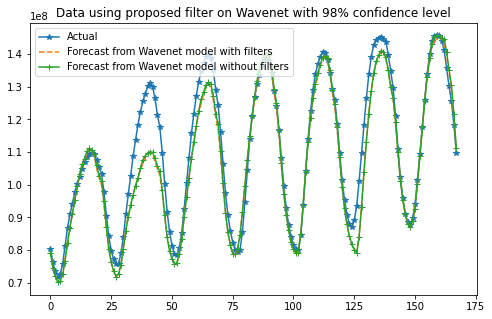

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from Wavenet model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from Wavenet model without filters')
plt.legend()
plt.title("Data using proposed filter on Wavenet with 98% confidence level")
plt.show()

### Wavenet + LSTM

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
#train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

In [0]:
model = wavenet.build_wavenet_model(data_scaled.shape[1],data_scaled.shape[2],16,3,18)
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
conv1d_114 (Conv1D)             (None, 24, 16)       6400        input_3[0][0]                    
__________________________________________________________________________________________________
conv1d_115 (Conv1D)             (None, 24, 16)       784         conv1d_114[0][0]                 
__________________________________________________________________________________________________
conv1d_116 (Conv1D)             (None, 24, 16)       784         conv1d_114[0][0]                 
____________________________________________________________________________________________

##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
#plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      #plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=500,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/500
272/273 [============================>.] - ETA: 0s - loss: 0.0248 - mean_squared_error: 0.0013 - mean_absolute_percentage_error: 391.5258Evaluating: epoch 0 ends at 20:58:24.467962 with MAPE 
3.5701474076057966
3428038.209665761
4057445.480987199
273/273 [==============================] - 263s 965ms/step - loss: 0.0247 - mean_squared_error: 0.0013 - mean_absolute_percentage_error: 390.4117 - val_loss: 0.0292 - val_mean_squared_error: 0.0016 - val_mean_absolute_percentage_error: 909.7153
Epoch 2/500
272/273 [============================>.] - ETA: 0s - loss: 0.0245 - mean_squared_error: 0.0013 - mean_absolute_percentage_error: 374.0374Evaluating: epoch 1 ends at 21:02:41.146170 with MAPE 
3.5827582228678088
3446878.0760109224
4070856.60192772
273/273 [==============================] - 252s 925ms/step - loss: 0.0244 - mean_squared_error: 0.0012 - mean_absolute_percentage_error: 373.0433 - val_loss: 0.0290 - val_mean_squared_error: 0.00

KeyboardInterrupt: ignored

In [0]:
from tensorflow import keras
from tensorflow.keras import layers, Model
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.000001
  else:
    return 0.000001 * np.math.exp(0.1 * (10 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
model_fine = model.output
model_fine = layers.Reshape((24,1))(model_fine)
model_fine = layers.LSTM(100,return_sequences = True, activation='relu')(model_fine)
model_fine = layers.Dense(1)(model_fine)
model_fine = layers.Flatten()(model_fine)
model_final = Model(inputs=model.input, outputs=model_fine)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])



Train on 273 steps, validate on 135 steps
Epoch 1/50
272/273 [============================>.] - ETA: 0s - loss: 0.0239 - mean_squared_error: 0.0012 - mean_absolute_percentage_error: 350.5135Evaluating: epoch 0 ends at 21:25:45.357616 with MAPE 
3.539693634817098
3406576.6528809867
4029700.5747583597
273/273 [==============================] - 264s 968ms/step - loss: 0.0238 - mean_squared_error: 0.0012 - mean_absolute_percentage_error: 349.5582 - val_loss: 0.0288 - val_mean_squared_error: 0.0016 - val_mean_absolute_percentage_error: 1208.2687
Epoch 2/50
272/273 [============================>.] - ETA: 0s - loss: 0.0237 - mean_squared_error: 0.0012 - mean_absolute_percentage_error: 350.1556Evaluating: epoch 1 ends at 21:30:02.357284 with MAPE 
3.540759517296284
3407851.650148021
4030829.350513167
273/273 [==============================] - 252s 924ms/step - loss: 0.0237 - mean_squared_error: 0.0012 - mean_absolute_percentage_error: 349.2355 - val_loss: 0.0288 - val_mean_squared_error: 0.001

KeyboardInterrupt: ignored

In [0]:
3.539693634817098
3406576.6528809867
4029700.5747583597

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
#plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      #plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      #AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)**2)
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=500,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/500
272/273 [============================>.] - ETA: 0s - loss: 0.0492 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 5512.8315Evaluating: epoch 0 ends at 23:57:35.776178 with MAPE 
6.622000204974834
1302.002388145604
1635.8096938668857
273/273 [==============================] - 269s 984ms/step - loss: 0.0493 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 5493.0996 - val_loss: 0.0480 - val_mean_squared_error: 0.0035 - val_mean_absolute_percentage_error: 9400.5996
Epoch 2/500
272/273 [============================>.] - ETA: 0s - loss: 0.0496 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 11589.4629Evaluating: epoch 1 ends at 00:02:00.540468 with MAPE 
6.564630119162653
1304.4957647077645
1614.739487032414
273/273 [==============================] - 249s 913ms/step - loss: 0.0495 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 11548.3525 - val_loss: 0.0466 - val_mean_squared_erro

KeyboardInterrupt: ignored

KeyboardInterrupt: ignored

In [0]:
from tensorflow import keras
from tensorflow.keras import layers, Model
#for tensorflow 2.0
import datetime
plot_val1= []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (10 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
model_fine = model.output
model_fine = layers.Reshape((24,1))(model_fine)
model_fine = layers.LSTM(100,return_sequences = True, activation='relu')(model_fine)
model_fine = layers.Dense(1)(model_fine)
model_fine = layers.Flatten()(model_fine)
model_final = Model(inputs=model.input, outputs=model_fine)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])



Train on 273 steps, validate on 135 steps
Epoch 1/50
272/273 [============================>.] - ETA: 0s - loss: 0.0463 - mean_squared_error: 0.0034 - mean_absolute_percentage_error: 2235.1934Evaluating: epoch 0 ends at 06:31:03.622050 with MAPE 
6.4694626098231485
1279.6489592015394
1609.4325283487692
273/273 [==============================] - 259s 948ms/step - loss: 0.0464 - mean_squared_error: 0.0034 - mean_absolute_percentage_error: 2227.3811 - val_loss: 0.0458 - val_mean_squared_error: 0.0033 - val_mean_absolute_percentage_error: 4495.3145
Epoch 2/50
272/273 [============================>.] - ETA: 0s - loss: 0.0465 - mean_squared_error: 0.0034 - mean_absolute_percentage_error: 1498.2849Evaluating: epoch 1 ends at 06:35:17.173465 with MAPE 
6.464711305413605
1279.6564881840495
1608.7340206028962
273/273 [==============================] - 251s 918ms/step - loss: 0.0465 - mean_squared_error: 0.0034 - mean_absolute_percentage_error: 1493.2542 - val_loss: 0.0457 - val_mean_squared_error

KeyboardInterrupt: ignored

In [0]:
6.451660636678543
1279.6313291944734
1605.4005080892537

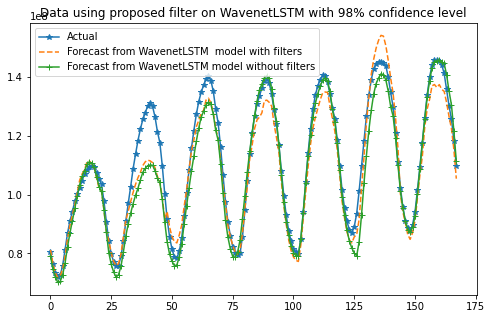

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from WavenetLSTM  model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from WavenetLSTM model without filters')
plt.legend()
plt.title("Data using proposed filter on WavenetLSTM with 98% confidence level")
plt.show()

### DAE

#### Training

##### With filter

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

bbrbm = RBMDAE.BBRBM(n_visible=24, n_hidden=64, learning_rate=0.001, momentum=0.95, use_tqdm=True)
errs = bbrbm.fit(x_train[:,:,0], n_epoches=200, batch_size=4)



Instructions for updating:
Use `tf.cast` instead.


Epoch: 0: 100%|##########| 274/274 [00:02<00:00, 116.50it/s]
Train error: 0.2751

Epoch: 1: 100%|##########| 274/274 [00:00<00:00, 369.05it/s]
Train error: 0.1958

Epoch: 2: 100%|##########| 274/274 [00:00<00:00, 349.76it/s]
Train error: 0.1408

Epoch: 3: 100%|##########| 274/274 [00:00<00:00, 374.94it/s]
Train error: 0.1032

Epoch: 4: 100%|##########| 274/274 [00:00<00:00, 365.88it/s]
Train error: 0.0773

Epoch: 5: 100%|##########| 274/274 [00:00<00:00, 364.99it/s]
Train error: 0.0593

Epoch: 6: 100%|##########| 274/274 [00:00<00:00, 369.72it/s]
Train error: 0.0467

Epoch: 7: 100%|##########| 274/274 [00:00<00:00, 361.12it/s]
Train error: 0.0375

Epoch: 8: 100%|##########| 274/274 [00:00<00:00, 369.90it/s]
Train error: 0.0308

Epoch: 9: 100%|##########| 274/274 [00:00<00:00, 363.77it/s]
Train error: 0.0258

Epoch: 10: 100%|##########| 274/274 [00:00<00:00, 358.69it/s]
Train error: 0.0219

Epoch: 11: 100%|##########| 274/274 [00:00<

In [0]:
AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val = []
for i in range(len(test_inp)):
  test_pred = bbrbm.reconstruct(test_inp[i,:,0:1].reshape(-1,24))
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

6.050606044780152
5645458.178944004
6881657.097681694


In [0]:
6.050606044780152
5645458.178944004
6881657.097681694

##### No filter

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

bbrbm = RBMDAE.BBRBM(n_visible=24, n_hidden=64, learning_rate=0.001, momentum=0.95, use_tqdm=True)
errs = bbrbm.fit(x_train[:,:,0], n_epoches=150, batch_size=4)

Epoch: 0: 100%|##########| 274/274 [00:00<00:00, 346.62it/s]
Train error: 0.2354

Epoch: 1: 100%|##########| 274/274 [00:00<00:00, 359.11it/s]
Train error: 0.1676

Epoch: 2: 100%|##########| 274/274 [00:00<00:00, 350.48it/s]
Train error: 0.1211

Epoch: 3: 100%|##########| 274/274 [00:00<00:00, 358.04it/s]
Train error: 0.0895

Epoch: 4: 100%|##########| 274/274 [00:00<00:00, 361.87it/s]
Train error: 0.0678

Epoch: 5: 100%|##########| 274/274 [00:00<00:00, 356.74it/s]
Train error: 0.0527

Epoch: 6: 100%|##########| 274/274 [00:00<00:00, 356.70it/s]
Train error: 0.0419

Epoch: 7: 100%|##########| 274/274 [00:00<00:00, 351.79it/s]
Train error: 0.0340

Epoch: 8: 100%|##########| 274/274 [00:00<00:00, 380.78it/s]
Train error: 0.0281

Epoch: 9: 100%|##########| 274/274 [00:00<00:00, 357.16it/s]
Train error: 0.0237

Epoch: 10: 100%|##########| 274/274 [00:00<00:00, 360.31it/s]
Train error: 0.0203

Epoch: 11: 100%|##########| 274/274 [00:00<00:00, 353.57it/s]
Train error: 0.0176

Epoch: 12: 100

In [0]:
AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val1 = []
for i in range(len(test_inp)):
  test_pred = bbrbm.reconstruct(test_inp[i,:,0:1].reshape(-1,24))
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

6.052395940856418
5641764.380505451
6879584.29225612


In [0]:
6.052395940856418
5641764.380505451
6879584.29225612

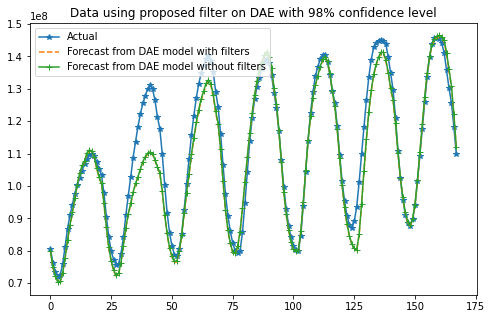

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0,:].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from DAE model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from DAE model without filters')
plt.legend()
plt.title("Data using proposed filter on DAE with 98% confidence level")
plt.show()

### WNN 

In [0]:
inp_high, inp_low_low, inp_low_high = waveletFunction.extract(inp)

In [0]:
# for pure keras
x_train_high, x_val_high, y_train, y_val = train_test_split(inp_high,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

In [0]:
# for pure keras
x_train_low_low, x_val_low_low, y_train, y_val = train_test_split(inp_low_low,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

In [0]:
# for pure keras
x_train_low_high, x_val_low_high, y_train, y_val = train_test_split(inp_low_high,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

In [0]:
# define two sets of inputs
inputA = tf.keras.Input(shape=(x_train_high.shape[1],x_train_high.shape[2]))
inputB = tf.keras.Input(shape=(x_train_low_low.shape[1],x_train_low_low.shape[2]))
inputC = tf.keras.Input(shape=(x_train_low_high.shape[1],x_train_low_high.shape[2]))

# the first branch opreates on the first input
x = tf.keras.layers.Dense(100, activation="selu")(inputA)
x = tf.keras.layers.Dense(100, activation="selu")(x)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dropout(0.3)(x)
x = tf.keras.layers.Dense(24, activation="linear")(x)
x = tf.keras.Model(inputs = inputA, outputs = x)

# the second branch opreates on the second input
y = tf.keras.layers.Dense(100, activation="selu")(inputB)
y = tf.keras.layers.Dense(100, activation="selu")(y)
y = tf.keras.layers.Flatten()(y)
y = tf.keras.layers.Dropout(0.3)(y)
y = tf.keras.layers.Dense(24, activation="linear")(y)
y = tf.keras.Model(inputs = inputB, outputs = y)

# the third branch opreates on the third input
z = tf.keras.layers.Dense(100, activation="selu")(inputC)
z = tf.keras.layers.Dense(100, activation="selu")(z)
z = tf.keras.layers.Flatten()(z)
z = tf.keras.layers.Dropout(0.3)(z)
z = tf.keras.layers.Dense(24, activation="linear")(z)
z = tf.keras.Model(inputs = inputC, outputs = z)

total = tf.keras.layers.Add()([x.output,y.output,z.output])

model = tf.keras.Model(inputs=[x.input, y.input, z.input], outputs=total)

In [0]:
model.summary()

Model: "model_35"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_25 (InputLayer)           [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
input_26 (InputLayer)           [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
input_27 (InputLayer)           [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
dense_72 (Dense)                (None, 24, 100)      13400       input_25[0][0]                   
___________________________________________________________________________________________

##### Training

###### With filter

In [0]:
#for tensorflow 2.0

def scheduler(epoch):
  if epoch < 5:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer='rmsprop', loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit([x_train_high,x_train_low_low,x_train_low_high],y_train[:,:,0], batch_size=4, epochs=50,
                      validation_data=([x_val_high,x_val_low_low,x_val_low_high],y_val[:,:,0]),callbacks=[callback])

Train on 1095 samples, validate on 540 samples
Epoch 1/50
1095/1095 [==============================] - 3s 3ms/sample - loss: 4.6169 - mean_squared_error: 63.0875 - mean_absolute_percentage_error: 112383.7578 - val_loss: 2.7066 - val_mean_squared_error: 12.0281 - val_mean_absolute_percentage_error: 198691.7344
Epoch 2/50
1095/1095 [==============================] - 2s 2ms/sample - loss: 2.8306 - mean_squared_error: 12.9198 - mean_absolute_percentage_error: 45135.6328 - val_loss: 2.3882 - val_mean_squared_error: 8.9834 - val_mean_absolute_percentage_error: 368566.3750
Epoch 3/50
1095/1095 [==============================] - 2s 2ms/sample - loss: 2.8949 - mean_squared_error: 13.7262 - mean_absolute_percentage_error: 64914.6445 - val_loss: 3.0314 - val_mean_squared_error: 14.3317 - val_mean_absolute_percentage_error: 75142.7578
Epoch 4/50
1095/1095 [==============================] - 2s 2ms/sample - loss: 2.9827 - mean_squared_error: 14.1408 - mean_absolute_percentage_error: 43547.1211 - val

In [0]:
import pywt

testinp_high, testinp_low_low, testinp_low_high = waveletFunction.extract(test_inp)

AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val = []
for i in range(len(test_inp)):
  test_pred = model.predict([testinp_high[i].reshape(-1,24,133),testinp_low_low[i].reshape(-1,24,133),testinp_low_high[i].reshape(-1,24,133)])
  
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred.reshape(-1)
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

3.5227531822414146
3418438.3851726702
4061634.606719081


In [0]:
3.5227531822414146
3418438.3851726702
4061634.606719081

###### No filter

In [0]:
#for tensorflow 2.0

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer='rmsprop', loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit([x_train_high,x_train_low_low,x_train_low_high],y_train[:,:,0], batch_size=4, epochs=25,
                      validation_data=([x_val_high,x_val_low_low,x_val_low_high],y_val[:,:,0]),callbacks=[callback])

Train on 1095 samples, validate on 540 samples
Epoch 1/25
1095/1095 [==============================] - 3s 3ms/sample - loss: 0.6615 - mean_squared_error: 0.7242 - mean_absolute_percentage_error: 10880.6328 - val_loss: 0.4649 - val_mean_squared_error: 0.3342 - val_mean_absolute_percentage_error: 8876.6162
Epoch 2/25
1095/1095 [==============================] - 2s 2ms/sample - loss: 0.4237 - mean_squared_error: 0.2854 - mean_absolute_percentage_error: 7508.0879 - val_loss: 0.3049 - val_mean_squared_error: 0.1442 - val_mean_absolute_percentage_error: 8361.1455
Epoch 3/25
1095/1095 [==============================] - 2s 2ms/sample - loss: 0.2993 - mean_squared_error: 0.1423 - mean_absolute_percentage_error: 4951.8799 - val_loss: 0.2436 - val_mean_squared_error: 0.0911 - val_mean_absolute_percentage_error: 53516.4297
Epoch 4/25
1095/1095 [==============================] - 2s 2ms/sample - loss: 0.2255 - mean_squared_error: 0.0800 - mean_absolute_percentage_error: 3384.4556 - val_loss: 0.1822 

In [0]:
import pywt

testinp_high, testinp_low_low, testinp_low_high = waveletFunction.extract(test_inp)

AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val1 = []
for i in range(len(test_inp)):
  test_pred = model.predict([testinp_high[i].reshape(-1,24,133),testinp_low_low[i].reshape(-1,24,133),testinp_low_high[i].reshape(-1,24,133)])
  
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred.reshape(-1)
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

3.6331669328361476
3525543.550924314
4106249.429547678


In [0]:
3.6331669328361476
3525543.550924314
4106249.429547678

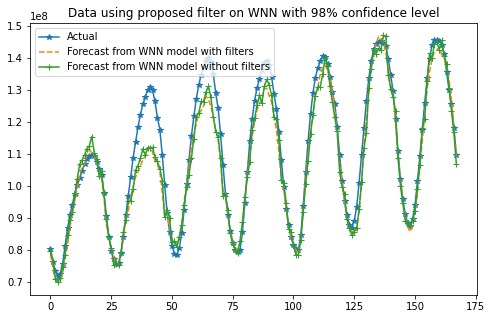

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0,:].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from WNN model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from WNN model without filters')
plt.legend()
plt.title("Data using proposed filter on WNN with 98% confidence level")
plt.show()

# Monday dataset

## Setup environment, import libraries

In [0]:
import tensorflow as tf
import pandas as pd
import numpy as np
import os
from collections import Counter
import matplotlib
import matplotlib.pyplot as plt
import random
import shutil
import tensorflow.contrib.learn as tflearn
import tensorflow.contrib.layers as tflayers
from tensorflow.contrib.learn.python.learn import learn_runner
import tensorflow.contrib.metrics as metrics
import tensorflow.contrib.rnn as rnn
from google.colab import files
from matplotlib.pyplot import figure
from sklearn.model_selection import train_test_split

#Set a fixed random value so that every time the code is running it will yield the same results.
from numpy.random import seed
seed(1611)

#Set a fixed random value so that every time the code is running it will yield the same results.
from tensorflow import set_random_seed
set_random_seed(3116)

!git clone https://github.com/a11to1n3/StatFilterAppliedInSTLFDeeplearning.git


# Change to the repository folder
%cd StatFilterAppliedInSTLFDeeplearning

# Import all the neccessary modules in the cloned repository
import dataWrangling
import dataPCA
import dataHourSplit
import dataFilter
import confidenceLevelFitness
import LSTMModelBuilder
import CNNLSTMModelBuilder
import wavenet
import RBMDAE
import waveletFunction
import modelBuilder

Cloning into 'StatFilterAppliedInSTLFDeeplearning'...
remote: Enumerating objects: 141, done.
remote: Counting objects: 100% (141/141), done.
remote: Compressing objects: 100% (100/100), done.
remote: Total 141 (delta 83), reused 99 (delta 41), pack-reused 0
Receiving objects: 100% (141/141), 23.13 KiB | 147.00 KiB/s, done.
Resolving deltas: 100% (83/83), done.
/content/StatFilterAppliedInSTLFDeeplearning/StatFilterAppliedInSTLFDeeplearning


## Load dataset

In [0]:
# Run this and select the DayMarked.csv file in your computer
files.upload()

Saving DayMarked.csv to DayMarked.csv


{'DayMarked.csv': b'Thu,Ngay,00:00,01:00,02:00,03:00,04:00,05:00,06:00,07:00,08:00,09:00,10:00,11:00,12:00,13:00,14:00,15:00,16:00,17:00,18:00,19:00,20:00,21:00,22:00,23:00,Holiday,Week number\r\n2,11/01/10,993.6,953.9,956.2,968.6,1020.7,1158.4,1375.6,1813.2,1938.2,2011.7,2022.8,1776.5,1847.6,2046.3,2077.8,2101.4,2017.6,2052,1939.7,1892.4,1815.6,1660.7,1474,1342.6,0,44\r\n3,11/2/10,1231.7,1183.7,1170.1,1168.9,1190.9,1318.8,1482,1967.6,2150.6,2233,2239.6,2002.7,2099.3,2246.7,2249.9,2265.5,2206.2,2116.4,2019.5,1936.8,1870.3,1712.7,1510,1285.8,0,44\r\n4,11/3/10,1243.6,1221.1,1197.6,1198.2,1219.8,1321.9,1481.2,1934.6,2126.8,2187.3,2188.6,1959.9,2028.7,2218.2,2270,2270.6,2118.1,2141.3,2006.6,1975.2,1921.6,1760.1,1585.7,1427.3,0,44\r\n5,11/4/10,1303.3,1255.7,1219.4,1213.3,1249.4,1230,1481.1,1910.8,2062.8,2173.6,2170.7,1929.7,2048.5,2237.5,2243,2023.9,1952.8,1980.6,2015.7,1949.3,1901.7,1729,1534,1292.4,0,44\r\n6,11/5/10,1176.8,1178.3,1165.2,1171.7,1192.7,1313,1489.9,1947.2,2081.1,2153.8,2166.

## Pre-process dataset to 133 dimensions and scale it

The shape of the array is: (1818, 24, 133)


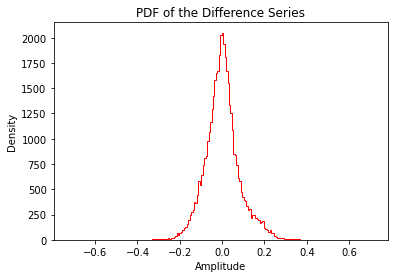

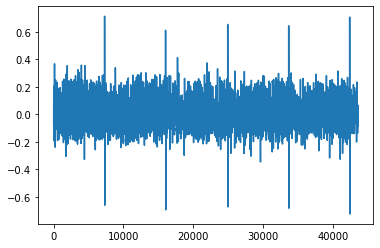

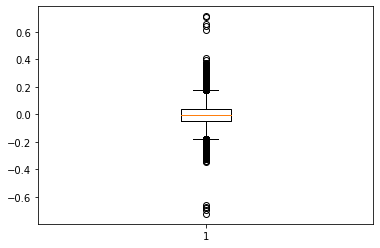

In [0]:
wrangledData = dataWrangling.csvToArray('DayMarked.csv')
#wrangledData = dataWrangling.csvToArray('DayMarked (STLF Data Inputs Template) 13112019.csv')

# Check for the shape of the array after wrangling the data
print("The shape of the array is: {}".format(np.shape(wrangledData)))

# x_scaled is the scaled data conducted by the log and differencing functions
# x_orig is the original data without being scaled
# prex_orig is the original data without being scaled of the day before analyzing day
mon_scaled, sun_scaled, rests_scaled, mon_orig, sun_orig, rests_orig, presun_orig, premon_orig = dataPCA.plotPCAandSplit(wrangledData)

## For either Monday or Sunday, split the data into 4 timespans
- Monday: 0h - 4h, 5h - 6h, 7h - 16h, 17h - 23h
- Sunday: 0h - 4h, 5h - 6h, 7h - 15h, 16h - 23h

In [0]:
mon_to4, mon_5to6, mon_7to16, mon_17to23 = dataHourSplit.splitToDifferentTimeSpan(mon_scaled, 'Mon')
sun_to4, sun_5to6, sun_7to15, sun_16to23 = dataHourSplit.splitToDifferentTimeSpan(sun_scaled, 'Sun')

## Filter data for each given confidence level

In [0]:
# Data filtered with confidence level of 90
data_90 = dataFilter.filterWithConfidenceLevel(data_scaled, 90)

# Data filtered with confidence level of 91
data_91 = dataFilter.filterWithConfidenceLevel(data_scaled, 91)

# Data filtered with confidence level of 92
data_92 = dataFilter.filterWithConfidenceLevel(data_scaled, 92)

# Data filtered with confidence level of 93
data_93 = dataFilter.filterWithConfidenceLevel(data_scaled, 93)

# Data filtered with confidence level of 94
data_94 = dataFilter.filterWithConfidenceLevel(data_scaled, 94)

# Data filtered with confidence level of 95
data_95 = dataFilter.filterWithConfidenceLevel(data_scaled, 95)

# Data filtered with confidence level of 96
data_96 = dataFilter.filterWithConfidenceLevel(data_scaled, 96)

# Data filtered with confidence level of 97
data_97 = dataFilter.filterWithConfidenceLevel(data_scaled, 97)

# Data filtered with confidence level of 98
data_98 = dataFilter.filterWithConfidenceLevel(data_scaled, 98)

# Data filtered with confidence level of 99
data_99 = dataFilter.filterWithConfidenceLevel(data_scaled, 99)

# Data filtered with confidence level of 99.73
data_3sigma = dataFilter.filterWithConfidenceLevel(data_scaled, 99.73)

# Data filtered with confidence level of 99.99366
data_4sigma = dataFilter.filterWithConfidenceLevel(data_scaled, 99.99366)

# Data filtered with confidence level of 99.99932
data_4sigma5 = dataFilter.filterWithConfidenceLevel(data_scaled, 99.99932)

NameError: ignored

In [0]:
# Monday data filtered with confidence level of 90
mon_to4_90 = dataFilter.filterWithConfidenceLevel(mon_to4, 90)
mon_5to6_90 = dataFilter.filterWithConfidenceLevel(mon_5to6, 90)
mon_7to16_90 = dataFilter.filterWithConfidenceLevel(mon_7to16, 90)
mon_17to23_90 = dataFilter.filterWithConfidenceLevel(mon_17to23, 90)

# Monday data filtered with confidence level of 91
mon_to4_91 = dataFilter.filterWithConfidenceLevel(mon_to4, 91)
mon_5to6_91 = dataFilter.filterWithConfidenceLevel(mon_5to6, 91)
mon_7to16_91 = dataFilter.filterWithConfidenceLevel(mon_7to16, 91)
mon_17to23_91 = dataFilter.filterWithConfidenceLevel(mon_17to23, 91)

# Monday data filtered with confidence level of 92
mon_to4_92 = dataFilter.filterWithConfidenceLevel(mon_to4, 92)
mon_5to6_92 = dataFilter.filterWithConfidenceLevel(mon_5to6, 92)
mon_7to16_92 = dataFilter.filterWithConfidenceLevel(mon_7to16, 92)
mon_17to23_92 = dataFilter.filterWithConfidenceLevel(mon_17to23, 92)

# Monday data filtered with confidence level of 93
mon_to4_93 = dataFilter.filterWithConfidenceLevel(mon_to4, 93)
mon_5to6_93 = dataFilter.filterWithConfidenceLevel(mon_5to6, 93)
mon_7to16_93 = dataFilter.filterWithConfidenceLevel(mon_7to16, 93)
mon_17to23_93 = dataFilter.filterWithConfidenceLevel(mon_17to23, 93)

# Monday data filtered with confidence level of 94
mon_to4_94 = dataFilter.filterWithConfidenceLevel(mon_to4, 94)
mon_5to6_94 = dataFilter.filterWithConfidenceLevel(mon_5to6, 94)
mon_7to16_94 = dataFilter.filterWithConfidenceLevel(mon_7to16, 94)
mon_17to23_94 = dataFilter.filterWithConfidenceLevel(mon_17to23, 94)

# Monday data filtered with confidence level of 95
mon_to4_95 = dataFilter.filterWithConfidenceLevel(mon_to4, 95)
mon_5to6_95 = dataFilter.filterWithConfidenceLevel(mon_5to6, 95)
mon_7to16_95 = dataFilter.filterWithConfidenceLevel(mon_7to16, 95)
mon_17to23_95 = dataFilter.filterWithConfidenceLevel(mon_17to23, 95)

# Monday data filtered with confidence level of 96
mon_to4_96 = dataFilter.filterWithConfidenceLevel(mon_to4, 96)
mon_5to6_96 = dataFilter.filterWithConfidenceLevel(mon_5to6, 96)
mon_7to16_96 = dataFilter.filterWithConfidenceLevel(mon_7to16, 96)
mon_17to23_96 = dataFilter.filterWithConfidenceLevel(mon_17to23, 96)

# Monday data filtered with confidence level of 97
mon_to4_97 = dataFilter.filterWithConfidenceLevel(mon_to4, 97)
mon_5to6_97 = dataFilter.filterWithConfidenceLevel(mon_5to6, 97)
mon_7to16_97 = dataFilter.filterWithConfidenceLevel(mon_7to16, 97)
mon_17to23_97 = dataFilter.filterWithConfidenceLevel(mon_17to23, 97)

# Monday data filtered with confidence level of 98
mon_to4_98 = dataFilter.filterWithConfidenceLevel(mon_to4, 98)
mon_5to6_98 = dataFilter.filterWithConfidenceLevel(mon_5to6, 98)
mon_7to16_98 = dataFilter.filterWithConfidenceLevel(mon_7to16, 98)
mon_17to23_98 = dataFilter.filterWithConfidenceLevel(mon_17to23, 98)

# Monday data filtered with confidence level of 99
mon_to4_99 = dataFilter.filterWithConfidenceLevel(mon_to4, 99)
mon_5to6_99 = dataFilter.filterWithConfidenceLevel(mon_5to6, 99)
mon_7to16_99 = dataFilter.filterWithConfidenceLevel(mon_7to16, 99)
mon_17to23_99 = dataFilter.filterWithConfidenceLevel(mon_17to23, 99)

# Monday data filtered with confidence level of 99.73
mon_to4_3sigma = dataFilter.filterWithConfidenceLevel(mon_to4, 99.73)
mon_5to6_3sigma = dataFilter.filterWithConfidenceLevel(mon_5to6, 99.73)
mon_7to16_3sigma = dataFilter.filterWithConfidenceLevel(mon_7to16, 99.73)
mon_17to23_3sigma = dataFilter.filterWithConfidenceLevel(mon_17to23, 99.73)

# Monday data filtered with confidence level of 99.99366
mon_to4_4sigma = dataFilter.filterWithConfidenceLevel(mon_to4, 99.99366)
mon_5to6_4sigma = dataFilter.filterWithConfidenceLevel(mon_5to6, 99.99366)
mon_7to16_4sigma = dataFilter.filterWithConfidenceLevel(mon_7to16, 99.99366)
mon_17to23_4sigma = dataFilter.filterWithConfidenceLevel(mon_17to23, 99.99366)

# Monday data filtered with confidence level of 99.99932
mon_to4_4sigma5 = dataFilter.filterWithConfidenceLevel(mon_to4, 99.99932)
mon_5to6_4sigma5 = dataFilter.filterWithConfidenceLevel(mon_5to6, 99.99932)
mon_7to16_4sigma5 = dataFilter.filterWithConfidenceLevel(mon_7to16, 99.99932)
mon_17to23_4sigma5 = dataFilter.filterWithConfidenceLevel(mon_17to23, 99.99932)

In [0]:
# Sunday data filtered with confidence level of 90
sun_to4_90 = dataFilter.filterWithConfidenceLevel(sun_to4, 90)
sun_5to6_90 = dataFilter.filterWithConfidenceLevel(sun_5to6, 90)
sun_7to15_90 = dataFilter.filterWithConfidenceLevel(sun_7to15, 90)
sun_16to23_90 = dataFilter.filterWithConfidenceLevel(sun_16to23, 90)

# Sunday data filtered with confidence level of 91
sun_to4_91 = dataFilter.filterWithConfidenceLevel(sun_to4, 91)
sun_5to6_91 = dataFilter.filterWithConfidenceLevel(sun_5to6, 91)
sun_7to15_91 = dataFilter.filterWithConfidenceLevel(sun_7to15, 91)
sun_16to23_91 = dataFilter.filterWithConfidenceLevel(sun_16to23, 91)

# Sunday data filtered with confidence level of 92
sun_to4_92 = dataFilter.filterWithConfidenceLevel(sun_to4, 92)
sun_5to6_92 = dataFilter.filterWithConfidenceLevel(sun_5to6, 92)
sun_7to15_92 = dataFilter.filterWithConfidenceLevel(sun_7to15, 92)
sun_16to23_92 = dataFilter.filterWithConfidenceLevel(sun_16to23, 92)

# Sunday data filtered with confidence level of 93
sun_to4_93 = dataFilter.filterWithConfidenceLevel(sun_to4, 93)
sun_5to6_93 = dataFilter.filterWithConfidenceLevel(sun_5to6, 93)
sun_7to15_93 = dataFilter.filterWithConfidenceLevel(sun_7to15, 93)
sun_16to23_93 = dataFilter.filterWithConfidenceLevel(sun_16to23, 93)

# Sunday data filtered with confidence level of 94
sun_to4_94 = dataFilter.filterWithConfidenceLevel(sun_to4, 94)
sun_5to6_94 = dataFilter.filterWithConfidenceLevel(sun_5to6, 94)
sun_7to15_94 = dataFilter.filterWithConfidenceLevel(sun_7to15, 94)
sun_16to23_94 = dataFilter.filterWithConfidenceLevel(sun_16to23, 94)

# Sunday data filtered with confidence level of 95
sun_to4_95 = dataFilter.filterWithConfidenceLevel(sun_to4, 95)
sun_5to6_95 = dataFilter.filterWithConfidenceLevel(sun_5to6, 95)
sun_7to15_95 = dataFilter.filterWithConfidenceLevel(sun_7to15, 95)
sun_16to23_95 = dataFilter.filterWithConfidenceLevel(sun_16to23, 95)

# Sunday data filtered with confidence level of 96
sun_to4_96 = dataFilter.filterWithConfidenceLevel(sun_to4, 96)
sun_5to6_96 = dataFilter.filterWithConfidenceLevel(sun_5to6, 96)
sun_7to15_96 = dataFilter.filterWithConfidenceLevel(sun_7to15, 96)
sun_16to23_96 = dataFilter.filterWithConfidenceLevel(sun_16to23, 96)

# Sunday data filtered with confidence level of 97
sun_to4_97 = dataFilter.filterWithConfidenceLevel(sun_to4, 97)
sun_5to6_97 = dataFilter.filterWithConfidenceLevel(sun_5to6, 97)
sun_7to15_97 = dataFilter.filterWithConfidenceLevel(sun_7to15, 97)
sun_16to23_97 = dataFilter.filterWithConfidenceLevel(sun_16to23, 97)

# Sunday data filtered with confidence level of 98
sun_to4_98 = dataFilter.filterWithConfidenceLevel(sun_to4, 98)
sun_5to6_98 = dataFilter.filterWithConfidenceLevel(sun_5to6, 98)
sun_7to15_98 = dataFilter.filterWithConfidenceLevel(sun_7to15, 98)
sun_16to23_98 = dataFilter.filterWithConfidenceLevel(sun_16to23, 98)

# Sunday data filtered with confidence level of 99
sun_to4_99 = dataFilter.filterWithConfidenceLevel(sun_to4, 99)
sun_5to6_99 = dataFilter.filterWithConfidenceLevel(sun_5to6, 99)
sun_7to15_99 = dataFilter.filterWithConfidenceLevel(sun_7to15, 99)
sun_16to23_99 = dataFilter.filterWithConfidenceLevel(sun_16to23, 99)

# Sunday data filtered with confidence level of 99.73
sun_to4_3sigma = dataFilter.filterWithConfidenceLevel(sun_to4, 99.73)
sun_5to6_3sigma = dataFilter.filterWithConfidenceLevel(sun_5to6, 99.73)
sun_7to15_3sigma = dataFilter.filterWithConfidenceLevel(sun_7to15, 99.73)
sun_16to23_3sigma = dataFilter.filterWithConfidenceLevel(sun_16to23, 99.73)

# Sunday data filtered with confidence level of 99.99366
sun_to4_4sigma = dataFilter.filterWithConfidenceLevel(sun_to4, 99.99366)
sun_5to6_4sigma = dataFilter.filterWithConfidenceLevel(sun_5to6, 99.99366)
sun_7to15_4sigma = dataFilter.filterWithConfidenceLevel(sun_7to15, 99.99366)
sun_16to23_4sigma = dataFilter.filterWithConfidenceLevel(sun_16to23, 99.99366)

# Sunday data filtered with confidence level of 99.99932
sun_to4_4sigma5 = dataFilter.filterWithConfidenceLevel(sun_to4, 99.99932)
sun_5to6_4sigma5 = dataFilter.filterWithConfidenceLevel(sun_5to6, 99.99932)
sun_7to15_4sigma5 = dataFilter.filterWithConfidenceLevel(sun_7to15, 99.99932)
sun_16to23_4sigma5 = dataFilter.filterWithConfidenceLevel(sun_16to23, 99.99932)

In [0]:
# Remaining days data filtered with confidence level of 90
rests_scaled_90 = dataFilter.filterWithConfidenceLevel(rests_scaled, 90)
# Remaining days data filtered with confidence level of 91
rests_scaled_91 = dataFilter.filterWithConfidenceLevel(rests_scaled, 91)
# Remaining days data filtered with confidence level of 92
rests_scaled_92 = dataFilter.filterWithConfidenceLevel(rests_scaled, 92)
# Remaining days data filtered with confidence level of 93
rests_scaled_93 = dataFilter.filterWithConfidenceLevel(rests_scaled, 93)
# Remaining days data filtered with confidence level of 94
rests_scaled_94 = dataFilter.filterWithConfidenceLevel(rests_scaled, 94)
# Remaining days data filtered with confidence level of 95
rests_scaled_95 = dataFilter.filterWithConfidenceLevel(rests_scaled, 95)
# Remaining days data filtered with confidence level of 96
rests_scaled_96 = dataFilter.filterWithConfidenceLevel(rests_scaled, 96)
# Remaining days data filtered with confidence level of 97
rests_scaled_97 = dataFilter.filterWithConfidenceLevel(rests_scaled, 97)
# Remaining days data filtered with confidence level of 98
rests_scaled_98 = dataFilter.filterWithConfidenceLevel(rests_scaled, 98)
# Remaining days data filtered with confidence level of 99
rests_scaled_99 = dataFilter.filterWithConfidenceLevel(rests_scaled, 99)
# Remaining days data filtered with confidence level of 3sigma
rests_scaled_3sigma = dataFilter.filterWithConfidenceLevel(rests_scaled, 99.73)
# Remaining days data filtered with confidence level of 4sigma
rests_scaled_4sigma = dataFilter.filterWithConfidenceLevel(rests_scaled, 99.99366)
# Remaining days data filtered with confidence level of 4sigma5
rests_scaled_4sigma5 = dataFilter.filterWithConfidenceLevel(rests_scaled, 99.99932)

## Calculate the MAPE for each of the data intervals and find the confidence level that has the smallest MAPE in each data intervals

### Create an empty MAPE object containing all the intervals with their confidence levels

In [0]:
MAPE = {
    "data" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    }
}

In [0]:
MAPE = {
    "mon_to4" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "mon_5to6" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "mon_7to16" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "mon_17to23" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "sun_to4" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "sun_5to6" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "sun_7to15" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "sun_16to23" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "rests": {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    } 
}

In [0]:
MAPE['data']['90'] = confidenceLevelFitness.calculateMAPE(data_90,data_scaled,50,8)
MAPE['data']['91'] = confidenceLevelFitness.calculateMAPE(data_91,data_scaled,50,8)
MAPE['data']['92'] = confidenceLevelFitness.calculateMAPE(data_92,data_scaled,50,8)
MAPE['data']['93'] = confidenceLevelFitness.calculateMAPE(data_93,data_scaled,50,8)
MAPE['data']['94'] = confidenceLevelFitness.calculateMAPE(data_94,data_scaled,50,8)
MAPE['data']['95'] = confidenceLevelFitness.calculateMAPE(data_95,data_scaled,50,8)
MAPE['data']['96'] = confidenceLevelFitness.calculateMAPE(data_96,data_scaled,50,8)
MAPE['data']['97'] = confidenceLevelFitness.calculateMAPE(data_97,data_scaled,50,8)
MAPE['data']['98'] = confidenceLevelFitness.calculateMAPE(data_98,data_scaled,50,8)
MAPE['data']['99'] = confidenceLevelFitness.calculateMAPE(data_99,data_scaled,50,8)
MAPE['data']['3sigma'] = confidenceLevelFitness.calculateMAPE(data_3sigma,data_scaled,50,8)
MAPE['data']['4sigma'] = confidenceLevelFitness.calculateMAPE(data_4sigma,data_scaled,50,8)
MAPE['data']['4sigma5'] = confidenceLevelFitness.calculateMAPE(data_4sigma5,data_scaled,50,8)

In [0]:
MAPE['mon_to4']['90'] = confidenceLevelFitness.calculateMAPE(mon_to4_90,mon_to4,100,2)
MAPE['mon_to4']['91'] = confidenceLevelFitness.calculateMAPE(mon_to4_91,mon_to4,100,2)
MAPE['mon_to4']['92'] = confidenceLevelFitness.calculateMAPE(mon_to4_92,mon_to4,100,2)
MAPE['mon_to4']['93'] = confidenceLevelFitness.calculateMAPE(mon_to4_93,mon_to4,100,2)
MAPE['mon_to4']['94'] = confidenceLevelFitness.calculateMAPE(mon_to4_94,mon_to4,100,2)
MAPE['mon_to4']['95'] = confidenceLevelFitness.calculateMAPE(mon_to4_95,mon_to4,100,2)
MAPE['mon_to4']['96'] = confidenceLevelFitness.calculateMAPE(mon_to4_96,mon_to4,100,2)
MAPE['mon_to4']['97'] = confidenceLevelFitness.calculateMAPE(mon_to4_97,mon_to4,100,2)
MAPE['mon_to4']['98'] = confidenceLevelFitness.calculateMAPE(mon_to4_98,mon_to4,100,2)
MAPE['mon_to4']['99'] = confidenceLevelFitness.calculateMAPE(mon_to4_99,mon_to4,100,2)
MAPE['mon_to4']['3sigma'] = confidenceLevelFitness.calculateMAPE(mon_to4_3sigma,mon_to4,100,2)
MAPE['mon_to4']['4sigma'] = confidenceLevelFitness.calculateMAPE(mon_to4_4sigma,mon_to4,100,2)
MAPE['mon_to4']['4sigma5'] = confidenceLevelFitness.calculateMAPE(mon_to4_4sigma5,mon_to4,100,2)

In [0]:
MAPE['mon_5to6']['90'] = confidenceLevelFitness.calculateMAPE(mon_5to6_90,mon_5to6,100,2)
MAPE['mon_5to6']['91'] = confidenceLevelFitness.calculateMAPE(mon_5to6_91,mon_5to6,100,2)
MAPE['mon_5to6']['92'] = confidenceLevelFitness.calculateMAPE(mon_5to6_92,mon_5to6,100,2)
MAPE['mon_5to6']['93'] = confidenceLevelFitness.calculateMAPE(mon_5to6_93,mon_5to6,100,2)
MAPE['mon_5to6']['94'] = confidenceLevelFitness.calculateMAPE(mon_5to6_94,mon_5to6,100,2)
MAPE['mon_5to6']['95'] = confidenceLevelFitness.calculateMAPE(mon_5to6_95,mon_5to6,100,2)
MAPE['mon_5to6']['96'] = confidenceLevelFitness.calculateMAPE(mon_5to6_96,mon_5to6,100,2)
MAPE['mon_5to6']['97'] = confidenceLevelFitness.calculateMAPE(mon_5to6_97,mon_5to6,100,2)
MAPE['mon_5to6']['98'] = confidenceLevelFitness.calculateMAPE(mon_5to6_98,mon_5to6,100,2)
MAPE['mon_5to6']['99'] = confidenceLevelFitness.calculateMAPE(mon_5to6_99,mon_5to6,100,2)
MAPE['mon_5to6']['3sigma'] = confidenceLevelFitness.calculateMAPE(mon_5to6_3sigma,mon_5to6,100,2)
MAPE['mon_5to6']['4sigma'] = confidenceLevelFitness.calculateMAPE(mon_5to6_4sigma,mon_5to6,100,2)
MAPE['mon_5to6']['4sigma5'] = confidenceLevelFitness.calculateMAPE(mon_5to6_4sigma5,mon_5to6,100,2)

In [0]:
MAPE['mon_7to16']['90'] = confidenceLevelFitness.calculateMAPE(mon_7to16_90,mon_7to16,100,2)
MAPE['mon_7to16']['91'] = confidenceLevelFitness.calculateMAPE(mon_7to16_91,mon_7to16,100,2)
MAPE['mon_7to16']['92'] = confidenceLevelFitness.calculateMAPE(mon_7to16_92,mon_7to16,100,2)
MAPE['mon_7to16']['93'] = confidenceLevelFitness.calculateMAPE(mon_7to16_93,mon_7to16,100,2)
MAPE['mon_7to16']['94'] = confidenceLevelFitness.calculateMAPE(mon_7to16_94,mon_7to16,100,2)
MAPE['mon_7to16']['95'] = confidenceLevelFitness.calculateMAPE(mon_7to16_95,mon_7to16,100,2)
MAPE['mon_7to16']['96'] = confidenceLevelFitness.calculateMAPE(mon_7to16_96,mon_7to16,100,2)
MAPE['mon_7to16']['97'] = confidenceLevelFitness.calculateMAPE(mon_7to16_97,mon_7to16,100,2)
MAPE['mon_7to16']['98'] = confidenceLevelFitness.calculateMAPE(mon_7to16_98,mon_7to16,100,2)
MAPE['mon_7to16']['99'] = confidenceLevelFitness.calculateMAPE(mon_7to16_99,mon_7to16,100,2)
MAPE['mon_7to16']['3sigma'] = confidenceLevelFitness.calculateMAPE(mon_7to16_3sigma,mon_7to16,100,2)
MAPE['mon_7to16']['4sigma'] = confidenceLevelFitness.calculateMAPE(mon_7to16_4sigma,mon_7to16,100,2)
MAPE['mon_7to16']['4sigma5'] = confidenceLevelFitness.calculateMAPE(mon_7to16_4sigma5,mon_7to16,100,2)

In [0]:
MAPE['mon_17to23']['90'] = confidenceLevelFitness.calculateMAPE(mon_17to23_90,mon_17to23,100,2)
MAPE['mon_17to23']['91'] = confidenceLevelFitness.calculateMAPE(mon_17to23_91,mon_17to23,100,2)
MAPE['mon_17to23']['92'] = confidenceLevelFitness.calculateMAPE(mon_17to23_92,mon_17to23,100,2)
MAPE['mon_17to23']['93'] = confidenceLevelFitness.calculateMAPE(mon_17to23_93,mon_17to23,100,2)
MAPE['mon_17to23']['94'] = confidenceLevelFitness.calculateMAPE(mon_17to23_94,mon_17to23,100,2)
MAPE['mon_17to23']['95'] = confidenceLevelFitness.calculateMAPE(mon_17to23_95,mon_17to23,100,2)
MAPE['mon_17to23']['96'] = confidenceLevelFitness.calculateMAPE(mon_17to23_96,mon_17to23,100,2)
MAPE['mon_17to23']['97'] = confidenceLevelFitness.calculateMAPE(mon_17to23_97,mon_17to23,100,2)
MAPE['mon_17to23']['98'] = confidenceLevelFitness.calculateMAPE(mon_17to23_98,mon_17to23,100,2)
MAPE['mon_17to23']['99'] = confidenceLevelFitness.calculateMAPE(mon_17to23_99,mon_17to23,100,2)
MAPE['mon_17to23']['3sigma'] = confidenceLevelFitness.calculateMAPE(mon_17to23_3sigma,mon_17to23,100,2)
MAPE['mon_17to23']['4sigma'] = confidenceLevelFitness.calculateMAPE(mon_17to23_4sigma,mon_17to23,100,2)
MAPE['mon_17to23']['4sigma5'] = confidenceLevelFitness.calculateMAPE(mon_17to23_4sigma5,mon_17to23,100,2)

In [0]:
MAPE['sun_to4']['90'] = confidenceLevelFitness.calculateMAPE(sun_to4_90,sun_to4,100,2)
MAPE['sun_to4']['91'] = confidenceLevelFitness.calculateMAPE(sun_to4_91,sun_to4,100,2)
MAPE['sun_to4']['92'] = confidenceLevelFitness.calculateMAPE(sun_to4_92,sun_to4,100,2)
MAPE['sun_to4']['93'] = confidenceLevelFitness.calculateMAPE(sun_to4_93,sun_to4,100,2)
MAPE['sun_to4']['94'] = confidenceLevelFitness.calculateMAPE(sun_to4_94,sun_to4,100,2)
MAPE['sun_to4']['95'] = confidenceLevelFitness.calculateMAPE(sun_to4_95,sun_to4,100,2)
MAPE['sun_to4']['96'] = confidenceLevelFitness.calculateMAPE(sun_to4_96,sun_to4,100,2)
MAPE['sun_to4']['97'] = confidenceLevelFitness.calculateMAPE(sun_to4_97,sun_to4,100,2)
MAPE['sun_to4']['98'] = confidenceLevelFitness.calculateMAPE(sun_to4_98,sun_to4,100,2)
MAPE['sun_to4']['99'] = confidenceLevelFitness.calculateMAPE(sun_to4_99,sun_to4,100,2)
MAPE['sun_to4']['3sigma'] = confidenceLevelFitness.calculateMAPE(sun_to4_3sigma,sun_to4,100,2)
MAPE['sun_to4']['4sigma'] = confidenceLevelFitness.calculateMAPE(sun_to4_4sigma,sun_to4,100,2)
MAPE['sun_to4']['4sigma5'] = confidenceLevelFitness.calculateMAPE(sun_to4_4sigma5,sun_to4,100,2)

In [0]:
MAPE['sun_5to6']['90'] = confidenceLevelFitness.calculateMAPE(sun_5to6_90,sun_5to6,100,2)
MAPE['sun_5to6']['91'] = confidenceLevelFitness.calculateMAPE(sun_5to6_91,sun_5to6,100,2)
MAPE['sun_5to6']['92'] = confidenceLevelFitness.calculateMAPE(sun_5to6_92,sun_5to6,100,2)
MAPE['sun_5to6']['93'] = confidenceLevelFitness.calculateMAPE(sun_5to6_93,sun_5to6,100,2)
MAPE['sun_5to6']['94'] = confidenceLevelFitness.calculateMAPE(sun_5to6_94,sun_5to6,100,2)
MAPE['sun_5to6']['95'] = confidenceLevelFitness.calculateMAPE(sun_5to6_95,sun_5to6,100,2)
MAPE['sun_5to6']['96'] = confidenceLevelFitness.calculateMAPE(sun_5to6_96,sun_5to6,100,2)
MAPE['sun_5to6']['97'] = confidenceLevelFitness.calculateMAPE(sun_5to6_97,sun_5to6,100,2)
MAPE['sun_5to6']['98'] = confidenceLevelFitness.calculateMAPE(sun_5to6_98,sun_5to6,100,2)
MAPE['sun_5to6']['99'] = confidenceLevelFitness.calculateMAPE(sun_5to6_99,sun_5to6,100,2)
MAPE['sun_5to6']['3sigma'] = confidenceLevelFitness.calculateMAPE(sun_5to6_3sigma,sun_5to6,100,2)
MAPE['sun_5to6']['4sigma'] = confidenceLevelFitness.calculateMAPE(sun_5to6_4sigma,sun_5to6,100,2)
MAPE['sun_5to6']['4sigma5'] = confidenceLevelFitness.calculateMAPE(sun_5to6_4sigma5,sun_5to6,100,2)

In [0]:
MAPE['sun_7to15']['90'] = confidenceLevelFitness.calculateMAPE(sun_7to15_90,sun_7to15,100,2)
MAPE['sun_7to15']['91'] = confidenceLevelFitness.calculateMAPE(sun_7to15_91,sun_7to15,100,2)
MAPE['sun_7to15']['92'] = confidenceLevelFitness.calculateMAPE(sun_7to15_92,sun_7to15,100,2)
MAPE['sun_7to15']['93'] = confidenceLevelFitness.calculateMAPE(sun_7to15_93,sun_7to15,100,2)
MAPE['sun_7to15']['94'] = confidenceLevelFitness.calculateMAPE(sun_7to15_94,sun_7to15,100,2)
MAPE['sun_7to15']['95'] = confidenceLevelFitness.calculateMAPE(sun_7to15_95,sun_7to15,100,2)
MAPE['sun_7to15']['96'] = confidenceLevelFitness.calculateMAPE(sun_7to15_96,sun_7to15,100,2)
MAPE['sun_7to15']['97'] = confidenceLevelFitness.calculateMAPE(sun_7to15_97,sun_7to15,100,2)
MAPE['sun_7to15']['98'] = confidenceLevelFitness.calculateMAPE(sun_7to15_98,sun_7to15,100,2)
MAPE['sun_7to15']['99'] = confidenceLevelFitness.calculateMAPE(sun_7to15_99,sun_7to15,100,2)
MAPE['sun_7to15']['3sigma'] = confidenceLevelFitness.calculateMAPE(sun_7to15_3sigma,sun_7to15,100,2)
MAPE['sun_7to15']['4sigma'] = confidenceLevelFitness.calculateMAPE(sun_7to15_4sigma,sun_7to15,100,2)
MAPE['sun_7to15']['4sigma5'] = confidenceLevelFitness.calculateMAPE(sun_7to15_4sigma5,sun_7to15,100,2)

In [0]:
MAPE['sun_16to23']['90'] = confidenceLevelFitness.calculateMAPE(sun_16to23_90,sun_16to23,100,2)
MAPE['sun_16to23']['91'] = confidenceLevelFitness.calculateMAPE(sun_16to23_91,sun_16to23,100,2)
MAPE['sun_16to23']['92'] = confidenceLevelFitness.calculateMAPE(sun_16to23_92,sun_16to23,100,2)
MAPE['sun_16to23']['93'] = confidenceLevelFitness.calculateMAPE(sun_16to23_93,sun_16to23,100,2)
MAPE['sun_16to23']['94'] = confidenceLevelFitness.calculateMAPE(sun_16to23_94,sun_16to23,100,2)
MAPE['sun_16to23']['95'] = confidenceLevelFitness.calculateMAPE(sun_16to23_95,sun_16to23,100,2)
MAPE['sun_16to23']['96'] = confidenceLevelFitness.calculateMAPE(sun_16to23_96,sun_16to23,100,2)
MAPE['sun_16to23']['97'] = confidenceLevelFitness.calculateMAPE(sun_16to23_97,sun_16to23,100,2)
MAPE['sun_16to23']['98'] = confidenceLevelFitness.calculateMAPE(sun_16to23_98,sun_16to23,100,2)
MAPE['sun_16to23']['99'] = confidenceLevelFitness.calculateMAPE(sun_16to23_99,sun_16to23,100,2)
MAPE['sun_16to23']['3sigma'] = confidenceLevelFitness.calculateMAPE(sun_16to23_3sigma,sun_16to23,100,2)
MAPE['sun_16to23']['4sigma'] = confidenceLevelFitness.calculateMAPE(sun_16to23_4sigma,sun_16to23,100,2)
MAPE['sun_16to23']['4sigma5'] = confidenceLevelFitness.calculateMAPE(sun_16to23_4sigma5,sun_16to23,100,2)

In [0]:
MAPE['rests']['90'] = confidenceLevelFitness.calculateMAPE(rests_scaled_90,rests_scaled,100,4)
MAPE['rests']['91'] = confidenceLevelFitness.calculateMAPE(rests_scaled_91,rests_scaled,100,4)
MAPE['rests']['92'] = confidenceLevelFitness.calculateMAPE(rests_scaled_92,rests_scaled,100,4)
MAPE['rests']['93'] = confidenceLevelFitness.calculateMAPE(rests_scaled_93,rests_scaled,100,4)
MAPE['rests']['94'] = confidenceLevelFitness.calculateMAPE(rests_scaled_94,rests_scaled,100,4)
MAPE['rests']['95'] = confidenceLevelFitness.calculateMAPE(rests_scaled_95,rests_scaled,100,4)
MAPE['rests']['96'] = confidenceLevelFitness.calculateMAPE(rests_scaled_96,rests_scaled,100,4)
MAPE['rests']['97'] = confidenceLevelFitness.calculateMAPE(rests_scaled_97,rests_scaled,100,4)
MAPE['rests']['98'] = confidenceLevelFitness.calculateMAPE(rests_scaled_98,rests_scaled,100,4)
MAPE['rests']['99'] = confidenceLevelFitness.calculateMAPE(rests_scaled_99,rests_scaled,100,4)
MAPE['rests']['3sigma'] = confidenceLevelFitness.calculateMAPE(rests_scaled_3sigma,rests_scaled,100,4)
MAPE['rests']['4sigma'] = confidenceLevelFitness.calculateMAPE(rests_scaled_4sigma,rests_scaled,100,4)
MAPE['rests']['4sigma5'] = confidenceLevelFitness.calculateMAPE(rests_scaled_4sigma5,rests_scaled,100,4)

### Find the confidence level that has the smallest MAPE in each data intervals

#### Method: Find the minimum MAPE in each data intervals at every confidence level  and return the overall average

In [0]:
def findSmallestMAPE(dataInterval):
    if list(MAPE[dataInterval].values()).index(min(list(MAPE[dataInterval].values()))) + 90 < 100:
        #print(list(MAPE[dataInterval].values()).index(min(list(MAPE[dataInterval].values()))) + 90)
        return list(MAPE[dataInterval].values()).index(min(list(MAPE[dataInterval].values()))) + 90
    elif list(MAPE[dataInterval].values()).index(min(list(MAPE[dataInterval].values()))) + 90 == 100:
        #print('3sigma')
        return '3sigma'
    elif list(MAPE[dataInterval].values()).index(min(list(MAPE[dataInterval].values()))) + 90 == 101:
        #print('4sigma')
        return '4sigma'
    elif list(MAPE[dataInterval].values()).index(min(list(MAPE[dataInterval].values()))) + 90 == 102:
        #print('4sigma5')
        return '4sigma5'

In [0]:
minimum = []
minimum.append(findSmallestMAPE('data'))

In [0]:
for i in minimum:
  if i == '3sigma':
    minimum[minimum.index(i)] = 99.73
  elif i == '4sigma':
    minimum[minimum.index(i)] = 99.99366
  elif i == '4sigma5':
    minimum[minimum.index(i)] = 99.99932
  else:
    minimum[minimum.index(i)] = int(i)
print("The overall average best confidence level is {}".format(np.floor(np.mean(minimum))))

In [0]:
print(MAPE['data'])

In [0]:
minimum = []
minimum.append(findSmallestMAPE('mon_to4'))
minimum.append(findSmallestMAPE('mon_5to6'))
minimum.append(findSmallestMAPE('mon_7to16'))
minimum.append(findSmallestMAPE('mon_17to23'))
minimum.append(findSmallestMAPE('sun_to4'))
minimum.append(findSmallestMAPE('sun_5to6'))
minimum.append(findSmallestMAPE('sun_7to15'))
minimum.append(findSmallestMAPE('sun_16to23'))
minimum.append(findSmallestMAPE('rests'))

#print(minimum)
for i in minimum:
  if i == '3sigma':
    minimum[minimum.index(i)] = 99.73
  elif i == '4sigma':
    minimum[minimum.index(i)] = 99.99366
  elif i == '4sigma5':
    minimum[minimum.index(i)] = 99.99932
  else:
    minimum[minimum.index(i)] = int(i)
print("The overall average best confidence level is {}".format(np.floor(np.mean(minimum))))

## Data preparation for the main forecasting algorithm

### With filter

In [0]:
inp = data_mon[:-int(0.1*len(data_mon))-1]
out = data_mon[1:-int(0.1*len(data_mon))]
test_inp = data_mon_test[-int(0.1*len(data_mon)):-1]
test_out = data_mon_test[-int(0.1*len(data_mon))+1:]
pretest_inp = premon_orig[-int(0.1*len(data_mon))+1:]
pretest_out = mon_orig[-int(0.1*len(data_mon))+1:]

### No filter

In [0]:
inp = data_mon_test[:-int(0.1*len(data_mon))-1]
out = data_mon_test[1:-int(0.1*len(data_mon))]
test_inp = data_mon_test[-int(0.1*len(data_mon)):-1]
test_out = data_mon_test[-int(0.1*len(data_mon))+1:]
pretest_inp = premon_orig[-int(0.1*len(data_mon))+1:]
pretest_out = mon_orig[-int(0.1*len(data_mon))+1:]

## Model preparation

### LSTM 

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
#train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

In [0]:
model = LSTMModelBuilder.build(data_mon.shape[1],data_mon.shape[2])
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_8 (LSTM)                (None, 24, 20)            12320     
_________________________________________________________________
lstm_9 (LSTM)                (None, 20)                3280      
_________________________________________________________________
dropout_4 (Dropout)          (None, 20)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 24)                504       
Total params: 16,104
Trainable params: 16,104
Non-trainable params: 0
_________________________________________________________________


##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_mon.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 2:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 39 steps, validate on 19 steps
Epoch 1/50
38/39 [============================>.] - ETA: 0s - loss: 0.0928 - mean_squared_error: 0.0220 - mean_absolute_percentage_error: 195.8127Evaluating: epoch 0 ends at 15:35:50.282837 with MAPE 
6.012092027029593
156.59114837139552
167.73004713938442
39/39 [==============================] - 8s 196ms/step - loss: 0.0915 - mean_squared_error: 0.0215 - mean_absolute_percentage_error: 191.6029 - val_loss: 0.0542 - val_mean_squared_error: 0.0047 - val_mean_absolute_percentage_error: 162.5722
Epoch 2/50
38/39 [============================>.] - ETA: 0s - loss: 0.0446 - mean_squared_error: 0.0033 - mean_absolute_percentage_error: 131.3242Evaluating: epoch 1 ends at 15:35:56.009829 with MAPE 
5.962434240910039
155.62150192697996
166.2899311254932
39/39 [==============================] - 4s 110ms/step - loss: 0.0442 - mean_squared_error: 0.0032 - mean_absolute_percentage_error: 128.6456 - val_loss: 0.0517 - val_mean_squared_error: 0.0042 - val_mean_a

KeyboardInterrupt: ignored

In [0]:
3.4229892505664465
3324147.6764914957
3980056.6665089168

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_mon.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      #AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)**2)
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 78 steps, validate on 38 steps
Epoch 1/50
77/78 [============================>.] - ETA: 0s - loss: 0.0698 - mean_squared_error: 0.0113 - mean_absolute_percentage_error: 175.7857Evaluating: epoch 0 ends at 15:17:44.799609 with MAPE 
5.74916840915958
149.92517306483515
158.77856238092198
78/78 [==============================] - 11s 147ms/step - loss: 0.0694 - mean_squared_error: 0.0112 - mean_absolute_percentage_error: 173.8865 - val_loss: 0.0516 - val_mean_squared_error: 0.0041 - val_mean_absolute_percentage_error: 132.2009
Epoch 2/50
77/78 [============================>.] - ETA: 0s - loss: 0.0387 - mean_squared_error: 0.0025 - mean_absolute_percentage_error: 117.0264Evaluating: epoch 1 ends at 15:17:54.419385 with MAPE 
5.344839822268358
139.84447960700933
150.78647765568033
78/78 [==============================] - 8s 103ms/step - loss: 0.0386 - mean_squared_error: 0.0025 - mean_absolute_percentage_error: 115.8967 - val_loss: 0.0481 - val_mean_squared_error: 0.0037 - val_mean_

KeyboardInterrupt: ignored

In [0]:
3.5002222774202902
3402689.1239137226
4115141.708245982

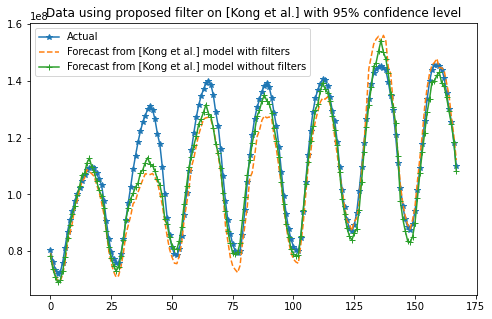

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from [Kong et al.] model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from [Kong et al.] model without filters')
plt.legend()
plt.title("Data using proposed filter on [Kong et al.] with 95% confidence level")
plt.show()

### CNNLSTM 

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
#train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

In [0]:
model = CNNLSTMModelBuilder.build(data_mon.shape[1],data_mon.shape[2])
model.summary()

Model: "mnist_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
inp (InputLayer)                [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 20, 16)       10656       inp[0][0]                        
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 18, 32)       1568        conv1d[0][0]                     
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, 16, 64)       6208        conv1d_1[0][0]                   
________________________________________________________________________________________

##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_mon.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 10:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 39 steps, validate on 19 steps
Epoch 1/50
37/39 [===========================>..] - ETA: 0s - loss: 0.0523 - mean_squared_error: 0.0048 - mean_absolute_percentage_error: 134.4915Evaluating: epoch 0 ends at 15:38:02.942800 with MAPE 
5.093417600346855
130.29026032733665
143.0807836594476
39/39 [==============================] - 5s 135ms/step - loss: 0.0525 - mean_squared_error: 0.0048 - mean_absolute_percentage_error: 144.6961 - val_loss: 0.0425 - val_mean_squared_error: 0.0030 - val_mean_absolute_percentage_error: 92.1407
Epoch 2/50
37/39 [===========================>..] - ETA: 0s - loss: 0.0466 - mean_squared_error: 0.0035 - mean_absolute_percentage_error: 138.8020Evaluating: epoch 1 ends at 15:38:06.311815 with MAPE 
5.90867427524091
154.86327143702846
163.94724501209086
39/39 [==============================] - 2s 53ms/step - loss: 0.0465 - mean_squared_error: 0.0035 - mean_absolute_percentage_error: 134.8671 - val_loss: 0.0497 - val_mean_squared_error: 0.0041 - val_mean_abso

In [0]:
6.081663783889149
5694118.129078507
6919588.244782632

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 10:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=500,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/500
271/273 [============================>.] - ETA: 0s - loss: 0.1818 - mean_squared_error: 0.0432 - mean_absolute_percentage_error: 3095.8103Evaluating: epoch 0 ends at 14:18:16.946244 with MAPE 
13.997743391280155
13362509.707116872
13745312.685264504
273/273 [==============================] - 22s 81ms/step - loss: 0.1817 - mean_squared_error: 0.0432 - mean_absolute_percentage_error: 3119.6975 - val_loss: 0.1328 - val_mean_squared_error: 0.0223 - val_mean_absolute_percentage_error: 11385.9111
Epoch 2/500
272/273 [============================>.] - ETA: 0s - loss: 0.1742 - mean_squared_error: 0.0369 - mean_absolute_percentage_error: 3035.0759Evaluating: epoch 1 ends at 14:18:38.224838 with MAPE 
23.00079011993518
21236817.811333954
21588985.336080473
273/273 [==============================] - 21s 77ms/step - loss: 0.1740 - mean_squared_error: 0.0368 - mean_absolute_percentage_error: 3026.0356 - val_loss: 0.2172 - val_mean_squared_error:

KeyboardInterrupt: ignored

In [0]:
6.084002895309037
5699394.545657854
6921107.420309196

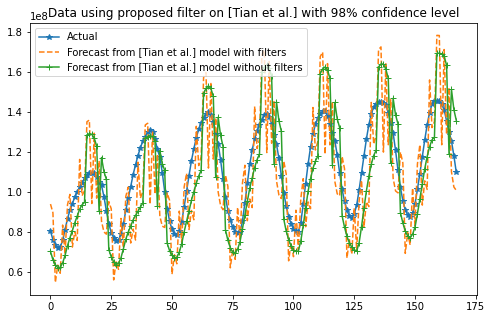

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from [Tian et al.] model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from [Tian et al.] model without filters')
plt.legend()
plt.title("Data using proposed filter on [Tian et al.] with 98% confidence level")
plt.show()

### Wavenet 

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
#train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

In [0]:
model = wavenet.build_wavenet_model(data_mon.shape[1],data_mon.shape[2],16,3,18)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
conv1d_57 (Conv1D)              (None, 24, 16)       6400        input_2[0][0]                    
__________________________________________________________________________________________________
conv1d_58 (Conv1D)              (None, 24, 16)       784         conv1d_57[0][0]                  
__________________________________________________________________________________________________
conv1d_59 (Conv1D)              (None, 24, 16)       784         conv1d_57[0][0]                  
____________________________________________________________________________________________

##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_mon.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 4:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 39 steps, validate on 19 steps
Epoch 1/50
38/39 [============================>.] - ETA: 1s - loss: 0.0546 - mean_squared_error: 0.0059 - mean_absolute_percentage_error: 141.4591Evaluating: epoch 0 ends at 09:40:26.921234 with MAPE 
5.9837886180269395
147.24784129256213
159.44684278067135
39/39 [==============================] - 50s 1s/step - loss: 0.0539 - mean_squared_error: 0.0058 - mean_absolute_percentage_error: 138.6868 - val_loss: 0.0427 - val_mean_squared_error: 0.0032 - val_mean_absolute_percentage_error: 85.4933
Epoch 2/50
38/39 [============================>.] - ETA: 0s - loss: 0.0428 - mean_squared_error: 0.0030 - mean_absolute_percentage_error: 140.3603Evaluating: epoch 1 ends at 09:41:07.492631 with MAPE 
5.217333194299093
135.38166452762331
148.8327115088487
39/39 [==============================] - 36s 932ms/step - loss: 0.0428 - mean_squared_error: 0.0030 - mean_absolute_percentage_error: 139.4620 - val_loss: 0.0403 - val_mean_squared_error: 0.0028 - val_mean_ab

KeyboardInterrupt: ignored

In [0]:
3.559792447660026
3424608.3939229795
4054294.407598905

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_mon.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      #AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)**2)
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=25,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 39 steps, validate on 19 steps
Epoch 1/25
38/39 [============================>.] - ETA: 0s - loss: 0.0877 - mean_squared_error: 0.0122 - mean_absolute_percentage_error: 136.9694Evaluating: epoch 0 ends at 10:09:31.387028 with MAPE 
7.063051950179897
205.86996750839384
210.15088227905082
39/39 [==============================] - 42s 1s/step - loss: 0.0872 - mean_squared_error: 0.0121 - mean_absolute_percentage_error: 136.4385 - val_loss: 0.0696 - val_mean_squared_error: 0.0076 - val_mean_absolute_percentage_error: 137.3094
Epoch 2/25
38/39 [============================>.] - ETA: 0s - loss: 0.0544 - mean_squared_error: 0.0046 - mean_absolute_percentage_error: 132.5481Evaluating: epoch 1 ends at 10:10:09.593546 with MAPE 
5.395756341372511
143.51440706927235
152.99735844052222
39/39 [==============================] - 36s 934ms/step - loss: 0.0542 - mean_squared_error: 0.0046 - mean_absolute_percentage_error: 136.9582 - val_loss: 0.0461 - val_mean_squared_error: 0.0034 - val_mean_a

In [0]:
3.6016885726862977
3463870.8078632844
4076884.7237214483

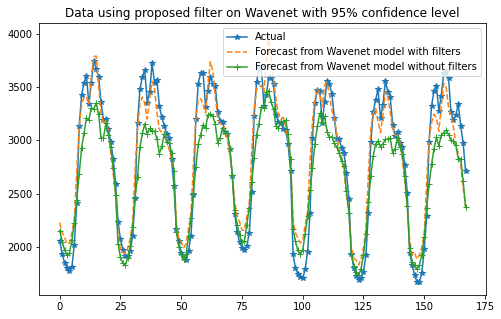

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from Wavenet model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from Wavenet model without filters')
plt.legend()
plt.title("Data using proposed filter on Wavenet with 95% confidence level")
plt.show()

### Wavenet + LSTM

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
#train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

In [0]:
model = wavenet.build_wavenet_model(data_scaled.shape[1],data_scaled.shape[2],16,3,18)
model.summary()

NameError: ignored

##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
#plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_mon.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      #plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=30,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 39 steps, validate on 19 steps
Epoch 1/30
38/39 [============================>.] - ETA: 0s - loss: 0.0400 - mean_squared_error: 0.0026 - mean_absolute_percentage_error: 136.3118Evaluating: epoch 0 ends at 10:49:42.117582 with MAPE 
5.480799210401187
140.4978787787959
152.584319849198
39/39 [==============================] - 46s 1s/step - loss: 0.0398 - mean_squared_error: 0.0026 - mean_absolute_percentage_error: 136.1113 - val_loss: 0.0389 - val_mean_squared_error: 0.0027 - val_mean_absolute_percentage_error: 118.0014
Epoch 2/30
38/39 [============================>.] - ETA: 0s - loss: 0.0401 - mean_squared_error: 0.0026 - mean_absolute_percentage_error: 136.3402Evaluating: epoch 1 ends at 10:50:22.359995 with MAPE 
5.378288464896582
138.43070316450266
150.50058558740258
39/39 [==============================] - 37s 936ms/step - loss: 0.0397 - mean_squared_error: 0.0026 - mean_absolute_percentage_error: 133.3351 - val_loss: 0.0390 - val_mean_squared_error: 0.0027 - val_mean_abso

KeyboardInterrupt: ignored

In [0]:
from tensorflow import keras
from tensorflow.keras import layers, Model
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_mon.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.0001
  else:
    return 0.000001 * np.math.exp(0.1 * (10 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
model_fine = model.output
model_fine = layers.Reshape((24,1))(model_fine)
model_fine = layers.LSTM(100,return_sequences = True, activation='relu')(model_fine)
model_fine = layers.Dense(1)(model_fine)
model_fine = layers.Flatten()(model_fine)
model_final = Model(inputs=model.input, outputs=model_fine)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])



Train on 39 steps, validate on 19 steps
Epoch 1/50
38/39 [============================>.] - ETA: 1s - loss: 0.0396 - mean_squared_error: 0.0026 - mean_absolute_percentage_error: 134.8158Evaluating: epoch 0 ends at 11:19:55.470731 with MAPE 
5.332147572778424
137.14863216717063
149.6337547658447
39/39 [==============================] - 47s 1s/step - loss: 0.0394 - mean_squared_error: 0.0026 - mean_absolute_percentage_error: 134.8774 - val_loss: 0.0386 - val_mean_squared_error: 0.0026 - val_mean_absolute_percentage_error: 124.5913
Epoch 2/50
38/39 [============================>.] - ETA: 0s - loss: 0.0398 - mean_squared_error: 0.0026 - mean_absolute_percentage_error: 137.3309Evaluating: epoch 1 ends at 11:20:36.481216 with MAPE 
5.329010987986848
137.04665654464452
149.53052799488148
39/39 [==============================] - 36s 935ms/step - loss: 0.0394 - mean_squared_error: 0.0026 - mean_absolute_percentage_error: 134.2701 - val_loss: 0.0386 - val_mean_squared_error: 0.0026 - val_mean_ab

KeyboardInterrupt: ignored

In [0]:
3.539693634817098
3406576.6528809867
4029700.5747583597

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
#plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      #plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      #AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)**2)
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=500,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/500
272/273 [============================>.] - ETA: 0s - loss: 0.0492 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 5512.8315Evaluating: epoch 0 ends at 23:57:35.776178 with MAPE 
6.622000204974834
1302.002388145604
1635.8096938668857
273/273 [==============================] - 269s 984ms/step - loss: 0.0493 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 5493.0996 - val_loss: 0.0480 - val_mean_squared_error: 0.0035 - val_mean_absolute_percentage_error: 9400.5996
Epoch 2/500
272/273 [============================>.] - ETA: 0s - loss: 0.0496 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 11589.4629Evaluating: epoch 1 ends at 00:02:00.540468 with MAPE 
6.564630119162653
1304.4957647077645
1614.739487032414
273/273 [==============================] - 249s 913ms/step - loss: 0.0495 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 11548.3525 - val_loss: 0.0466 - val_mean_squared_erro

KeyboardInterrupt: ignored

KeyboardInterrupt: ignored

In [0]:
from tensorflow import keras
from tensorflow.keras import layers, Model
#for tensorflow 2.0
import datetime
plot_val1= []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_mon.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (10 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
model_fine = model.output
model_fine = layers.Reshape((24,1))(model_fine)
model_fine = layers.LSTM(100,return_sequences = True, activation='relu')(model_fine)
model_fine = layers.Dense(1)(model_fine)
model_fine = layers.Flatten()(model_fine)
model_final = Model(inputs=model.input, outputs=model_fine)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=15,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])



Train on 39 steps, validate on 19 steps
Epoch 1/15
38/39 [============================>.] - ETA: 0s - loss: 0.0395 - mean_squared_error: 0.0026 - mean_absolute_percentage_error: 130.7370Evaluating: epoch 0 ends at 10:36:44.302480 with MAPE 
5.253230117433342
135.69940693083657
148.03444767696897
39/39 [==============================] - 44s 1s/step - loss: 0.0398 - mean_squared_error: 0.0026 - mean_absolute_percentage_error: 130.3796 - val_loss: 0.0391 - val_mean_squared_error: 0.0027 - val_mean_absolute_percentage_error: 130.8639
Epoch 2/15
38/39 [============================>.] - ETA: 0s - loss: 0.0396 - mean_squared_error: 0.0026 - mean_absolute_percentage_error: 129.6161Evaluating: epoch 1 ends at 10:37:23.450918 with MAPE 
5.24226668499535
135.684134644079
147.90275684615946
39/39 [==============================] - 36s 934ms/step - loss: 0.0397 - mean_squared_error: 0.0026 - mean_absolute_percentage_error: 134.0850 - val_loss: 0.0391 - val_mean_squared_error: 0.0026 - val_mean_abso

In [0]:
6.451660636678543
1279.6313291944734
1605.4005080892537

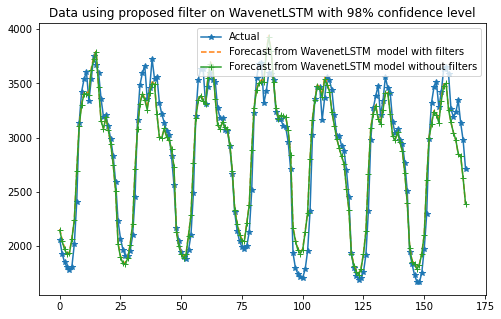

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from WavenetLSTM  model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from WavenetLSTM model without filters')
plt.legend()
plt.title("Data using proposed filter on WavenetLSTM with 98% confidence level")
plt.show()

### DAE

#### Training

##### With filter

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

bbrbm = RBMDAE.BBRBM(n_visible=24, n_hidden=64, learning_rate=0.001, momentum=0.95, use_tqdm=True)
errs = bbrbm.fit(x_train[:,:,0], n_epoches=200, batch_size=4)



Instructions for updating:
Use `tf.cast` instead.


Epoch: 0: 100%|##########| 274/274 [00:02<00:00, 116.50it/s]
Train error: 0.2751

Epoch: 1: 100%|##########| 274/274 [00:00<00:00, 369.05it/s]
Train error: 0.1958

Epoch: 2: 100%|##########| 274/274 [00:00<00:00, 349.76it/s]
Train error: 0.1408

Epoch: 3: 100%|##########| 274/274 [00:00<00:00, 374.94it/s]
Train error: 0.1032

Epoch: 4: 100%|##########| 274/274 [00:00<00:00, 365.88it/s]
Train error: 0.0773

Epoch: 5: 100%|##########| 274/274 [00:00<00:00, 364.99it/s]
Train error: 0.0593

Epoch: 6: 100%|##########| 274/274 [00:00<00:00, 369.72it/s]
Train error: 0.0467

Epoch: 7: 100%|##########| 274/274 [00:00<00:00, 361.12it/s]
Train error: 0.0375

Epoch: 8: 100%|##########| 274/274 [00:00<00:00, 369.90it/s]
Train error: 0.0308

Epoch: 9: 100%|##########| 274/274 [00:00<00:00, 363.77it/s]
Train error: 0.0258

Epoch: 10: 100%|##########| 274/274 [00:00<00:00, 358.69it/s]
Train error: 0.0219

Epoch: 11: 100%|##########| 274/274 [00:00<

In [0]:
AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val = []
for i in range(len(test_inp)):
  test_pred = bbrbm.reconstruct(test_inp[i,:,0:1].reshape(-1,24))
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

6.050606044780152
5645458.178944004
6881657.097681694


In [0]:
6.050606044780152
5645458.178944004
6881657.097681694

##### No filter

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

bbrbm = RBMDAE.BBRBM(n_visible=24, n_hidden=64, learning_rate=0.001, momentum=0.95, use_tqdm=True)
errs = bbrbm.fit(x_train[:,:,0], n_epoches=150, batch_size=4)

Epoch: 0: 100%|##########| 274/274 [00:00<00:00, 346.62it/s]
Train error: 0.2354

Epoch: 1: 100%|##########| 274/274 [00:00<00:00, 359.11it/s]
Train error: 0.1676

Epoch: 2: 100%|##########| 274/274 [00:00<00:00, 350.48it/s]
Train error: 0.1211

Epoch: 3: 100%|##########| 274/274 [00:00<00:00, 358.04it/s]
Train error: 0.0895

Epoch: 4: 100%|##########| 274/274 [00:00<00:00, 361.87it/s]
Train error: 0.0678

Epoch: 5: 100%|##########| 274/274 [00:00<00:00, 356.74it/s]
Train error: 0.0527

Epoch: 6: 100%|##########| 274/274 [00:00<00:00, 356.70it/s]
Train error: 0.0419

Epoch: 7: 100%|##########| 274/274 [00:00<00:00, 351.79it/s]
Train error: 0.0340

Epoch: 8: 100%|##########| 274/274 [00:00<00:00, 380.78it/s]
Train error: 0.0281

Epoch: 9: 100%|##########| 274/274 [00:00<00:00, 357.16it/s]
Train error: 0.0237

Epoch: 10: 100%|##########| 274/274 [00:00<00:00, 360.31it/s]
Train error: 0.0203

Epoch: 11: 100%|##########| 274/274 [00:00<00:00, 353.57it/s]
Train error: 0.0176

Epoch: 12: 100

In [0]:
AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val1 = []
for i in range(len(test_inp)):
  test_pred = bbrbm.reconstruct(test_inp[i,:,0:1].reshape(-1,24))
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

6.052395940856418
5641764.380505451
6879584.29225612


In [0]:
6.052395940856418
5641764.380505451
6879584.29225612

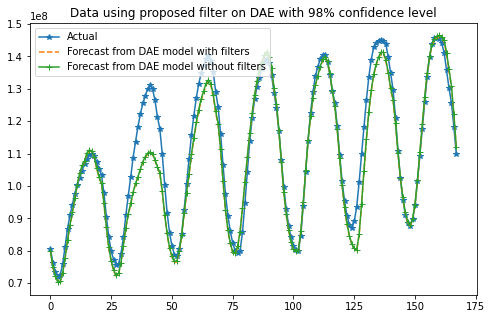

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0,:].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from DAE model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from DAE model without filters')
plt.legend()
plt.title("Data using proposed filter on DAE with 98% confidence level")
plt.show()

### WNN 

In [0]:
inp_high, inp_low_low, inp_low_high = waveletFunction.extract(inp)

In [0]:
# for pure keras
x_train_high, x_val_high, y_train, y_val = train_test_split(inp_high,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

In [0]:
# for pure keras
x_train_low_low, x_val_low_low, y_train, y_val = train_test_split(inp_low_low,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

In [0]:
# for pure keras
x_train_low_high, x_val_low_high, y_train, y_val = train_test_split(inp_low_high,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

In [0]:
# define two sets of inputs
inputA = tf.keras.Input(shape=(x_train_high.shape[1],x_train_high.shape[2]))
inputB = tf.keras.Input(shape=(x_train_low_low.shape[1],x_train_low_low.shape[2]))
inputC = tf.keras.Input(shape=(x_train_low_high.shape[1],x_train_low_high.shape[2]))

# the first branch opreates on the first input
x = tf.keras.layers.Dense(100, activation="selu")(inputA)
x = tf.keras.layers.Dense(100, activation="selu")(x)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dropout(0.3)(x)
x = tf.keras.layers.Dense(24, activation="linear")(x)
x = tf.keras.Model(inputs = inputA, outputs = x)

# the second branch opreates on the second input
y = tf.keras.layers.Dense(100, activation="selu")(inputB)
y = tf.keras.layers.Dense(100, activation="selu")(y)
y = tf.keras.layers.Flatten()(y)
y = tf.keras.layers.Dropout(0.3)(y)
y = tf.keras.layers.Dense(24, activation="linear")(y)
y = tf.keras.Model(inputs = inputB, outputs = y)

# the third branch opreates on the third input
z = tf.keras.layers.Dense(100, activation="selu")(inputC)
z = tf.keras.layers.Dense(100, activation="selu")(z)
z = tf.keras.layers.Flatten()(z)
z = tf.keras.layers.Dropout(0.3)(z)
z = tf.keras.layers.Dense(24, activation="linear")(z)
z = tf.keras.Model(inputs = inputC, outputs = z)

total = tf.keras.layers.Add()([x.output,y.output,z.output])

model = tf.keras.Model(inputs=[x.input, y.input, z.input], outputs=total)

In [0]:
model.summary()

Model: "model_35"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_25 (InputLayer)           [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
input_26 (InputLayer)           [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
input_27 (InputLayer)           [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
dense_72 (Dense)                (None, 24, 100)      13400       input_25[0][0]                   
___________________________________________________________________________________________

##### Training

###### With filter

In [0]:
#for tensorflow 2.0

def scheduler(epoch):
  if epoch < 5:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer='rmsprop', loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit([x_train_high,x_train_low_low,x_train_low_high],y_train[:,:,0], batch_size=4, epochs=50,
                      validation_data=([x_val_high,x_val_low_low,x_val_low_high],y_val[:,:,0]),callbacks=[callback])

Train on 1095 samples, validate on 540 samples
Epoch 1/50
1095/1095 [==============================] - 3s 3ms/sample - loss: 4.6169 - mean_squared_error: 63.0875 - mean_absolute_percentage_error: 112383.7578 - val_loss: 2.7066 - val_mean_squared_error: 12.0281 - val_mean_absolute_percentage_error: 198691.7344
Epoch 2/50
1095/1095 [==============================] - 2s 2ms/sample - loss: 2.8306 - mean_squared_error: 12.9198 - mean_absolute_percentage_error: 45135.6328 - val_loss: 2.3882 - val_mean_squared_error: 8.9834 - val_mean_absolute_percentage_error: 368566.3750
Epoch 3/50
1095/1095 [==============================] - 2s 2ms/sample - loss: 2.8949 - mean_squared_error: 13.7262 - mean_absolute_percentage_error: 64914.6445 - val_loss: 3.0314 - val_mean_squared_error: 14.3317 - val_mean_absolute_percentage_error: 75142.7578
Epoch 4/50
1095/1095 [==============================] - 2s 2ms/sample - loss: 2.9827 - mean_squared_error: 14.1408 - mean_absolute_percentage_error: 43547.1211 - val

In [0]:
import pywt

testinp_high, testinp_low_low, testinp_low_high = waveletFunction.extract(test_inp)

AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val = []
for i in range(len(test_inp)):
  test_pred = model.predict([testinp_high[i].reshape(-1,24,133),testinp_low_low[i].reshape(-1,24,133),testinp_low_high[i].reshape(-1,24,133)])
  
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred.reshape(-1)
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

3.5227531822414146
3418438.3851726702
4061634.606719081


In [0]:
3.5227531822414146
3418438.3851726702
4061634.606719081

###### No filter

In [0]:
#for tensorflow 2.0

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer='rmsprop', loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit([x_train_high,x_train_low_low,x_train_low_high],y_train[:,:,0], batch_size=4, epochs=25,
                      validation_data=([x_val_high,x_val_low_low,x_val_low_high],y_val[:,:,0]),callbacks=[callback])

Train on 1095 samples, validate on 540 samples
Epoch 1/25
1095/1095 [==============================] - 3s 3ms/sample - loss: 0.6615 - mean_squared_error: 0.7242 - mean_absolute_percentage_error: 10880.6328 - val_loss: 0.4649 - val_mean_squared_error: 0.3342 - val_mean_absolute_percentage_error: 8876.6162
Epoch 2/25
1095/1095 [==============================] - 2s 2ms/sample - loss: 0.4237 - mean_squared_error: 0.2854 - mean_absolute_percentage_error: 7508.0879 - val_loss: 0.3049 - val_mean_squared_error: 0.1442 - val_mean_absolute_percentage_error: 8361.1455
Epoch 3/25
1095/1095 [==============================] - 2s 2ms/sample - loss: 0.2993 - mean_squared_error: 0.1423 - mean_absolute_percentage_error: 4951.8799 - val_loss: 0.2436 - val_mean_squared_error: 0.0911 - val_mean_absolute_percentage_error: 53516.4297
Epoch 4/25
1095/1095 [==============================] - 2s 2ms/sample - loss: 0.2255 - mean_squared_error: 0.0800 - mean_absolute_percentage_error: 3384.4556 - val_loss: 0.1822 

In [0]:
import pywt

testinp_high, testinp_low_low, testinp_low_high = waveletFunction.extract(test_inp)

AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val1 = []
for i in range(len(test_inp)):
  test_pred = model.predict([testinp_high[i].reshape(-1,24,133),testinp_low_low[i].reshape(-1,24,133),testinp_low_high[i].reshape(-1,24,133)])
  
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred.reshape(-1)
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

3.6331669328361476
3525543.550924314
4106249.429547678


In [0]:
3.6331669328361476
3525543.550924314
4106249.429547678

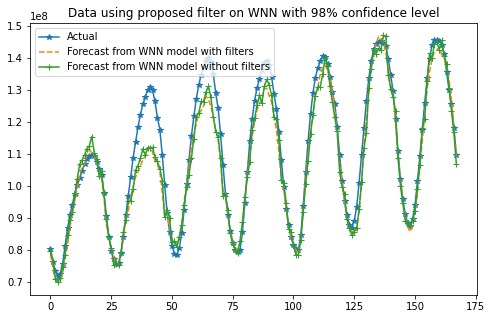

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0,:].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from WNN model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from WNN model without filters')
plt.legend()
plt.title("Data using proposed filter on WNN with 98% confidence level")
plt.show()

# Sunday dataset

## Setup environment, import libraries

In [0]:
import tensorflow as tf
import pandas as pd
import numpy as np
import os
from collections import Counter
import matplotlib
import matplotlib.pyplot as plt
import random
import shutil
import tensorflow.contrib.learn as tflearn
import tensorflow.contrib.layers as tflayers
from tensorflow.contrib.learn.python.learn import learn_runner
import tensorflow.contrib.metrics as metrics
import tensorflow.contrib.rnn as rnn
from google.colab import files
from matplotlib.pyplot import figure
from sklearn.model_selection import train_test_split

#Set a fixed random value so that every time the code is running it will yield the same results.
from numpy.random import seed
seed(1611)

#Set a fixed random value so that every time the code is running it will yield the same results.
from tensorflow import set_random_seed
set_random_seed(3116)

!git clone https://github.com/a11to1n3/StatFilterAppliedInSTLFDeeplearning.git


# Change to the repository folder
%cd StatFilterAppliedInSTLFDeeplearning

# Import all the neccessary modules in the cloned repository
import dataWrangling
import dataPCA
import dataHourSplit
import dataFilter
import confidenceLevelFitness
import LSTMModelBuilder
import CNNLSTMModelBuilder
import wavenet
import RBMDAE
import waveletFunction
import modelBuilder

Cloning into 'StatFilterAppliedInSTLFDeeplearning'...
remote: Enumerating objects: 141, done.
remote: Counting objects: 100% (141/141), done.
remote: Compressing objects: 100% (100/100), done.
remote: Total 141 (delta 83), reused 99 (delta 41), pack-reused 0
Receiving objects: 100% (141/141), 23.13 KiB | 147.00 KiB/s, done.
Resolving deltas: 100% (83/83), done.
/content/StatFilterAppliedInSTLFDeeplearning/StatFilterAppliedInSTLFDeeplearning


## Load dataset

In [0]:
# Run this and select the DayMarked.csv file in your computer
files.upload()

Saving DayMarked.csv to DayMarked.csv


{'DayMarked.csv': b'Thu,Ngay,00:00,01:00,02:00,03:00,04:00,05:00,06:00,07:00,08:00,09:00,10:00,11:00,12:00,13:00,14:00,15:00,16:00,17:00,18:00,19:00,20:00,21:00,22:00,23:00,Holiday,Week number\r\n2,11/01/10,993.6,953.9,956.2,968.6,1020.7,1158.4,1375.6,1813.2,1938.2,2011.7,2022.8,1776.5,1847.6,2046.3,2077.8,2101.4,2017.6,2052,1939.7,1892.4,1815.6,1660.7,1474,1342.6,0,44\r\n3,11/2/10,1231.7,1183.7,1170.1,1168.9,1190.9,1318.8,1482,1967.6,2150.6,2233,2239.6,2002.7,2099.3,2246.7,2249.9,2265.5,2206.2,2116.4,2019.5,1936.8,1870.3,1712.7,1510,1285.8,0,44\r\n4,11/3/10,1243.6,1221.1,1197.6,1198.2,1219.8,1321.9,1481.2,1934.6,2126.8,2187.3,2188.6,1959.9,2028.7,2218.2,2270,2270.6,2118.1,2141.3,2006.6,1975.2,1921.6,1760.1,1585.7,1427.3,0,44\r\n5,11/4/10,1303.3,1255.7,1219.4,1213.3,1249.4,1230,1481.1,1910.8,2062.8,2173.6,2170.7,1929.7,2048.5,2237.5,2243,2023.9,1952.8,1980.6,2015.7,1949.3,1901.7,1729,1534,1292.4,0,44\r\n6,11/5/10,1176.8,1178.3,1165.2,1171.7,1192.7,1313,1489.9,1947.2,2081.1,2153.8,2166.

## Pre-process dataset to 133 dimensions and scale it

The shape of the array is: (1818, 24, 133)


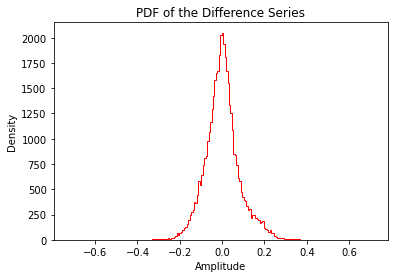

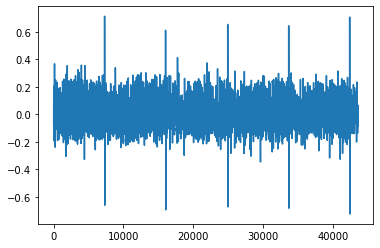

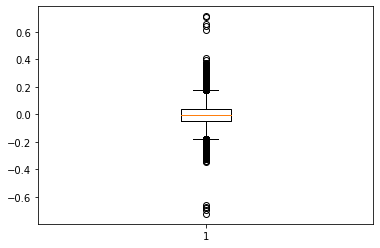

In [0]:
wrangledData = dataWrangling.csvToArray('DayMarked.csv')
#wrangledData = dataWrangling.csvToArray('DayMarked (STLF Data Inputs Template) 13112019.csv')

# Check for the shape of the array after wrangling the data
print("The shape of the array is: {}".format(np.shape(wrangledData)))

# x_scaled is the scaled data conducted by the log and differencing functions
# x_orig is the original data without being scaled
# prex_orig is the original data without being scaled of the day before analyzing day
mon_scaled, sun_scaled, rests_scaled, mon_orig, sun_orig, rests_orig, presun_orig, premon_orig = dataPCA.plotPCAandSplit(wrangledData)

## For either Monday or Sunday, split the data into 4 timespans
- Monday: 0h - 4h, 5h - 6h, 7h - 16h, 17h - 23h
- Sunday: 0h - 4h, 5h - 6h, 7h - 15h, 16h - 23h

In [0]:
mon_to4, mon_5to6, mon_7to16, mon_17to23 = dataHourSplit.splitToDifferentTimeSpan(mon_scaled, 'Mon')
sun_to4, sun_5to6, sun_7to15, sun_16to23 = dataHourSplit.splitToDifferentTimeSpan(sun_scaled, 'Sun')

## Filter data for each given confidence level

In [0]:
# Data filtered with confidence level of 90
data_90 = dataFilter.filterWithConfidenceLevel(data_scaled, 90)

# Data filtered with confidence level of 91
data_91 = dataFilter.filterWithConfidenceLevel(data_scaled, 91)

# Data filtered with confidence level of 92
data_92 = dataFilter.filterWithConfidenceLevel(data_scaled, 92)

# Data filtered with confidence level of 93
data_93 = dataFilter.filterWithConfidenceLevel(data_scaled, 93)

# Data filtered with confidence level of 94
data_94 = dataFilter.filterWithConfidenceLevel(data_scaled, 94)

# Data filtered with confidence level of 95
data_95 = dataFilter.filterWithConfidenceLevel(data_scaled, 95)

# Data filtered with confidence level of 96
data_96 = dataFilter.filterWithConfidenceLevel(data_scaled, 96)

# Data filtered with confidence level of 97
data_97 = dataFilter.filterWithConfidenceLevel(data_scaled, 97)

# Data filtered with confidence level of 98
data_98 = dataFilter.filterWithConfidenceLevel(data_scaled, 98)

# Data filtered with confidence level of 99
data_99 = dataFilter.filterWithConfidenceLevel(data_scaled, 99)

# Data filtered with confidence level of 99.73
data_3sigma = dataFilter.filterWithConfidenceLevel(data_scaled, 99.73)

# Data filtered with confidence level of 99.99366
data_4sigma = dataFilter.filterWithConfidenceLevel(data_scaled, 99.99366)

# Data filtered with confidence level of 99.99932
data_4sigma5 = dataFilter.filterWithConfidenceLevel(data_scaled, 99.99932)

NameError: ignored

In [0]:
# Monday data filtered with confidence level of 90
mon_to4_90 = dataFilter.filterWithConfidenceLevel(mon_to4, 90)
mon_5to6_90 = dataFilter.filterWithConfidenceLevel(mon_5to6, 90)
mon_7to16_90 = dataFilter.filterWithConfidenceLevel(mon_7to16, 90)
mon_17to23_90 = dataFilter.filterWithConfidenceLevel(mon_17to23, 90)

# Monday data filtered with confidence level of 91
mon_to4_91 = dataFilter.filterWithConfidenceLevel(mon_to4, 91)
mon_5to6_91 = dataFilter.filterWithConfidenceLevel(mon_5to6, 91)
mon_7to16_91 = dataFilter.filterWithConfidenceLevel(mon_7to16, 91)
mon_17to23_91 = dataFilter.filterWithConfidenceLevel(mon_17to23, 91)

# Monday data filtered with confidence level of 92
mon_to4_92 = dataFilter.filterWithConfidenceLevel(mon_to4, 92)
mon_5to6_92 = dataFilter.filterWithConfidenceLevel(mon_5to6, 92)
mon_7to16_92 = dataFilter.filterWithConfidenceLevel(mon_7to16, 92)
mon_17to23_92 = dataFilter.filterWithConfidenceLevel(mon_17to23, 92)

# Monday data filtered with confidence level of 93
mon_to4_93 = dataFilter.filterWithConfidenceLevel(mon_to4, 93)
mon_5to6_93 = dataFilter.filterWithConfidenceLevel(mon_5to6, 93)
mon_7to16_93 = dataFilter.filterWithConfidenceLevel(mon_7to16, 93)
mon_17to23_93 = dataFilter.filterWithConfidenceLevel(mon_17to23, 93)

# Monday data filtered with confidence level of 94
mon_to4_94 = dataFilter.filterWithConfidenceLevel(mon_to4, 94)
mon_5to6_94 = dataFilter.filterWithConfidenceLevel(mon_5to6, 94)
mon_7to16_94 = dataFilter.filterWithConfidenceLevel(mon_7to16, 94)
mon_17to23_94 = dataFilter.filterWithConfidenceLevel(mon_17to23, 94)

# Monday data filtered with confidence level of 95
mon_to4_95 = dataFilter.filterWithConfidenceLevel(mon_to4, 95)
mon_5to6_95 = dataFilter.filterWithConfidenceLevel(mon_5to6, 95)
mon_7to16_95 = dataFilter.filterWithConfidenceLevel(mon_7to16, 95)
mon_17to23_95 = dataFilter.filterWithConfidenceLevel(mon_17to23, 95)

# Monday data filtered with confidence level of 96
mon_to4_96 = dataFilter.filterWithConfidenceLevel(mon_to4, 96)
mon_5to6_96 = dataFilter.filterWithConfidenceLevel(mon_5to6, 96)
mon_7to16_96 = dataFilter.filterWithConfidenceLevel(mon_7to16, 96)
mon_17to23_96 = dataFilter.filterWithConfidenceLevel(mon_17to23, 96)

# Monday data filtered with confidence level of 97
mon_to4_97 = dataFilter.filterWithConfidenceLevel(mon_to4, 97)
mon_5to6_97 = dataFilter.filterWithConfidenceLevel(mon_5to6, 97)
mon_7to16_97 = dataFilter.filterWithConfidenceLevel(mon_7to16, 97)
mon_17to23_97 = dataFilter.filterWithConfidenceLevel(mon_17to23, 97)

# Monday data filtered with confidence level of 98
mon_to4_98 = dataFilter.filterWithConfidenceLevel(mon_to4, 98)
mon_5to6_98 = dataFilter.filterWithConfidenceLevel(mon_5to6, 98)
mon_7to16_98 = dataFilter.filterWithConfidenceLevel(mon_7to16, 98)
mon_17to23_98 = dataFilter.filterWithConfidenceLevel(mon_17to23, 98)

# Monday data filtered with confidence level of 99
mon_to4_99 = dataFilter.filterWithConfidenceLevel(mon_to4, 99)
mon_5to6_99 = dataFilter.filterWithConfidenceLevel(mon_5to6, 99)
mon_7to16_99 = dataFilter.filterWithConfidenceLevel(mon_7to16, 99)
mon_17to23_99 = dataFilter.filterWithConfidenceLevel(mon_17to23, 99)

# Monday data filtered with confidence level of 99.73
mon_to4_3sigma = dataFilter.filterWithConfidenceLevel(mon_to4, 99.73)
mon_5to6_3sigma = dataFilter.filterWithConfidenceLevel(mon_5to6, 99.73)
mon_7to16_3sigma = dataFilter.filterWithConfidenceLevel(mon_7to16, 99.73)
mon_17to23_3sigma = dataFilter.filterWithConfidenceLevel(mon_17to23, 99.73)

# Monday data filtered with confidence level of 99.99366
mon_to4_4sigma = dataFilter.filterWithConfidenceLevel(mon_to4, 99.99366)
mon_5to6_4sigma = dataFilter.filterWithConfidenceLevel(mon_5to6, 99.99366)
mon_7to16_4sigma = dataFilter.filterWithConfidenceLevel(mon_7to16, 99.99366)
mon_17to23_4sigma = dataFilter.filterWithConfidenceLevel(mon_17to23, 99.99366)

# Monday data filtered with confidence level of 99.99932
mon_to4_4sigma5 = dataFilter.filterWithConfidenceLevel(mon_to4, 99.99932)
mon_5to6_4sigma5 = dataFilter.filterWithConfidenceLevel(mon_5to6, 99.99932)
mon_7to16_4sigma5 = dataFilter.filterWithConfidenceLevel(mon_7to16, 99.99932)
mon_17to23_4sigma5 = dataFilter.filterWithConfidenceLevel(mon_17to23, 99.99932)

In [0]:
# Sunday data filtered with confidence level of 90
sun_to4_90 = dataFilter.filterWithConfidenceLevel(sun_to4, 90)
sun_5to6_90 = dataFilter.filterWithConfidenceLevel(sun_5to6, 90)
sun_7to15_90 = dataFilter.filterWithConfidenceLevel(sun_7to15, 90)
sun_16to23_90 = dataFilter.filterWithConfidenceLevel(sun_16to23, 90)

# Sunday data filtered with confidence level of 91
sun_to4_91 = dataFilter.filterWithConfidenceLevel(sun_to4, 91)
sun_5to6_91 = dataFilter.filterWithConfidenceLevel(sun_5to6, 91)
sun_7to15_91 = dataFilter.filterWithConfidenceLevel(sun_7to15, 91)
sun_16to23_91 = dataFilter.filterWithConfidenceLevel(sun_16to23, 91)

# Sunday data filtered with confidence level of 92
sun_to4_92 = dataFilter.filterWithConfidenceLevel(sun_to4, 92)
sun_5to6_92 = dataFilter.filterWithConfidenceLevel(sun_5to6, 92)
sun_7to15_92 = dataFilter.filterWithConfidenceLevel(sun_7to15, 92)
sun_16to23_92 = dataFilter.filterWithConfidenceLevel(sun_16to23, 92)

# Sunday data filtered with confidence level of 93
sun_to4_93 = dataFilter.filterWithConfidenceLevel(sun_to4, 93)
sun_5to6_93 = dataFilter.filterWithConfidenceLevel(sun_5to6, 93)
sun_7to15_93 = dataFilter.filterWithConfidenceLevel(sun_7to15, 93)
sun_16to23_93 = dataFilter.filterWithConfidenceLevel(sun_16to23, 93)

# Sunday data filtered with confidence level of 94
sun_to4_94 = dataFilter.filterWithConfidenceLevel(sun_to4, 94)
sun_5to6_94 = dataFilter.filterWithConfidenceLevel(sun_5to6, 94)
sun_7to15_94 = dataFilter.filterWithConfidenceLevel(sun_7to15, 94)
sun_16to23_94 = dataFilter.filterWithConfidenceLevel(sun_16to23, 94)

# Sunday data filtered with confidence level of 95
sun_to4_95 = dataFilter.filterWithConfidenceLevel(sun_to4, 95)
sun_5to6_95 = dataFilter.filterWithConfidenceLevel(sun_5to6, 95)
sun_7to15_95 = dataFilter.filterWithConfidenceLevel(sun_7to15, 95)
sun_16to23_95 = dataFilter.filterWithConfidenceLevel(sun_16to23, 95)

# Sunday data filtered with confidence level of 96
sun_to4_96 = dataFilter.filterWithConfidenceLevel(sun_to4, 96)
sun_5to6_96 = dataFilter.filterWithConfidenceLevel(sun_5to6, 96)
sun_7to15_96 = dataFilter.filterWithConfidenceLevel(sun_7to15, 96)
sun_16to23_96 = dataFilter.filterWithConfidenceLevel(sun_16to23, 96)

# Sunday data filtered with confidence level of 97
sun_to4_97 = dataFilter.filterWithConfidenceLevel(sun_to4, 97)
sun_5to6_97 = dataFilter.filterWithConfidenceLevel(sun_5to6, 97)
sun_7to15_97 = dataFilter.filterWithConfidenceLevel(sun_7to15, 97)
sun_16to23_97 = dataFilter.filterWithConfidenceLevel(sun_16to23, 97)

# Sunday data filtered with confidence level of 98
sun_to4_98 = dataFilter.filterWithConfidenceLevel(sun_to4, 98)
sun_5to6_98 = dataFilter.filterWithConfidenceLevel(sun_5to6, 98)
sun_7to15_98 = dataFilter.filterWithConfidenceLevel(sun_7to15, 98)
sun_16to23_98 = dataFilter.filterWithConfidenceLevel(sun_16to23, 98)

# Sunday data filtered with confidence level of 99
sun_to4_99 = dataFilter.filterWithConfidenceLevel(sun_to4, 99)
sun_5to6_99 = dataFilter.filterWithConfidenceLevel(sun_5to6, 99)
sun_7to15_99 = dataFilter.filterWithConfidenceLevel(sun_7to15, 99)
sun_16to23_99 = dataFilter.filterWithConfidenceLevel(sun_16to23, 99)

# Sunday data filtered with confidence level of 99.73
sun_to4_3sigma = dataFilter.filterWithConfidenceLevel(sun_to4, 99.73)
sun_5to6_3sigma = dataFilter.filterWithConfidenceLevel(sun_5to6, 99.73)
sun_7to15_3sigma = dataFilter.filterWithConfidenceLevel(sun_7to15, 99.73)
sun_16to23_3sigma = dataFilter.filterWithConfidenceLevel(sun_16to23, 99.73)

# Sunday data filtered with confidence level of 99.99366
sun_to4_4sigma = dataFilter.filterWithConfidenceLevel(sun_to4, 99.99366)
sun_5to6_4sigma = dataFilter.filterWithConfidenceLevel(sun_5to6, 99.99366)
sun_7to15_4sigma = dataFilter.filterWithConfidenceLevel(sun_7to15, 99.99366)
sun_16to23_4sigma = dataFilter.filterWithConfidenceLevel(sun_16to23, 99.99366)

# Sunday data filtered with confidence level of 99.99932
sun_to4_4sigma5 = dataFilter.filterWithConfidenceLevel(sun_to4, 99.99932)
sun_5to6_4sigma5 = dataFilter.filterWithConfidenceLevel(sun_5to6, 99.99932)
sun_7to15_4sigma5 = dataFilter.filterWithConfidenceLevel(sun_7to15, 99.99932)
sun_16to23_4sigma5 = dataFilter.filterWithConfidenceLevel(sun_16to23, 99.99932)

In [0]:
# Remaining days data filtered with confidence level of 90
rests_scaled_90 = dataFilter.filterWithConfidenceLevel(rests_scaled, 90)
# Remaining days data filtered with confidence level of 91
rests_scaled_91 = dataFilter.filterWithConfidenceLevel(rests_scaled, 91)
# Remaining days data filtered with confidence level of 92
rests_scaled_92 = dataFilter.filterWithConfidenceLevel(rests_scaled, 92)
# Remaining days data filtered with confidence level of 93
rests_scaled_93 = dataFilter.filterWithConfidenceLevel(rests_scaled, 93)
# Remaining days data filtered with confidence level of 94
rests_scaled_94 = dataFilter.filterWithConfidenceLevel(rests_scaled, 94)
# Remaining days data filtered with confidence level of 95
rests_scaled_95 = dataFilter.filterWithConfidenceLevel(rests_scaled, 95)
# Remaining days data filtered with confidence level of 96
rests_scaled_96 = dataFilter.filterWithConfidenceLevel(rests_scaled, 96)
# Remaining days data filtered with confidence level of 97
rests_scaled_97 = dataFilter.filterWithConfidenceLevel(rests_scaled, 97)
# Remaining days data filtered with confidence level of 98
rests_scaled_98 = dataFilter.filterWithConfidenceLevel(rests_scaled, 98)
# Remaining days data filtered with confidence level of 99
rests_scaled_99 = dataFilter.filterWithConfidenceLevel(rests_scaled, 99)
# Remaining days data filtered with confidence level of 3sigma
rests_scaled_3sigma = dataFilter.filterWithConfidenceLevel(rests_scaled, 99.73)
# Remaining days data filtered with confidence level of 4sigma
rests_scaled_4sigma = dataFilter.filterWithConfidenceLevel(rests_scaled, 99.99366)
# Remaining days data filtered with confidence level of 4sigma5
rests_scaled_4sigma5 = dataFilter.filterWithConfidenceLevel(rests_scaled, 99.99932)

## Calculate the MAPE for each of the data intervals and find the confidence level that has the smallest MAPE in each data intervals

### Create an empty MAPE object containing all the intervals with their confidence levels

In [0]:
MAPE = {
    "data" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    }
}

In [0]:
MAPE = {
    "mon_to4" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "mon_5to6" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "mon_7to16" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "mon_17to23" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "sun_to4" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "sun_5to6" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "sun_7to15" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "sun_16to23" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "rests": {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    } 
}

In [0]:
MAPE['data']['90'] = confidenceLevelFitness.calculateMAPE(data_90,data_scaled,50,8)
MAPE['data']['91'] = confidenceLevelFitness.calculateMAPE(data_91,data_scaled,50,8)
MAPE['data']['92'] = confidenceLevelFitness.calculateMAPE(data_92,data_scaled,50,8)
MAPE['data']['93'] = confidenceLevelFitness.calculateMAPE(data_93,data_scaled,50,8)
MAPE['data']['94'] = confidenceLevelFitness.calculateMAPE(data_94,data_scaled,50,8)
MAPE['data']['95'] = confidenceLevelFitness.calculateMAPE(data_95,data_scaled,50,8)
MAPE['data']['96'] = confidenceLevelFitness.calculateMAPE(data_96,data_scaled,50,8)
MAPE['data']['97'] = confidenceLevelFitness.calculateMAPE(data_97,data_scaled,50,8)
MAPE['data']['98'] = confidenceLevelFitness.calculateMAPE(data_98,data_scaled,50,8)
MAPE['data']['99'] = confidenceLevelFitness.calculateMAPE(data_99,data_scaled,50,8)
MAPE['data']['3sigma'] = confidenceLevelFitness.calculateMAPE(data_3sigma,data_scaled,50,8)
MAPE['data']['4sigma'] = confidenceLevelFitness.calculateMAPE(data_4sigma,data_scaled,50,8)
MAPE['data']['4sigma5'] = confidenceLevelFitness.calculateMAPE(data_4sigma5,data_scaled,50,8)

In [0]:
MAPE['mon_to4']['90'] = confidenceLevelFitness.calculateMAPE(mon_to4_90,mon_to4,100,2)
MAPE['mon_to4']['91'] = confidenceLevelFitness.calculateMAPE(mon_to4_91,mon_to4,100,2)
MAPE['mon_to4']['92'] = confidenceLevelFitness.calculateMAPE(mon_to4_92,mon_to4,100,2)
MAPE['mon_to4']['93'] = confidenceLevelFitness.calculateMAPE(mon_to4_93,mon_to4,100,2)
MAPE['mon_to4']['94'] = confidenceLevelFitness.calculateMAPE(mon_to4_94,mon_to4,100,2)
MAPE['mon_to4']['95'] = confidenceLevelFitness.calculateMAPE(mon_to4_95,mon_to4,100,2)
MAPE['mon_to4']['96'] = confidenceLevelFitness.calculateMAPE(mon_to4_96,mon_to4,100,2)
MAPE['mon_to4']['97'] = confidenceLevelFitness.calculateMAPE(mon_to4_97,mon_to4,100,2)
MAPE['mon_to4']['98'] = confidenceLevelFitness.calculateMAPE(mon_to4_98,mon_to4,100,2)
MAPE['mon_to4']['99'] = confidenceLevelFitness.calculateMAPE(mon_to4_99,mon_to4,100,2)
MAPE['mon_to4']['3sigma'] = confidenceLevelFitness.calculateMAPE(mon_to4_3sigma,mon_to4,100,2)
MAPE['mon_to4']['4sigma'] = confidenceLevelFitness.calculateMAPE(mon_to4_4sigma,mon_to4,100,2)
MAPE['mon_to4']['4sigma5'] = confidenceLevelFitness.calculateMAPE(mon_to4_4sigma5,mon_to4,100,2)

In [0]:
MAPE['mon_5to6']['90'] = confidenceLevelFitness.calculateMAPE(mon_5to6_90,mon_5to6,100,2)
MAPE['mon_5to6']['91'] = confidenceLevelFitness.calculateMAPE(mon_5to6_91,mon_5to6,100,2)
MAPE['mon_5to6']['92'] = confidenceLevelFitness.calculateMAPE(mon_5to6_92,mon_5to6,100,2)
MAPE['mon_5to6']['93'] = confidenceLevelFitness.calculateMAPE(mon_5to6_93,mon_5to6,100,2)
MAPE['mon_5to6']['94'] = confidenceLevelFitness.calculateMAPE(mon_5to6_94,mon_5to6,100,2)
MAPE['mon_5to6']['95'] = confidenceLevelFitness.calculateMAPE(mon_5to6_95,mon_5to6,100,2)
MAPE['mon_5to6']['96'] = confidenceLevelFitness.calculateMAPE(mon_5to6_96,mon_5to6,100,2)
MAPE['mon_5to6']['97'] = confidenceLevelFitness.calculateMAPE(mon_5to6_97,mon_5to6,100,2)
MAPE['mon_5to6']['98'] = confidenceLevelFitness.calculateMAPE(mon_5to6_98,mon_5to6,100,2)
MAPE['mon_5to6']['99'] = confidenceLevelFitness.calculateMAPE(mon_5to6_99,mon_5to6,100,2)
MAPE['mon_5to6']['3sigma'] = confidenceLevelFitness.calculateMAPE(mon_5to6_3sigma,mon_5to6,100,2)
MAPE['mon_5to6']['4sigma'] = confidenceLevelFitness.calculateMAPE(mon_5to6_4sigma,mon_5to6,100,2)
MAPE['mon_5to6']['4sigma5'] = confidenceLevelFitness.calculateMAPE(mon_5to6_4sigma5,mon_5to6,100,2)

In [0]:
MAPE['mon_7to16']['90'] = confidenceLevelFitness.calculateMAPE(mon_7to16_90,mon_7to16,100,2)
MAPE['mon_7to16']['91'] = confidenceLevelFitness.calculateMAPE(mon_7to16_91,mon_7to16,100,2)
MAPE['mon_7to16']['92'] = confidenceLevelFitness.calculateMAPE(mon_7to16_92,mon_7to16,100,2)
MAPE['mon_7to16']['93'] = confidenceLevelFitness.calculateMAPE(mon_7to16_93,mon_7to16,100,2)
MAPE['mon_7to16']['94'] = confidenceLevelFitness.calculateMAPE(mon_7to16_94,mon_7to16,100,2)
MAPE['mon_7to16']['95'] = confidenceLevelFitness.calculateMAPE(mon_7to16_95,mon_7to16,100,2)
MAPE['mon_7to16']['96'] = confidenceLevelFitness.calculateMAPE(mon_7to16_96,mon_7to16,100,2)
MAPE['mon_7to16']['97'] = confidenceLevelFitness.calculateMAPE(mon_7to16_97,mon_7to16,100,2)
MAPE['mon_7to16']['98'] = confidenceLevelFitness.calculateMAPE(mon_7to16_98,mon_7to16,100,2)
MAPE['mon_7to16']['99'] = confidenceLevelFitness.calculateMAPE(mon_7to16_99,mon_7to16,100,2)
MAPE['mon_7to16']['3sigma'] = confidenceLevelFitness.calculateMAPE(mon_7to16_3sigma,mon_7to16,100,2)
MAPE['mon_7to16']['4sigma'] = confidenceLevelFitness.calculateMAPE(mon_7to16_4sigma,mon_7to16,100,2)
MAPE['mon_7to16']['4sigma5'] = confidenceLevelFitness.calculateMAPE(mon_7to16_4sigma5,mon_7to16,100,2)

In [0]:
MAPE['mon_17to23']['90'] = confidenceLevelFitness.calculateMAPE(mon_17to23_90,mon_17to23,100,2)
MAPE['mon_17to23']['91'] = confidenceLevelFitness.calculateMAPE(mon_17to23_91,mon_17to23,100,2)
MAPE['mon_17to23']['92'] = confidenceLevelFitness.calculateMAPE(mon_17to23_92,mon_17to23,100,2)
MAPE['mon_17to23']['93'] = confidenceLevelFitness.calculateMAPE(mon_17to23_93,mon_17to23,100,2)
MAPE['mon_17to23']['94'] = confidenceLevelFitness.calculateMAPE(mon_17to23_94,mon_17to23,100,2)
MAPE['mon_17to23']['95'] = confidenceLevelFitness.calculateMAPE(mon_17to23_95,mon_17to23,100,2)
MAPE['mon_17to23']['96'] = confidenceLevelFitness.calculateMAPE(mon_17to23_96,mon_17to23,100,2)
MAPE['mon_17to23']['97'] = confidenceLevelFitness.calculateMAPE(mon_17to23_97,mon_17to23,100,2)
MAPE['mon_17to23']['98'] = confidenceLevelFitness.calculateMAPE(mon_17to23_98,mon_17to23,100,2)
MAPE['mon_17to23']['99'] = confidenceLevelFitness.calculateMAPE(mon_17to23_99,mon_17to23,100,2)
MAPE['mon_17to23']['3sigma'] = confidenceLevelFitness.calculateMAPE(mon_17to23_3sigma,mon_17to23,100,2)
MAPE['mon_17to23']['4sigma'] = confidenceLevelFitness.calculateMAPE(mon_17to23_4sigma,mon_17to23,100,2)
MAPE['mon_17to23']['4sigma5'] = confidenceLevelFitness.calculateMAPE(mon_17to23_4sigma5,mon_17to23,100,2)

In [0]:
MAPE['sun_to4']['90'] = confidenceLevelFitness.calculateMAPE(sun_to4_90,sun_to4,100,2)
MAPE['sun_to4']['91'] = confidenceLevelFitness.calculateMAPE(sun_to4_91,sun_to4,100,2)
MAPE['sun_to4']['92'] = confidenceLevelFitness.calculateMAPE(sun_to4_92,sun_to4,100,2)
MAPE['sun_to4']['93'] = confidenceLevelFitness.calculateMAPE(sun_to4_93,sun_to4,100,2)
MAPE['sun_to4']['94'] = confidenceLevelFitness.calculateMAPE(sun_to4_94,sun_to4,100,2)
MAPE['sun_to4']['95'] = confidenceLevelFitness.calculateMAPE(sun_to4_95,sun_to4,100,2)
MAPE['sun_to4']['96'] = confidenceLevelFitness.calculateMAPE(sun_to4_96,sun_to4,100,2)
MAPE['sun_to4']['97'] = confidenceLevelFitness.calculateMAPE(sun_to4_97,sun_to4,100,2)
MAPE['sun_to4']['98'] = confidenceLevelFitness.calculateMAPE(sun_to4_98,sun_to4,100,2)
MAPE['sun_to4']['99'] = confidenceLevelFitness.calculateMAPE(sun_to4_99,sun_to4,100,2)
MAPE['sun_to4']['3sigma'] = confidenceLevelFitness.calculateMAPE(sun_to4_3sigma,sun_to4,100,2)
MAPE['sun_to4']['4sigma'] = confidenceLevelFitness.calculateMAPE(sun_to4_4sigma,sun_to4,100,2)
MAPE['sun_to4']['4sigma5'] = confidenceLevelFitness.calculateMAPE(sun_to4_4sigma5,sun_to4,100,2)

In [0]:
MAPE['sun_5to6']['90'] = confidenceLevelFitness.calculateMAPE(sun_5to6_90,sun_5to6,100,2)
MAPE['sun_5to6']['91'] = confidenceLevelFitness.calculateMAPE(sun_5to6_91,sun_5to6,100,2)
MAPE['sun_5to6']['92'] = confidenceLevelFitness.calculateMAPE(sun_5to6_92,sun_5to6,100,2)
MAPE['sun_5to6']['93'] = confidenceLevelFitness.calculateMAPE(sun_5to6_93,sun_5to6,100,2)
MAPE['sun_5to6']['94'] = confidenceLevelFitness.calculateMAPE(sun_5to6_94,sun_5to6,100,2)
MAPE['sun_5to6']['95'] = confidenceLevelFitness.calculateMAPE(sun_5to6_95,sun_5to6,100,2)
MAPE['sun_5to6']['96'] = confidenceLevelFitness.calculateMAPE(sun_5to6_96,sun_5to6,100,2)
MAPE['sun_5to6']['97'] = confidenceLevelFitness.calculateMAPE(sun_5to6_97,sun_5to6,100,2)
MAPE['sun_5to6']['98'] = confidenceLevelFitness.calculateMAPE(sun_5to6_98,sun_5to6,100,2)
MAPE['sun_5to6']['99'] = confidenceLevelFitness.calculateMAPE(sun_5to6_99,sun_5to6,100,2)
MAPE['sun_5to6']['3sigma'] = confidenceLevelFitness.calculateMAPE(sun_5to6_3sigma,sun_5to6,100,2)
MAPE['sun_5to6']['4sigma'] = confidenceLevelFitness.calculateMAPE(sun_5to6_4sigma,sun_5to6,100,2)
MAPE['sun_5to6']['4sigma5'] = confidenceLevelFitness.calculateMAPE(sun_5to6_4sigma5,sun_5to6,100,2)

In [0]:
MAPE['sun_7to15']['90'] = confidenceLevelFitness.calculateMAPE(sun_7to15_90,sun_7to15,100,2)
MAPE['sun_7to15']['91'] = confidenceLevelFitness.calculateMAPE(sun_7to15_91,sun_7to15,100,2)
MAPE['sun_7to15']['92'] = confidenceLevelFitness.calculateMAPE(sun_7to15_92,sun_7to15,100,2)
MAPE['sun_7to15']['93'] = confidenceLevelFitness.calculateMAPE(sun_7to15_93,sun_7to15,100,2)
MAPE['sun_7to15']['94'] = confidenceLevelFitness.calculateMAPE(sun_7to15_94,sun_7to15,100,2)
MAPE['sun_7to15']['95'] = confidenceLevelFitness.calculateMAPE(sun_7to15_95,sun_7to15,100,2)
MAPE['sun_7to15']['96'] = confidenceLevelFitness.calculateMAPE(sun_7to15_96,sun_7to15,100,2)
MAPE['sun_7to15']['97'] = confidenceLevelFitness.calculateMAPE(sun_7to15_97,sun_7to15,100,2)
MAPE['sun_7to15']['98'] = confidenceLevelFitness.calculateMAPE(sun_7to15_98,sun_7to15,100,2)
MAPE['sun_7to15']['99'] = confidenceLevelFitness.calculateMAPE(sun_7to15_99,sun_7to15,100,2)
MAPE['sun_7to15']['3sigma'] = confidenceLevelFitness.calculateMAPE(sun_7to15_3sigma,sun_7to15,100,2)
MAPE['sun_7to15']['4sigma'] = confidenceLevelFitness.calculateMAPE(sun_7to15_4sigma,sun_7to15,100,2)
MAPE['sun_7to15']['4sigma5'] = confidenceLevelFitness.calculateMAPE(sun_7to15_4sigma5,sun_7to15,100,2)

In [0]:
MAPE['sun_16to23']['90'] = confidenceLevelFitness.calculateMAPE(sun_16to23_90,sun_16to23,100,2)
MAPE['sun_16to23']['91'] = confidenceLevelFitness.calculateMAPE(sun_16to23_91,sun_16to23,100,2)
MAPE['sun_16to23']['92'] = confidenceLevelFitness.calculateMAPE(sun_16to23_92,sun_16to23,100,2)
MAPE['sun_16to23']['93'] = confidenceLevelFitness.calculateMAPE(sun_16to23_93,sun_16to23,100,2)
MAPE['sun_16to23']['94'] = confidenceLevelFitness.calculateMAPE(sun_16to23_94,sun_16to23,100,2)
MAPE['sun_16to23']['95'] = confidenceLevelFitness.calculateMAPE(sun_16to23_95,sun_16to23,100,2)
MAPE['sun_16to23']['96'] = confidenceLevelFitness.calculateMAPE(sun_16to23_96,sun_16to23,100,2)
MAPE['sun_16to23']['97'] = confidenceLevelFitness.calculateMAPE(sun_16to23_97,sun_16to23,100,2)
MAPE['sun_16to23']['98'] = confidenceLevelFitness.calculateMAPE(sun_16to23_98,sun_16to23,100,2)
MAPE['sun_16to23']['99'] = confidenceLevelFitness.calculateMAPE(sun_16to23_99,sun_16to23,100,2)
MAPE['sun_16to23']['3sigma'] = confidenceLevelFitness.calculateMAPE(sun_16to23_3sigma,sun_16to23,100,2)
MAPE['sun_16to23']['4sigma'] = confidenceLevelFitness.calculateMAPE(sun_16to23_4sigma,sun_16to23,100,2)
MAPE['sun_16to23']['4sigma5'] = confidenceLevelFitness.calculateMAPE(sun_16to23_4sigma5,sun_16to23,100,2)

In [0]:
MAPE['rests']['90'] = confidenceLevelFitness.calculateMAPE(rests_scaled_90,rests_scaled,100,4)
MAPE['rests']['91'] = confidenceLevelFitness.calculateMAPE(rests_scaled_91,rests_scaled,100,4)
MAPE['rests']['92'] = confidenceLevelFitness.calculateMAPE(rests_scaled_92,rests_scaled,100,4)
MAPE['rests']['93'] = confidenceLevelFitness.calculateMAPE(rests_scaled_93,rests_scaled,100,4)
MAPE['rests']['94'] = confidenceLevelFitness.calculateMAPE(rests_scaled_94,rests_scaled,100,4)
MAPE['rests']['95'] = confidenceLevelFitness.calculateMAPE(rests_scaled_95,rests_scaled,100,4)
MAPE['rests']['96'] = confidenceLevelFitness.calculateMAPE(rests_scaled_96,rests_scaled,100,4)
MAPE['rests']['97'] = confidenceLevelFitness.calculateMAPE(rests_scaled_97,rests_scaled,100,4)
MAPE['rests']['98'] = confidenceLevelFitness.calculateMAPE(rests_scaled_98,rests_scaled,100,4)
MAPE['rests']['99'] = confidenceLevelFitness.calculateMAPE(rests_scaled_99,rests_scaled,100,4)
MAPE['rests']['3sigma'] = confidenceLevelFitness.calculateMAPE(rests_scaled_3sigma,rests_scaled,100,4)
MAPE['rests']['4sigma'] = confidenceLevelFitness.calculateMAPE(rests_scaled_4sigma,rests_scaled,100,4)
MAPE['rests']['4sigma5'] = confidenceLevelFitness.calculateMAPE(rests_scaled_4sigma5,rests_scaled,100,4)

### Find the confidence level that has the smallest MAPE in each data intervals

#### Method: Find the minimum MAPE in each data intervals at every confidence level  and return the overall average

In [0]:
def findSmallestMAPE(dataInterval):
    if list(MAPE[dataInterval].values()).index(min(list(MAPE[dataInterval].values()))) + 90 < 100:
        #print(list(MAPE[dataInterval].values()).index(min(list(MAPE[dataInterval].values()))) + 90)
        return list(MAPE[dataInterval].values()).index(min(list(MAPE[dataInterval].values()))) + 90
    elif list(MAPE[dataInterval].values()).index(min(list(MAPE[dataInterval].values()))) + 90 == 100:
        #print('3sigma')
        return '3sigma'
    elif list(MAPE[dataInterval].values()).index(min(list(MAPE[dataInterval].values()))) + 90 == 101:
        #print('4sigma')
        return '4sigma'
    elif list(MAPE[dataInterval].values()).index(min(list(MAPE[dataInterval].values()))) + 90 == 102:
        #print('4sigma5')
        return '4sigma5'

In [0]:
minimum = []
minimum.append(findSmallestMAPE('data'))

In [0]:
for i in minimum:
  if i == '3sigma':
    minimum[minimum.index(i)] = 99.73
  elif i == '4sigma':
    minimum[minimum.index(i)] = 99.99366
  elif i == '4sigma5':
    minimum[minimum.index(i)] = 99.99932
  else:
    minimum[minimum.index(i)] = int(i)
print("The overall average best confidence level is {}".format(np.floor(np.mean(minimum))))

In [0]:
print(MAPE['data'])

In [0]:
minimum = []
minimum.append(findSmallestMAPE('mon_to4'))
minimum.append(findSmallestMAPE('mon_5to6'))
minimum.append(findSmallestMAPE('mon_7to16'))
minimum.append(findSmallestMAPE('mon_17to23'))
minimum.append(findSmallestMAPE('sun_to4'))
minimum.append(findSmallestMAPE('sun_5to6'))
minimum.append(findSmallestMAPE('sun_7to15'))
minimum.append(findSmallestMAPE('sun_16to23'))
minimum.append(findSmallestMAPE('rests'))

#print(minimum)
for i in minimum:
  if i == '3sigma':
    minimum[minimum.index(i)] = 99.73
  elif i == '4sigma':
    minimum[minimum.index(i)] = 99.99366
  elif i == '4sigma5':
    minimum[minimum.index(i)] = 99.99932
  else:
    minimum[minimum.index(i)] = int(i)
print("The overall average best confidence level is {}".format(np.floor(np.mean(minimum))))

## Data preparation for the main forecasting algorithm

### With filter

In [0]:
inp = data_sun[:-int(0.1*len(data_sun))-1]
out = data_sun[1:-int(0.1*len(data_sun))]
test_inp = data_sun_test[-int(0.1*len(data_sun)):-1]
test_out = data_sun_test[-int(0.1*len(data_sun))+1:]
pretest_inp = presun_orig[-int(0.1*len(data_sun))+1:]
pretest_out = sun_orig[-int(0.1*len(data_sun))+1:]

### No filter

In [0]:
inp = data_sun_test[:-int(0.1*len(data_sun))-1]
out = data_sun_test[1:-int(0.1*len(data_sun))]
test_inp = data_sun_test[-int(0.1*len(data_sun)):-1]
test_out = data_sun_test[-int(0.1*len(data_sun))+1:]
pretest_inp = presun_orig[-int(0.1*len(data_sun))+1:]
pretest_out = sun_orig[-int(0.1*len(data_sun))+1:]

## Model preparation

### LSTM 

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
#train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

In [0]:
model = LSTMModelBuilder.build(data_sun.shape[1],data_sun.shape[2])
model.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 24, 20)            12320     
_________________________________________________________________
lstm_1 (LSTM)                (None, 20)                3280      
_________________________________________________________________
dropout (Dropout)            (None, 20)                0         
_________________________________________________________________
dense (Dense)                (None, 24)                504       
Total params: 16,104
Trainable params: 16,104
Non-trainable params: 0
_________________________________________________________________


##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_sun.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 2:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 39 steps, validate on 19 steps
Epoch 1/50
38/39 [============================>.] - ETA: 0s - loss: 0.0724 - mean_squared_error: 0.0113 - mean_absolute_percentage_error: 177.1652Evaluating: epoch 0 ends at 12:58:47.204024 with MAPE 
5.025139672035254
116.92522137541575
127.10324148809237
39/39 [==============================] - 10s 248ms/step - loss: 0.0719 - mean_squared_error: 0.0111 - mean_absolute_percentage_error: 173.6247 - val_loss: 0.0452 - val_mean_squared_error: 0.0033 - val_mean_absolute_percentage_error: 85.7241
Epoch 2/50
38/39 [============================>.] - ETA: 0s - loss: 0.0377 - mean_squared_error: 0.0024 - mean_absolute_percentage_error: 119.3620Evaluating: epoch 1 ends at 12:58:53.664495 with MAPE 
4.958971328369253
114.66183628078606
124.2679742106874
39/39 [==============================] - 6s 152ms/step - loss: 0.0377 - mean_squared_error: 0.0023 - mean_absolute_percentage_error: 117.2062 - val_loss: 0.0457 - val_mean_squared_error: 0.0035 - val_mean_a

KeyboardInterrupt: ignored

In [0]:
3.4229892505664465
3324147.6764914957
3980056.6665089168

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_mon.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      #AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)**2)
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 3:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 78 steps, validate on 38 steps
Epoch 1/50
77/78 [============================>.] - ETA: 0s - loss: 0.0698 - mean_squared_error: 0.0113 - mean_absolute_percentage_error: 175.7857Evaluating: epoch 0 ends at 15:17:44.799609 with MAPE 
5.74916840915958
149.92517306483515
158.77856238092198
78/78 [==============================] - 11s 147ms/step - loss: 0.0694 - mean_squared_error: 0.0112 - mean_absolute_percentage_error: 173.8865 - val_loss: 0.0516 - val_mean_squared_error: 0.0041 - val_mean_absolute_percentage_error: 132.2009
Epoch 2/50
77/78 [============================>.] - ETA: 0s - loss: 0.0387 - mean_squared_error: 0.0025 - mean_absolute_percentage_error: 117.0264Evaluating: epoch 1 ends at 15:17:54.419385 with MAPE 
5.344839822268358
139.84447960700933
150.78647765568033
78/78 [==============================] - 8s 103ms/step - loss: 0.0386 - mean_squared_error: 0.0025 - mean_absolute_percentage_error: 115.8967 - val_loss: 0.0481 - val_mean_squared_error: 0.0037 - val_mean_

KeyboardInterrupt: ignored

In [0]:
3.5002222774202902
3402689.1239137226
4115141.708245982

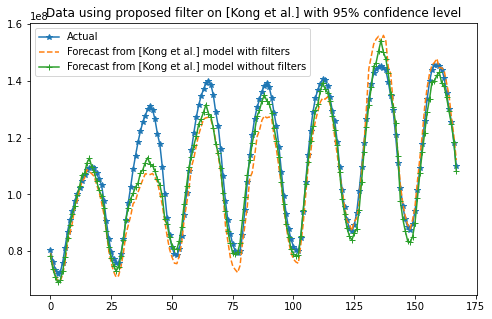

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from [Kong et al.] model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from [Kong et al.] model without filters')
plt.legend()
plt.title("Data using proposed filter on [Kong et al.] with 95% confidence level")
plt.show()

### CNNLSTM 

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
#train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

In [0]:
model = CNNLSTMModelBuilder.build(data_mon.shape[1],data_mon.shape[2])
model.summary()

Model: "mnist_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
inp (InputLayer)                [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 20, 16)       10656       inp[0][0]                        
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 18, 32)       1568        conv1d[0][0]                     
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, 16, 64)       6208        conv1d_1[0][0]                   
________________________________________________________________________________________

##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_mon.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 10:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 39 steps, validate on 19 steps
Epoch 1/50
37/39 [===========================>..] - ETA: 0s - loss: 0.0523 - mean_squared_error: 0.0048 - mean_absolute_percentage_error: 134.4915Evaluating: epoch 0 ends at 15:38:02.942800 with MAPE 
5.093417600346855
130.29026032733665
143.0807836594476
39/39 [==============================] - 5s 135ms/step - loss: 0.0525 - mean_squared_error: 0.0048 - mean_absolute_percentage_error: 144.6961 - val_loss: 0.0425 - val_mean_squared_error: 0.0030 - val_mean_absolute_percentage_error: 92.1407
Epoch 2/50
37/39 [===========================>..] - ETA: 0s - loss: 0.0466 - mean_squared_error: 0.0035 - mean_absolute_percentage_error: 138.8020Evaluating: epoch 1 ends at 15:38:06.311815 with MAPE 
5.90867427524091
154.86327143702846
163.94724501209086
39/39 [==============================] - 2s 53ms/step - loss: 0.0465 - mean_squared_error: 0.0035 - mean_absolute_percentage_error: 134.8671 - val_loss: 0.0497 - val_mean_squared_error: 0.0041 - val_mean_abso

In [0]:
6.081663783889149
5694118.129078507
6919588.244782632

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 10:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=500,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/500
271/273 [============================>.] - ETA: 0s - loss: 0.1818 - mean_squared_error: 0.0432 - mean_absolute_percentage_error: 3095.8103Evaluating: epoch 0 ends at 14:18:16.946244 with MAPE 
13.997743391280155
13362509.707116872
13745312.685264504
273/273 [==============================] - 22s 81ms/step - loss: 0.1817 - mean_squared_error: 0.0432 - mean_absolute_percentage_error: 3119.6975 - val_loss: 0.1328 - val_mean_squared_error: 0.0223 - val_mean_absolute_percentage_error: 11385.9111
Epoch 2/500
272/273 [============================>.] - ETA: 0s - loss: 0.1742 - mean_squared_error: 0.0369 - mean_absolute_percentage_error: 3035.0759Evaluating: epoch 1 ends at 14:18:38.224838 with MAPE 
23.00079011993518
21236817.811333954
21588985.336080473
273/273 [==============================] - 21s 77ms/step - loss: 0.1740 - mean_squared_error: 0.0368 - mean_absolute_percentage_error: 3026.0356 - val_loss: 0.2172 - val_mean_squared_error:

KeyboardInterrupt: ignored

In [0]:
6.084002895309037
5699394.545657854
6921107.420309196

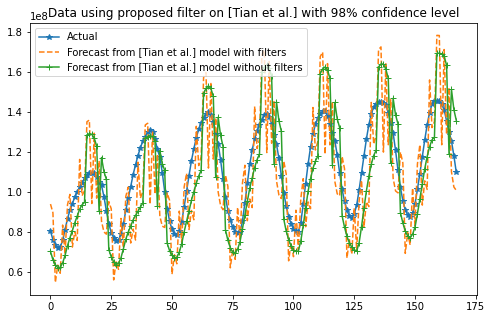

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from [Tian et al.] model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from [Tian et al.] model without filters')
plt.legend()
plt.title("Data using proposed filter on [Tian et al.] with 98% confidence level")
plt.show()

### Wavenet 

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
#train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

In [0]:
model = wavenet.build_wavenet_model(data_sun.shape[1],data_sun.shape[2],16,3,18)
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
conv1d_171 (Conv1D)             (None, 24, 16)       6400        input_4[0][0]                    
__________________________________________________________________________________________________
conv1d_172 (Conv1D)             (None, 24, 16)       784         conv1d_171[0][0]                 
__________________________________________________________________________________________________
conv1d_173 (Conv1D)             (None, 24, 16)       784         conv1d_171[0][0]                 
____________________________________________________________________________________________

##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_sun.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 4:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 39 steps, validate on 19 steps
Epoch 1/50
38/39 [============================>.] - ETA: 1s - loss: 0.0459 - mean_squared_error: 0.0042 - mean_absolute_percentage_error: 105.5889Evaluating: epoch 0 ends at 13:01:17.845803 with MAPE 
5.22135463835189
121.06956644732351
133.37845736084896
39/39 [==============================] - 53s 1s/step - loss: 0.0456 - mean_squared_error: 0.0042 - mean_absolute_percentage_error: 103.8514 - val_loss: 0.0384 - val_mean_squared_error: 0.0025 - val_mean_absolute_percentage_error: 75.5047
Epoch 2/50
38/39 [============================>.] - ETA: 0s - loss: 0.0372 - mean_squared_error: 0.0023 - mean_absolute_percentage_error: 116.0133Evaluating: epoch 1 ends at 13:02:02.406351 with MAPE 
4.798073871151432
111.43639339619818
127.1892141462354
39/39 [==============================] - 37s 946ms/step - loss: 0.0375 - mean_squared_error: 0.0023 - mean_absolute_percentage_error: 115.2296 - val_loss: 0.0384 - val_mean_squared_error: 0.0024 - val_mean_abso

KeyboardInterrupt: ignored

In [0]:
3.559792447660026
3424608.3939229795
4054294.407598905

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_sun.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      #AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)**2)
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=25,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 39 steps, validate on 19 steps
Epoch 1/25
38/39 [============================>.] - ETA: 0s - loss: 0.0659 - mean_squared_error: 0.0073 - mean_absolute_percentage_error: 104.8961Evaluating: epoch 0 ends at 13:27:00.752588 with MAPE 
5.89785183077312
138.18799068106492
151.9563727299542
39/39 [==============================] - 44s 1s/step - loss: 0.0654 - mean_squared_error: 0.0072 - mean_absolute_percentage_error: 103.2827 - val_loss: 0.0485 - val_mean_squared_error: 0.0039 - val_mean_absolute_percentage_error: 102.0423
Epoch 2/25
38/39 [============================>.] - ETA: 0s - loss: 0.0420 - mean_squared_error: 0.0028 - mean_absolute_percentage_error: 107.0489Evaluating: epoch 1 ends at 13:27:39.910915 with MAPE 
4.433105865770452
101.9438569062032
116.75663991512369
39/39 [==============================] - 37s 944ms/step - loss: 0.0416 - mean_squared_error: 0.0028 - mean_absolute_percentage_error: 104.7893 - val_loss: 0.0369 - val_mean_squared_error: 0.0022 - val_mean_abso

In [0]:
3.6016885726862977
3463870.8078632844
4076884.7237214483

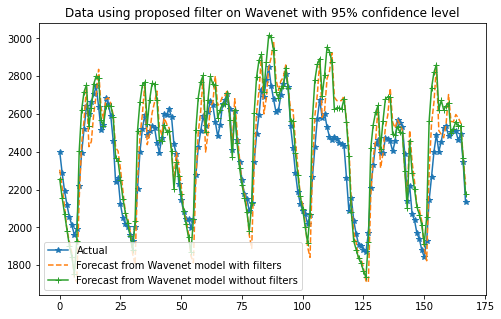

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from Wavenet model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from Wavenet model without filters')
plt.legend()
plt.title("Data using proposed filter on Wavenet with 95% confidence level")
plt.show()

### Wavenet + LSTM

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
#train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

In [0]:
model = wavenet.build_wavenet_model(data_sun.shape[1],data_sun.shape[2],16,3,18)
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
conv1d_114 (Conv1D)             (None, 24, 16)       6400        input_3[0][0]                    
__________________________________________________________________________________________________
conv1d_115 (Conv1D)             (None, 24, 16)       784         conv1d_114[0][0]                 
__________________________________________________________________________________________________
conv1d_116 (Conv1D)             (None, 24, 16)       784         conv1d_114[0][0]                 
____________________________________________________________________________________________

##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
#plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_sun.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      #plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=30,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 39 steps, validate on 19 steps
Epoch 1/30
38/39 [============================>.] - ETA: 1s - loss: 0.0947 - mean_squared_error: 0.0143 - mean_absolute_percentage_error: 111.2691Evaluating: epoch 0 ends at 14:33:46.996971 with MAPE 
7.129431349202964
170.5218010419273
183.53453185688863
39/39 [==============================] - 96s 2s/step - loss: 0.0939 - mean_squared_error: 0.0141 - mean_absolute_percentage_error: 110.7092 - val_loss: 0.0594 - val_mean_squared_error: 0.0055 - val_mean_absolute_percentage_error: 92.5865
Epoch 2/30
38/39 [============================>.] - ETA: 0s - loss: 0.0481 - mean_squared_error: 0.0037 - mean_absolute_percentage_error: 97.0859Evaluating: epoch 1 ends at 14:35:15.476095 with MAPE 
4.8546094457167435
112.4546385214992
127.34467343342429
39/39 [==============================] - 37s 950ms/step - loss: 0.0482 - mean_squared_error: 0.0037 - mean_absolute_percentage_error: 95.7790 - val_loss: 0.0389 - val_mean_squared_error: 0.0024 - val_mean_absol

KeyboardInterrupt: ignored

In [0]:
from tensorflow import keras
from tensorflow.keras import layers, Model
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_sun.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.0001
  else:
    return 0.0001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
model_fine = model.output
model_fine = layers.Reshape((24,1))(model_fine)
model_fine = layers.LSTM(100,return_sequences = True, activation='relu')(model_fine)
model_fine = layers.Dense(1)(model_fine)
model_fine = layers.Flatten()(model_fine)
model_final = Model(inputs=model.input, outputs=model_fine)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=15,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])



Train on 39 steps, validate on 19 steps
Epoch 1/15
38/39 [============================>.] - ETA: 1s - loss: 0.0292 - mean_squared_error: 0.0015 - mean_absolute_percentage_error: 86.7759Evaluating: epoch 0 ends at 14:43:20.762726 with MAPE 
4.480862372473306
102.91804322636608
117.40124171984888
39/39 [==============================] - 52s 1s/step - loss: 0.0292 - mean_squared_error: 0.0015 - mean_absolute_percentage_error: 85.8326 - val_loss: 0.0370 - val_mean_squared_error: 0.0023 - val_mean_absolute_percentage_error: 94.4772
Epoch 2/15
38/39 [============================>.] - ETA: 0s - loss: 0.0285 - mean_squared_error: 0.0014 - mean_absolute_percentage_error: 86.8138Evaluating: epoch 1 ends at 14:44:04.000218 with MAPE 
4.454955563259982
102.37791805416511
116.3180697234271
39/39 [==============================] - 37s 950ms/step - loss: 0.0288 - mean_squared_error: 0.0015 - mean_absolute_percentage_error: 85.6395 - val_loss: 0.0372 - val_mean_squared_error: 0.0023 - val_mean_absolut

KeyboardInterrupt: ignored

In [0]:
3.539693634817098
3406576.6528809867
4029700.5747583597

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
#plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      #plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      #AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)**2)
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=500,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/500
272/273 [============================>.] - ETA: 0s - loss: 0.0492 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 5512.8315Evaluating: epoch 0 ends at 23:57:35.776178 with MAPE 
6.622000204974834
1302.002388145604
1635.8096938668857
273/273 [==============================] - 269s 984ms/step - loss: 0.0493 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 5493.0996 - val_loss: 0.0480 - val_mean_squared_error: 0.0035 - val_mean_absolute_percentage_error: 9400.5996
Epoch 2/500
272/273 [============================>.] - ETA: 0s - loss: 0.0496 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 11589.4629Evaluating: epoch 1 ends at 00:02:00.540468 with MAPE 
6.564630119162653
1304.4957647077645
1614.739487032414
273/273 [==============================] - 249s 913ms/step - loss: 0.0495 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 11548.3525 - val_loss: 0.0466 - val_mean_squared_erro

KeyboardInterrupt: ignored

KeyboardInterrupt: ignored

In [0]:
from tensorflow import keras
from tensorflow.keras import layers, Model
#for tensorflow 2.0
import datetime
plot_val1= []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_sun.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (10 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
model_fine = model.output
model_fine = layers.Reshape((24,1))(model_fine)
model_fine = layers.LSTM(100,return_sequences = True, activation='relu')(model_fine)
model_fine = layers.Dense(1)(model_fine)
model_fine = layers.Flatten()(model_fine)
model_final = Model(inputs=model.input, outputs=model_fine)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=15,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])



Train on 39 steps, validate on 19 steps
Epoch 1/15
38/39 [============================>.] - ETA: 0s - loss: 0.0349 - mean_squared_error: 0.0021 - mean_absolute_percentage_error: 90.8099Evaluating: epoch 0 ends at 13:49:47.005798 with MAPE 
4.462241647617323
102.47121205376388
115.29971437963755
39/39 [==============================] - 45s 1s/step - loss: 0.0347 - mean_squared_error: 0.0021 - mean_absolute_percentage_error: 89.4149 - val_loss: 0.0360 - val_mean_squared_error: 0.0022 - val_mean_absolute_percentage_error: 99.2949
Epoch 2/15
38/39 [============================>.] - ETA: 0s - loss: 0.0351 - mean_squared_error: 0.0021 - mean_absolute_percentage_error: 104.6893Evaluating: epoch 1 ends at 13:50:26.873395 with MAPE 
4.341437528663048
99.79451644472694
113.24151192395685
39/39 [==============================] - 37s 945ms/step - loss: 0.0347 - mean_squared_error: 0.0021 - mean_absolute_percentage_error: 102.4529 - val_loss: 0.0360 - val_mean_squared_error: 0.0022 - val_mean_absol

In [0]:
6.451660636678543
1279.6313291944734
1605.4005080892537

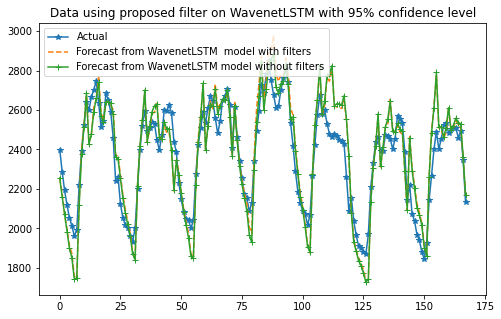

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from WavenetLSTM  model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from WavenetLSTM model without filters')
plt.legend()
plt.title("Data using proposed filter on WavenetLSTM with 95% confidence level")
plt.show()

### DAE

#### Training

##### With filter

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

bbrbm = RBMDAE.BBRBM(n_visible=24, n_hidden=64, learning_rate=0.001, momentum=0.95, use_tqdm=True)
errs = bbrbm.fit(x_train[:,:,0], n_epoches=200, batch_size=4)



Instructions for updating:
Use `tf.cast` instead.


Epoch: 0: 100%|##########| 274/274 [00:02<00:00, 116.50it/s]
Train error: 0.2751

Epoch: 1: 100%|##########| 274/274 [00:00<00:00, 369.05it/s]
Train error: 0.1958

Epoch: 2: 100%|##########| 274/274 [00:00<00:00, 349.76it/s]
Train error: 0.1408

Epoch: 3: 100%|##########| 274/274 [00:00<00:00, 374.94it/s]
Train error: 0.1032

Epoch: 4: 100%|##########| 274/274 [00:00<00:00, 365.88it/s]
Train error: 0.0773

Epoch: 5: 100%|##########| 274/274 [00:00<00:00, 364.99it/s]
Train error: 0.0593

Epoch: 6: 100%|##########| 274/274 [00:00<00:00, 369.72it/s]
Train error: 0.0467

Epoch: 7: 100%|##########| 274/274 [00:00<00:00, 361.12it/s]
Train error: 0.0375

Epoch: 8: 100%|##########| 274/274 [00:00<00:00, 369.90it/s]
Train error: 0.0308

Epoch: 9: 100%|##########| 274/274 [00:00<00:00, 363.77it/s]
Train error: 0.0258

Epoch: 10: 100%|##########| 274/274 [00:00<00:00, 358.69it/s]
Train error: 0.0219

Epoch: 11: 100%|##########| 274/274 [00:00<

In [0]:
AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val = []
for i in range(len(test_inp)):
  test_pred = bbrbm.reconstruct(test_inp[i,:,0:1].reshape(-1,24))
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

6.050606044780152
5645458.178944004
6881657.097681694


In [0]:
6.050606044780152
5645458.178944004
6881657.097681694

##### No filter

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

bbrbm = RBMDAE.BBRBM(n_visible=24, n_hidden=64, learning_rate=0.001, momentum=0.95, use_tqdm=True)
errs = bbrbm.fit(x_train[:,:,0], n_epoches=150, batch_size=4)

Epoch: 0: 100%|##########| 274/274 [00:00<00:00, 346.62it/s]
Train error: 0.2354

Epoch: 1: 100%|##########| 274/274 [00:00<00:00, 359.11it/s]
Train error: 0.1676

Epoch: 2: 100%|##########| 274/274 [00:00<00:00, 350.48it/s]
Train error: 0.1211

Epoch: 3: 100%|##########| 274/274 [00:00<00:00, 358.04it/s]
Train error: 0.0895

Epoch: 4: 100%|##########| 274/274 [00:00<00:00, 361.87it/s]
Train error: 0.0678

Epoch: 5: 100%|##########| 274/274 [00:00<00:00, 356.74it/s]
Train error: 0.0527

Epoch: 6: 100%|##########| 274/274 [00:00<00:00, 356.70it/s]
Train error: 0.0419

Epoch: 7: 100%|##########| 274/274 [00:00<00:00, 351.79it/s]
Train error: 0.0340

Epoch: 8: 100%|##########| 274/274 [00:00<00:00, 380.78it/s]
Train error: 0.0281

Epoch: 9: 100%|##########| 274/274 [00:00<00:00, 357.16it/s]
Train error: 0.0237

Epoch: 10: 100%|##########| 274/274 [00:00<00:00, 360.31it/s]
Train error: 0.0203

Epoch: 11: 100%|##########| 274/274 [00:00<00:00, 353.57it/s]
Train error: 0.0176

Epoch: 12: 100

In [0]:
AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val1 = []
for i in range(len(test_inp)):
  test_pred = bbrbm.reconstruct(test_inp[i,:,0:1].reshape(-1,24))
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

6.052395940856418
5641764.380505451
6879584.29225612


In [0]:
6.052395940856418
5641764.380505451
6879584.29225612

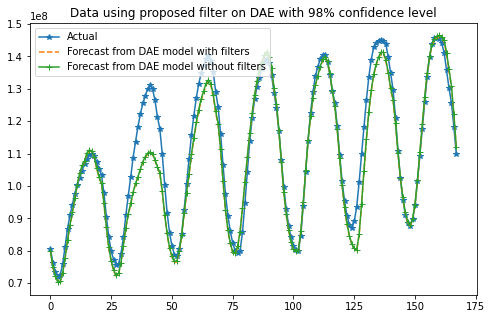

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0,:].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from DAE model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from DAE model without filters')
plt.legend()
plt.title("Data using proposed filter on DAE with 98% confidence level")
plt.show()

### WNN 

In [0]:
inp_high, inp_low_low, inp_low_high = waveletFunction.extract(inp)

In [0]:
# for pure keras
x_train_high, x_val_high, y_train, y_val = train_test_split(inp_high,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

In [0]:
# for pure keras
x_train_low_low, x_val_low_low, y_train, y_val = train_test_split(inp_low_low,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

In [0]:
# for pure keras
x_train_low_high, x_val_low_high, y_train, y_val = train_test_split(inp_low_high,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

In [0]:
# define two sets of inputs
inputA = tf.keras.Input(shape=(x_train_high.shape[1],x_train_high.shape[2]))
inputB = tf.keras.Input(shape=(x_train_low_low.shape[1],x_train_low_low.shape[2]))
inputC = tf.keras.Input(shape=(x_train_low_high.shape[1],x_train_low_high.shape[2]))

# the first branch opreates on the first input
x = tf.keras.layers.Dense(100, activation="selu")(inputA)
x = tf.keras.layers.Dense(100, activation="selu")(x)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dropout(0.3)(x)
x = tf.keras.layers.Dense(24, activation="linear")(x)
x = tf.keras.Model(inputs = inputA, outputs = x)

# the second branch opreates on the second input
y = tf.keras.layers.Dense(100, activation="selu")(inputB)
y = tf.keras.layers.Dense(100, activation="selu")(y)
y = tf.keras.layers.Flatten()(y)
y = tf.keras.layers.Dropout(0.3)(y)
y = tf.keras.layers.Dense(24, activation="linear")(y)
y = tf.keras.Model(inputs = inputB, outputs = y)

# the third branch opreates on the third input
z = tf.keras.layers.Dense(100, activation="selu")(inputC)
z = tf.keras.layers.Dense(100, activation="selu")(z)
z = tf.keras.layers.Flatten()(z)
z = tf.keras.layers.Dropout(0.3)(z)
z = tf.keras.layers.Dense(24, activation="linear")(z)
z = tf.keras.Model(inputs = inputC, outputs = z)

total = tf.keras.layers.Add()([x.output,y.output,z.output])

model = tf.keras.Model(inputs=[x.input, y.input, z.input], outputs=total)

In [0]:
model.summary()

Model: "model_35"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_25 (InputLayer)           [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
input_26 (InputLayer)           [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
input_27 (InputLayer)           [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
dense_72 (Dense)                (None, 24, 100)      13400       input_25[0][0]                   
___________________________________________________________________________________________

##### Training

###### With filter

In [0]:
#for tensorflow 2.0

def scheduler(epoch):
  if epoch < 5:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer='rmsprop', loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit([x_train_high,x_train_low_low,x_train_low_high],y_train[:,:,0], batch_size=4, epochs=50,
                      validation_data=([x_val_high,x_val_low_low,x_val_low_high],y_val[:,:,0]),callbacks=[callback])

Train on 1095 samples, validate on 540 samples
Epoch 1/50
1095/1095 [==============================] - 3s 3ms/sample - loss: 4.6169 - mean_squared_error: 63.0875 - mean_absolute_percentage_error: 112383.7578 - val_loss: 2.7066 - val_mean_squared_error: 12.0281 - val_mean_absolute_percentage_error: 198691.7344
Epoch 2/50
1095/1095 [==============================] - 2s 2ms/sample - loss: 2.8306 - mean_squared_error: 12.9198 - mean_absolute_percentage_error: 45135.6328 - val_loss: 2.3882 - val_mean_squared_error: 8.9834 - val_mean_absolute_percentage_error: 368566.3750
Epoch 3/50
1095/1095 [==============================] - 2s 2ms/sample - loss: 2.8949 - mean_squared_error: 13.7262 - mean_absolute_percentage_error: 64914.6445 - val_loss: 3.0314 - val_mean_squared_error: 14.3317 - val_mean_absolute_percentage_error: 75142.7578
Epoch 4/50
1095/1095 [==============================] - 2s 2ms/sample - loss: 2.9827 - mean_squared_error: 14.1408 - mean_absolute_percentage_error: 43547.1211 - val

In [0]:
import pywt

testinp_high, testinp_low_low, testinp_low_high = waveletFunction.extract(test_inp)

AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val = []
for i in range(len(test_inp)):
  test_pred = model.predict([testinp_high[i].reshape(-1,24,133),testinp_low_low[i].reshape(-1,24,133),testinp_low_high[i].reshape(-1,24,133)])
  
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred.reshape(-1)
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

3.5227531822414146
3418438.3851726702
4061634.606719081


In [0]:
3.5227531822414146
3418438.3851726702
4061634.606719081

###### No filter

In [0]:
#for tensorflow 2.0

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer='rmsprop', loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit([x_train_high,x_train_low_low,x_train_low_high],y_train[:,:,0], batch_size=4, epochs=25,
                      validation_data=([x_val_high,x_val_low_low,x_val_low_high],y_val[:,:,0]),callbacks=[callback])

Train on 1095 samples, validate on 540 samples
Epoch 1/25
1095/1095 [==============================] - 3s 3ms/sample - loss: 0.6615 - mean_squared_error: 0.7242 - mean_absolute_percentage_error: 10880.6328 - val_loss: 0.4649 - val_mean_squared_error: 0.3342 - val_mean_absolute_percentage_error: 8876.6162
Epoch 2/25
1095/1095 [==============================] - 2s 2ms/sample - loss: 0.4237 - mean_squared_error: 0.2854 - mean_absolute_percentage_error: 7508.0879 - val_loss: 0.3049 - val_mean_squared_error: 0.1442 - val_mean_absolute_percentage_error: 8361.1455
Epoch 3/25
1095/1095 [==============================] - 2s 2ms/sample - loss: 0.2993 - mean_squared_error: 0.1423 - mean_absolute_percentage_error: 4951.8799 - val_loss: 0.2436 - val_mean_squared_error: 0.0911 - val_mean_absolute_percentage_error: 53516.4297
Epoch 4/25
1095/1095 [==============================] - 2s 2ms/sample - loss: 0.2255 - mean_squared_error: 0.0800 - mean_absolute_percentage_error: 3384.4556 - val_loss: 0.1822 

In [0]:
import pywt

testinp_high, testinp_low_low, testinp_low_high = waveletFunction.extract(test_inp)

AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val1 = []
for i in range(len(test_inp)):
  test_pred = model.predict([testinp_high[i].reshape(-1,24,133),testinp_low_low[i].reshape(-1,24,133),testinp_low_high[i].reshape(-1,24,133)])
  
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred.reshape(-1)
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

3.6331669328361476
3525543.550924314
4106249.429547678


In [0]:
3.6331669328361476
3525543.550924314
4106249.429547678

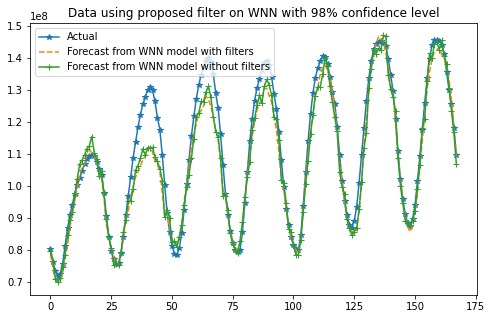

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0,:].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from WNN model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from WNN model without filters')
plt.legend()
plt.title("Data using proposed filter on WNN with 98% confidence level")
plt.show()

# Rests dataset

## Setup environment, import libraries

In [0]:
import tensorflow as tf
import pandas as pd
import numpy as np
import os
from collections import Counter
import matplotlib
import matplotlib.pyplot as plt
import random
import shutil
import tensorflow.contrib.learn as tflearn
import tensorflow.contrib.layers as tflayers
from tensorflow.contrib.learn.python.learn import learn_runner
import tensorflow.contrib.metrics as metrics
import tensorflow.contrib.rnn as rnn
from google.colab import files
from matplotlib.pyplot import figure
from sklearn.model_selection import train_test_split

#Set a fixed random value so that every time the code is running it will yield the same results.
from numpy.random import seed
seed(1611)

#Set a fixed random value so that every time the code is running it will yield the same results.
from tensorflow import set_random_seed
set_random_seed(3116)

!git clone https://github.com/a11to1n3/StatFilterAppliedInSTLFDeeplearning.git


# Change to the repository folder
%cd StatFilterAppliedInSTLFDeeplearning

# Import all the neccessary modules in the cloned repository
import dataWrangling
import dataPCA
import dataHourSplit
import dataFilter
import confidenceLevelFitness
import LSTMModelBuilder
import CNNLSTMModelBuilder
import wavenet
import RBMDAE
import waveletFunction
import modelBuilder

Cloning into 'StatFilterAppliedInSTLFDeeplearning'...
remote: Enumerating objects: 141, done.
remote: Counting objects: 100% (141/141), done.
remote: Compressing objects: 100% (100/100), done.
remote: Total 141 (delta 83), reused 99 (delta 41), pack-reused 0
Receiving objects: 100% (141/141), 23.13 KiB | 147.00 KiB/s, done.
Resolving deltas: 100% (83/83), done.
/content/StatFilterAppliedInSTLFDeeplearning/StatFilterAppliedInSTLFDeeplearning


## Load dataset

In [0]:
# Run this and select the DayMarked.csv file in your computer
files.upload()

Saving DayMarked.csv to DayMarked.csv


{'DayMarked.csv': b'Thu,Ngay,00:00,01:00,02:00,03:00,04:00,05:00,06:00,07:00,08:00,09:00,10:00,11:00,12:00,13:00,14:00,15:00,16:00,17:00,18:00,19:00,20:00,21:00,22:00,23:00,Holiday,Week number\r\n2,11/01/10,993.6,953.9,956.2,968.6,1020.7,1158.4,1375.6,1813.2,1938.2,2011.7,2022.8,1776.5,1847.6,2046.3,2077.8,2101.4,2017.6,2052,1939.7,1892.4,1815.6,1660.7,1474,1342.6,0,44\r\n3,11/2/10,1231.7,1183.7,1170.1,1168.9,1190.9,1318.8,1482,1967.6,2150.6,2233,2239.6,2002.7,2099.3,2246.7,2249.9,2265.5,2206.2,2116.4,2019.5,1936.8,1870.3,1712.7,1510,1285.8,0,44\r\n4,11/3/10,1243.6,1221.1,1197.6,1198.2,1219.8,1321.9,1481.2,1934.6,2126.8,2187.3,2188.6,1959.9,2028.7,2218.2,2270,2270.6,2118.1,2141.3,2006.6,1975.2,1921.6,1760.1,1585.7,1427.3,0,44\r\n5,11/4/10,1303.3,1255.7,1219.4,1213.3,1249.4,1230,1481.1,1910.8,2062.8,2173.6,2170.7,1929.7,2048.5,2237.5,2243,2023.9,1952.8,1980.6,2015.7,1949.3,1901.7,1729,1534,1292.4,0,44\r\n6,11/5/10,1176.8,1178.3,1165.2,1171.7,1192.7,1313,1489.9,1947.2,2081.1,2153.8,2166.

## Pre-process dataset to 133 dimensions and scale it

The shape of the array is: (1818, 24, 133)


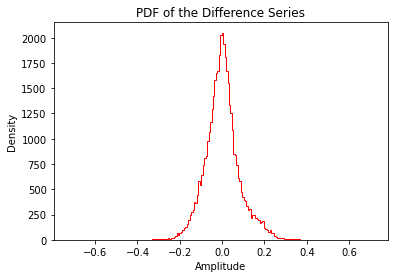

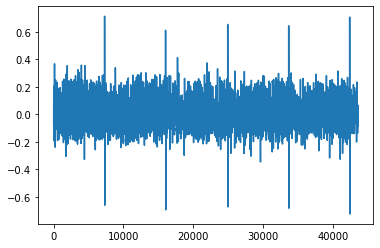

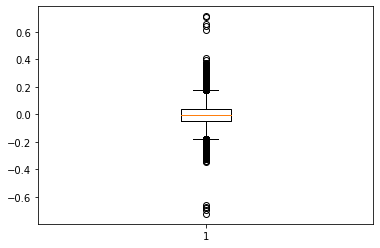

In [0]:
wrangledData = dataWrangling.csvToArray('DayMarked.csv')
#wrangledData = dataWrangling.csvToArray('DayMarked (STLF Data Inputs Template) 13112019.csv')

# Check for the shape of the array after wrangling the data
print("The shape of the array is: {}".format(np.shape(wrangledData)))

# x_scaled is the scaled data conducted by the log and differencing functions
# x_orig is the original data without being scaled
# prex_orig is the original data without being scaled of the day before analyzing day
mon_scaled, sun_scaled, rests_scaled, mon_orig, sun_orig, rests_orig, presun_orig, premon_orig = dataPCA.plotPCAandSplit(wrangledData)

## Filter data for each given confidence level

In [0]:
# Data filtered with confidence level of 90
data_90 = dataFilter.filterWithConfidenceLevel(data_scaled, 90)

# Data filtered with confidence level of 91
data_91 = dataFilter.filterWithConfidenceLevel(data_scaled, 91)

# Data filtered with confidence level of 92
data_92 = dataFilter.filterWithConfidenceLevel(data_scaled, 92)

# Data filtered with confidence level of 93
data_93 = dataFilter.filterWithConfidenceLevel(data_scaled, 93)

# Data filtered with confidence level of 94
data_94 = dataFilter.filterWithConfidenceLevel(data_scaled, 94)

# Data filtered with confidence level of 95
data_95 = dataFilter.filterWithConfidenceLevel(data_scaled, 95)

# Data filtered with confidence level of 96
data_96 = dataFilter.filterWithConfidenceLevel(data_scaled, 96)

# Data filtered with confidence level of 97
data_97 = dataFilter.filterWithConfidenceLevel(data_scaled, 97)

# Data filtered with confidence level of 98
data_98 = dataFilter.filterWithConfidenceLevel(data_scaled, 98)

# Data filtered with confidence level of 99
data_99 = dataFilter.filterWithConfidenceLevel(data_scaled, 99)

# Data filtered with confidence level of 99.73
data_3sigma = dataFilter.filterWithConfidenceLevel(data_scaled, 99.73)

# Data filtered with confidence level of 99.99366
data_4sigma = dataFilter.filterWithConfidenceLevel(data_scaled, 99.99366)

# Data filtered with confidence level of 99.99932
data_4sigma5 = dataFilter.filterWithConfidenceLevel(data_scaled, 99.99932)

NameError: ignored

In [0]:
# Monday data filtered with confidence level of 90
mon_to4_90 = dataFilter.filterWithConfidenceLevel(mon_to4, 90)
mon_5to6_90 = dataFilter.filterWithConfidenceLevel(mon_5to6, 90)
mon_7to16_90 = dataFilter.filterWithConfidenceLevel(mon_7to16, 90)
mon_17to23_90 = dataFilter.filterWithConfidenceLevel(mon_17to23, 90)

# Monday data filtered with confidence level of 91
mon_to4_91 = dataFilter.filterWithConfidenceLevel(mon_to4, 91)
mon_5to6_91 = dataFilter.filterWithConfidenceLevel(mon_5to6, 91)
mon_7to16_91 = dataFilter.filterWithConfidenceLevel(mon_7to16, 91)
mon_17to23_91 = dataFilter.filterWithConfidenceLevel(mon_17to23, 91)

# Monday data filtered with confidence level of 92
mon_to4_92 = dataFilter.filterWithConfidenceLevel(mon_to4, 92)
mon_5to6_92 = dataFilter.filterWithConfidenceLevel(mon_5to6, 92)
mon_7to16_92 = dataFilter.filterWithConfidenceLevel(mon_7to16, 92)
mon_17to23_92 = dataFilter.filterWithConfidenceLevel(mon_17to23, 92)

# Monday data filtered with confidence level of 93
mon_to4_93 = dataFilter.filterWithConfidenceLevel(mon_to4, 93)
mon_5to6_93 = dataFilter.filterWithConfidenceLevel(mon_5to6, 93)
mon_7to16_93 = dataFilter.filterWithConfidenceLevel(mon_7to16, 93)
mon_17to23_93 = dataFilter.filterWithConfidenceLevel(mon_17to23, 93)

# Monday data filtered with confidence level of 94
mon_to4_94 = dataFilter.filterWithConfidenceLevel(mon_to4, 94)
mon_5to6_94 = dataFilter.filterWithConfidenceLevel(mon_5to6, 94)
mon_7to16_94 = dataFilter.filterWithConfidenceLevel(mon_7to16, 94)
mon_17to23_94 = dataFilter.filterWithConfidenceLevel(mon_17to23, 94)

# Monday data filtered with confidence level of 95
mon_to4_95 = dataFilter.filterWithConfidenceLevel(mon_to4, 95)
mon_5to6_95 = dataFilter.filterWithConfidenceLevel(mon_5to6, 95)
mon_7to16_95 = dataFilter.filterWithConfidenceLevel(mon_7to16, 95)
mon_17to23_95 = dataFilter.filterWithConfidenceLevel(mon_17to23, 95)

# Monday data filtered with confidence level of 96
mon_to4_96 = dataFilter.filterWithConfidenceLevel(mon_to4, 96)
mon_5to6_96 = dataFilter.filterWithConfidenceLevel(mon_5to6, 96)
mon_7to16_96 = dataFilter.filterWithConfidenceLevel(mon_7to16, 96)
mon_17to23_96 = dataFilter.filterWithConfidenceLevel(mon_17to23, 96)

# Monday data filtered with confidence level of 97
mon_to4_97 = dataFilter.filterWithConfidenceLevel(mon_to4, 97)
mon_5to6_97 = dataFilter.filterWithConfidenceLevel(mon_5to6, 97)
mon_7to16_97 = dataFilter.filterWithConfidenceLevel(mon_7to16, 97)
mon_17to23_97 = dataFilter.filterWithConfidenceLevel(mon_17to23, 97)

# Monday data filtered with confidence level of 98
mon_to4_98 = dataFilter.filterWithConfidenceLevel(mon_to4, 98)
mon_5to6_98 = dataFilter.filterWithConfidenceLevel(mon_5to6, 98)
mon_7to16_98 = dataFilter.filterWithConfidenceLevel(mon_7to16, 98)
mon_17to23_98 = dataFilter.filterWithConfidenceLevel(mon_17to23, 98)

# Monday data filtered with confidence level of 99
mon_to4_99 = dataFilter.filterWithConfidenceLevel(mon_to4, 99)
mon_5to6_99 = dataFilter.filterWithConfidenceLevel(mon_5to6, 99)
mon_7to16_99 = dataFilter.filterWithConfidenceLevel(mon_7to16, 99)
mon_17to23_99 = dataFilter.filterWithConfidenceLevel(mon_17to23, 99)

# Monday data filtered with confidence level of 99.73
mon_to4_3sigma = dataFilter.filterWithConfidenceLevel(mon_to4, 99.73)
mon_5to6_3sigma = dataFilter.filterWithConfidenceLevel(mon_5to6, 99.73)
mon_7to16_3sigma = dataFilter.filterWithConfidenceLevel(mon_7to16, 99.73)
mon_17to23_3sigma = dataFilter.filterWithConfidenceLevel(mon_17to23, 99.73)

# Monday data filtered with confidence level of 99.99366
mon_to4_4sigma = dataFilter.filterWithConfidenceLevel(mon_to4, 99.99366)
mon_5to6_4sigma = dataFilter.filterWithConfidenceLevel(mon_5to6, 99.99366)
mon_7to16_4sigma = dataFilter.filterWithConfidenceLevel(mon_7to16, 99.99366)
mon_17to23_4sigma = dataFilter.filterWithConfidenceLevel(mon_17to23, 99.99366)

# Monday data filtered with confidence level of 99.99932
mon_to4_4sigma5 = dataFilter.filterWithConfidenceLevel(mon_to4, 99.99932)
mon_5to6_4sigma5 = dataFilter.filterWithConfidenceLevel(mon_5to6, 99.99932)
mon_7to16_4sigma5 = dataFilter.filterWithConfidenceLevel(mon_7to16, 99.99932)
mon_17to23_4sigma5 = dataFilter.filterWithConfidenceLevel(mon_17to23, 99.99932)

In [0]:
# Sunday data filtered with confidence level of 90
sun_to4_90 = dataFilter.filterWithConfidenceLevel(sun_to4, 90)
sun_5to6_90 = dataFilter.filterWithConfidenceLevel(sun_5to6, 90)
sun_7to15_90 = dataFilter.filterWithConfidenceLevel(sun_7to15, 90)
sun_16to23_90 = dataFilter.filterWithConfidenceLevel(sun_16to23, 90)

# Sunday data filtered with confidence level of 91
sun_to4_91 = dataFilter.filterWithConfidenceLevel(sun_to4, 91)
sun_5to6_91 = dataFilter.filterWithConfidenceLevel(sun_5to6, 91)
sun_7to15_91 = dataFilter.filterWithConfidenceLevel(sun_7to15, 91)
sun_16to23_91 = dataFilter.filterWithConfidenceLevel(sun_16to23, 91)

# Sunday data filtered with confidence level of 92
sun_to4_92 = dataFilter.filterWithConfidenceLevel(sun_to4, 92)
sun_5to6_92 = dataFilter.filterWithConfidenceLevel(sun_5to6, 92)
sun_7to15_92 = dataFilter.filterWithConfidenceLevel(sun_7to15, 92)
sun_16to23_92 = dataFilter.filterWithConfidenceLevel(sun_16to23, 92)

# Sunday data filtered with confidence level of 93
sun_to4_93 = dataFilter.filterWithConfidenceLevel(sun_to4, 93)
sun_5to6_93 = dataFilter.filterWithConfidenceLevel(sun_5to6, 93)
sun_7to15_93 = dataFilter.filterWithConfidenceLevel(sun_7to15, 93)
sun_16to23_93 = dataFilter.filterWithConfidenceLevel(sun_16to23, 93)

# Sunday data filtered with confidence level of 94
sun_to4_94 = dataFilter.filterWithConfidenceLevel(sun_to4, 94)
sun_5to6_94 = dataFilter.filterWithConfidenceLevel(sun_5to6, 94)
sun_7to15_94 = dataFilter.filterWithConfidenceLevel(sun_7to15, 94)
sun_16to23_94 = dataFilter.filterWithConfidenceLevel(sun_16to23, 94)

# Sunday data filtered with confidence level of 95
sun_to4_95 = dataFilter.filterWithConfidenceLevel(sun_to4, 95)
sun_5to6_95 = dataFilter.filterWithConfidenceLevel(sun_5to6, 95)
sun_7to15_95 = dataFilter.filterWithConfidenceLevel(sun_7to15, 95)
sun_16to23_95 = dataFilter.filterWithConfidenceLevel(sun_16to23, 95)

# Sunday data filtered with confidence level of 96
sun_to4_96 = dataFilter.filterWithConfidenceLevel(sun_to4, 96)
sun_5to6_96 = dataFilter.filterWithConfidenceLevel(sun_5to6, 96)
sun_7to15_96 = dataFilter.filterWithConfidenceLevel(sun_7to15, 96)
sun_16to23_96 = dataFilter.filterWithConfidenceLevel(sun_16to23, 96)

# Sunday data filtered with confidence level of 97
sun_to4_97 = dataFilter.filterWithConfidenceLevel(sun_to4, 97)
sun_5to6_97 = dataFilter.filterWithConfidenceLevel(sun_5to6, 97)
sun_7to15_97 = dataFilter.filterWithConfidenceLevel(sun_7to15, 97)
sun_16to23_97 = dataFilter.filterWithConfidenceLevel(sun_16to23, 97)

# Sunday data filtered with confidence level of 98
sun_to4_98 = dataFilter.filterWithConfidenceLevel(sun_to4, 98)
sun_5to6_98 = dataFilter.filterWithConfidenceLevel(sun_5to6, 98)
sun_7to15_98 = dataFilter.filterWithConfidenceLevel(sun_7to15, 98)
sun_16to23_98 = dataFilter.filterWithConfidenceLevel(sun_16to23, 98)

# Sunday data filtered with confidence level of 99
sun_to4_99 = dataFilter.filterWithConfidenceLevel(sun_to4, 99)
sun_5to6_99 = dataFilter.filterWithConfidenceLevel(sun_5to6, 99)
sun_7to15_99 = dataFilter.filterWithConfidenceLevel(sun_7to15, 99)
sun_16to23_99 = dataFilter.filterWithConfidenceLevel(sun_16to23, 99)

# Sunday data filtered with confidence level of 99.73
sun_to4_3sigma = dataFilter.filterWithConfidenceLevel(sun_to4, 99.73)
sun_5to6_3sigma = dataFilter.filterWithConfidenceLevel(sun_5to6, 99.73)
sun_7to15_3sigma = dataFilter.filterWithConfidenceLevel(sun_7to15, 99.73)
sun_16to23_3sigma = dataFilter.filterWithConfidenceLevel(sun_16to23, 99.73)

# Sunday data filtered with confidence level of 99.99366
sun_to4_4sigma = dataFilter.filterWithConfidenceLevel(sun_to4, 99.99366)
sun_5to6_4sigma = dataFilter.filterWithConfidenceLevel(sun_5to6, 99.99366)
sun_7to15_4sigma = dataFilter.filterWithConfidenceLevel(sun_7to15, 99.99366)
sun_16to23_4sigma = dataFilter.filterWithConfidenceLevel(sun_16to23, 99.99366)

# Sunday data filtered with confidence level of 99.99932
sun_to4_4sigma5 = dataFilter.filterWithConfidenceLevel(sun_to4, 99.99932)
sun_5to6_4sigma5 = dataFilter.filterWithConfidenceLevel(sun_5to6, 99.99932)
sun_7to15_4sigma5 = dataFilter.filterWithConfidenceLevel(sun_7to15, 99.99932)
sun_16to23_4sigma5 = dataFilter.filterWithConfidenceLevel(sun_16to23, 99.99932)

In [0]:
# Remaining days data filtered with confidence level of 90
rests_scaled_90 = dataFilter.filterWithConfidenceLevel(rests_scaled, 90)
# Remaining days data filtered with confidence level of 91
rests_scaled_91 = dataFilter.filterWithConfidenceLevel(rests_scaled, 91)
# Remaining days data filtered with confidence level of 92
rests_scaled_92 = dataFilter.filterWithConfidenceLevel(rests_scaled, 92)
# Remaining days data filtered with confidence level of 93
rests_scaled_93 = dataFilter.filterWithConfidenceLevel(rests_scaled, 93)
# Remaining days data filtered with confidence level of 94
rests_scaled_94 = dataFilter.filterWithConfidenceLevel(rests_scaled, 94)
# Remaining days data filtered with confidence level of 95
rests_scaled_95 = dataFilter.filterWithConfidenceLevel(rests_scaled, 95)
# Remaining days data filtered with confidence level of 96
rests_scaled_96 = dataFilter.filterWithConfidenceLevel(rests_scaled, 96)
# Remaining days data filtered with confidence level of 97
rests_scaled_97 = dataFilter.filterWithConfidenceLevel(rests_scaled, 97)
# Remaining days data filtered with confidence level of 98
rests_scaled_98 = dataFilter.filterWithConfidenceLevel(rests_scaled, 98)
# Remaining days data filtered with confidence level of 99
rests_scaled_99 = dataFilter.filterWithConfidenceLevel(rests_scaled, 99)
# Remaining days data filtered with confidence level of 3sigma
rests_scaled_3sigma = dataFilter.filterWithConfidenceLevel(rests_scaled, 99.73)
# Remaining days data filtered with confidence level of 4sigma
rests_scaled_4sigma = dataFilter.filterWithConfidenceLevel(rests_scaled, 99.99366)
# Remaining days data filtered with confidence level of 4sigma5
rests_scaled_4sigma5 = dataFilter.filterWithConfidenceLevel(rests_scaled, 99.99932)

## Calculate the MAPE for each of the data intervals and find the confidence level that has the smallest MAPE in each data intervals

### Create an empty MAPE object containing all the intervals with their confidence levels

In [0]:
MAPE = {
    "data" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    }
}

In [0]:
MAPE = {
    "mon_to4" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "mon_5to6" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "mon_7to16" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "mon_17to23" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "sun_to4" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "sun_5to6" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "sun_7to15" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "sun_16to23" : {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    },
    "rests": {
        "90": 0,
        "91": 0,
        "92": 0,
        "93": 0,
        "94": 0,
        "95": 0,
        "96": 0,
        "97": 0,
        "98": 0,
        "99": 0,
        "3sigma": 0,
        "4sigma": 0,
        "4sigma5": 0
    } 
}

In [0]:
MAPE['data']['90'] = confidenceLevelFitness.calculateMAPE(data_90,data_scaled,50,8)
MAPE['data']['91'] = confidenceLevelFitness.calculateMAPE(data_91,data_scaled,50,8)
MAPE['data']['92'] = confidenceLevelFitness.calculateMAPE(data_92,data_scaled,50,8)
MAPE['data']['93'] = confidenceLevelFitness.calculateMAPE(data_93,data_scaled,50,8)
MAPE['data']['94'] = confidenceLevelFitness.calculateMAPE(data_94,data_scaled,50,8)
MAPE['data']['95'] = confidenceLevelFitness.calculateMAPE(data_95,data_scaled,50,8)
MAPE['data']['96'] = confidenceLevelFitness.calculateMAPE(data_96,data_scaled,50,8)
MAPE['data']['97'] = confidenceLevelFitness.calculateMAPE(data_97,data_scaled,50,8)
MAPE['data']['98'] = confidenceLevelFitness.calculateMAPE(data_98,data_scaled,50,8)
MAPE['data']['99'] = confidenceLevelFitness.calculateMAPE(data_99,data_scaled,50,8)
MAPE['data']['3sigma'] = confidenceLevelFitness.calculateMAPE(data_3sigma,data_scaled,50,8)
MAPE['data']['4sigma'] = confidenceLevelFitness.calculateMAPE(data_4sigma,data_scaled,50,8)
MAPE['data']['4sigma5'] = confidenceLevelFitness.calculateMAPE(data_4sigma5,data_scaled,50,8)

In [0]:
MAPE['mon_to4']['90'] = confidenceLevelFitness.calculateMAPE(mon_to4_90,mon_to4,100,2)
MAPE['mon_to4']['91'] = confidenceLevelFitness.calculateMAPE(mon_to4_91,mon_to4,100,2)
MAPE['mon_to4']['92'] = confidenceLevelFitness.calculateMAPE(mon_to4_92,mon_to4,100,2)
MAPE['mon_to4']['93'] = confidenceLevelFitness.calculateMAPE(mon_to4_93,mon_to4,100,2)
MAPE['mon_to4']['94'] = confidenceLevelFitness.calculateMAPE(mon_to4_94,mon_to4,100,2)
MAPE['mon_to4']['95'] = confidenceLevelFitness.calculateMAPE(mon_to4_95,mon_to4,100,2)
MAPE['mon_to4']['96'] = confidenceLevelFitness.calculateMAPE(mon_to4_96,mon_to4,100,2)
MAPE['mon_to4']['97'] = confidenceLevelFitness.calculateMAPE(mon_to4_97,mon_to4,100,2)
MAPE['mon_to4']['98'] = confidenceLevelFitness.calculateMAPE(mon_to4_98,mon_to4,100,2)
MAPE['mon_to4']['99'] = confidenceLevelFitness.calculateMAPE(mon_to4_99,mon_to4,100,2)
MAPE['mon_to4']['3sigma'] = confidenceLevelFitness.calculateMAPE(mon_to4_3sigma,mon_to4,100,2)
MAPE['mon_to4']['4sigma'] = confidenceLevelFitness.calculateMAPE(mon_to4_4sigma,mon_to4,100,2)
MAPE['mon_to4']['4sigma5'] = confidenceLevelFitness.calculateMAPE(mon_to4_4sigma5,mon_to4,100,2)

In [0]:
MAPE['mon_5to6']['90'] = confidenceLevelFitness.calculateMAPE(mon_5to6_90,mon_5to6,100,2)
MAPE['mon_5to6']['91'] = confidenceLevelFitness.calculateMAPE(mon_5to6_91,mon_5to6,100,2)
MAPE['mon_5to6']['92'] = confidenceLevelFitness.calculateMAPE(mon_5to6_92,mon_5to6,100,2)
MAPE['mon_5to6']['93'] = confidenceLevelFitness.calculateMAPE(mon_5to6_93,mon_5to6,100,2)
MAPE['mon_5to6']['94'] = confidenceLevelFitness.calculateMAPE(mon_5to6_94,mon_5to6,100,2)
MAPE['mon_5to6']['95'] = confidenceLevelFitness.calculateMAPE(mon_5to6_95,mon_5to6,100,2)
MAPE['mon_5to6']['96'] = confidenceLevelFitness.calculateMAPE(mon_5to6_96,mon_5to6,100,2)
MAPE['mon_5to6']['97'] = confidenceLevelFitness.calculateMAPE(mon_5to6_97,mon_5to6,100,2)
MAPE['mon_5to6']['98'] = confidenceLevelFitness.calculateMAPE(mon_5to6_98,mon_5to6,100,2)
MAPE['mon_5to6']['99'] = confidenceLevelFitness.calculateMAPE(mon_5to6_99,mon_5to6,100,2)
MAPE['mon_5to6']['3sigma'] = confidenceLevelFitness.calculateMAPE(mon_5to6_3sigma,mon_5to6,100,2)
MAPE['mon_5to6']['4sigma'] = confidenceLevelFitness.calculateMAPE(mon_5to6_4sigma,mon_5to6,100,2)
MAPE['mon_5to6']['4sigma5'] = confidenceLevelFitness.calculateMAPE(mon_5to6_4sigma5,mon_5to6,100,2)

In [0]:
MAPE['mon_7to16']['90'] = confidenceLevelFitness.calculateMAPE(mon_7to16_90,mon_7to16,100,2)
MAPE['mon_7to16']['91'] = confidenceLevelFitness.calculateMAPE(mon_7to16_91,mon_7to16,100,2)
MAPE['mon_7to16']['92'] = confidenceLevelFitness.calculateMAPE(mon_7to16_92,mon_7to16,100,2)
MAPE['mon_7to16']['93'] = confidenceLevelFitness.calculateMAPE(mon_7to16_93,mon_7to16,100,2)
MAPE['mon_7to16']['94'] = confidenceLevelFitness.calculateMAPE(mon_7to16_94,mon_7to16,100,2)
MAPE['mon_7to16']['95'] = confidenceLevelFitness.calculateMAPE(mon_7to16_95,mon_7to16,100,2)
MAPE['mon_7to16']['96'] = confidenceLevelFitness.calculateMAPE(mon_7to16_96,mon_7to16,100,2)
MAPE['mon_7to16']['97'] = confidenceLevelFitness.calculateMAPE(mon_7to16_97,mon_7to16,100,2)
MAPE['mon_7to16']['98'] = confidenceLevelFitness.calculateMAPE(mon_7to16_98,mon_7to16,100,2)
MAPE['mon_7to16']['99'] = confidenceLevelFitness.calculateMAPE(mon_7to16_99,mon_7to16,100,2)
MAPE['mon_7to16']['3sigma'] = confidenceLevelFitness.calculateMAPE(mon_7to16_3sigma,mon_7to16,100,2)
MAPE['mon_7to16']['4sigma'] = confidenceLevelFitness.calculateMAPE(mon_7to16_4sigma,mon_7to16,100,2)
MAPE['mon_7to16']['4sigma5'] = confidenceLevelFitness.calculateMAPE(mon_7to16_4sigma5,mon_7to16,100,2)

In [0]:
MAPE['mon_17to23']['90'] = confidenceLevelFitness.calculateMAPE(mon_17to23_90,mon_17to23,100,2)
MAPE['mon_17to23']['91'] = confidenceLevelFitness.calculateMAPE(mon_17to23_91,mon_17to23,100,2)
MAPE['mon_17to23']['92'] = confidenceLevelFitness.calculateMAPE(mon_17to23_92,mon_17to23,100,2)
MAPE['mon_17to23']['93'] = confidenceLevelFitness.calculateMAPE(mon_17to23_93,mon_17to23,100,2)
MAPE['mon_17to23']['94'] = confidenceLevelFitness.calculateMAPE(mon_17to23_94,mon_17to23,100,2)
MAPE['mon_17to23']['95'] = confidenceLevelFitness.calculateMAPE(mon_17to23_95,mon_17to23,100,2)
MAPE['mon_17to23']['96'] = confidenceLevelFitness.calculateMAPE(mon_17to23_96,mon_17to23,100,2)
MAPE['mon_17to23']['97'] = confidenceLevelFitness.calculateMAPE(mon_17to23_97,mon_17to23,100,2)
MAPE['mon_17to23']['98'] = confidenceLevelFitness.calculateMAPE(mon_17to23_98,mon_17to23,100,2)
MAPE['mon_17to23']['99'] = confidenceLevelFitness.calculateMAPE(mon_17to23_99,mon_17to23,100,2)
MAPE['mon_17to23']['3sigma'] = confidenceLevelFitness.calculateMAPE(mon_17to23_3sigma,mon_17to23,100,2)
MAPE['mon_17to23']['4sigma'] = confidenceLevelFitness.calculateMAPE(mon_17to23_4sigma,mon_17to23,100,2)
MAPE['mon_17to23']['4sigma5'] = confidenceLevelFitness.calculateMAPE(mon_17to23_4sigma5,mon_17to23,100,2)

In [0]:
MAPE['sun_to4']['90'] = confidenceLevelFitness.calculateMAPE(sun_to4_90,sun_to4,100,2)
MAPE['sun_to4']['91'] = confidenceLevelFitness.calculateMAPE(sun_to4_91,sun_to4,100,2)
MAPE['sun_to4']['92'] = confidenceLevelFitness.calculateMAPE(sun_to4_92,sun_to4,100,2)
MAPE['sun_to4']['93'] = confidenceLevelFitness.calculateMAPE(sun_to4_93,sun_to4,100,2)
MAPE['sun_to4']['94'] = confidenceLevelFitness.calculateMAPE(sun_to4_94,sun_to4,100,2)
MAPE['sun_to4']['95'] = confidenceLevelFitness.calculateMAPE(sun_to4_95,sun_to4,100,2)
MAPE['sun_to4']['96'] = confidenceLevelFitness.calculateMAPE(sun_to4_96,sun_to4,100,2)
MAPE['sun_to4']['97'] = confidenceLevelFitness.calculateMAPE(sun_to4_97,sun_to4,100,2)
MAPE['sun_to4']['98'] = confidenceLevelFitness.calculateMAPE(sun_to4_98,sun_to4,100,2)
MAPE['sun_to4']['99'] = confidenceLevelFitness.calculateMAPE(sun_to4_99,sun_to4,100,2)
MAPE['sun_to4']['3sigma'] = confidenceLevelFitness.calculateMAPE(sun_to4_3sigma,sun_to4,100,2)
MAPE['sun_to4']['4sigma'] = confidenceLevelFitness.calculateMAPE(sun_to4_4sigma,sun_to4,100,2)
MAPE['sun_to4']['4sigma5'] = confidenceLevelFitness.calculateMAPE(sun_to4_4sigma5,sun_to4,100,2)

In [0]:
MAPE['sun_5to6']['90'] = confidenceLevelFitness.calculateMAPE(sun_5to6_90,sun_5to6,100,2)
MAPE['sun_5to6']['91'] = confidenceLevelFitness.calculateMAPE(sun_5to6_91,sun_5to6,100,2)
MAPE['sun_5to6']['92'] = confidenceLevelFitness.calculateMAPE(sun_5to6_92,sun_5to6,100,2)
MAPE['sun_5to6']['93'] = confidenceLevelFitness.calculateMAPE(sun_5to6_93,sun_5to6,100,2)
MAPE['sun_5to6']['94'] = confidenceLevelFitness.calculateMAPE(sun_5to6_94,sun_5to6,100,2)
MAPE['sun_5to6']['95'] = confidenceLevelFitness.calculateMAPE(sun_5to6_95,sun_5to6,100,2)
MAPE['sun_5to6']['96'] = confidenceLevelFitness.calculateMAPE(sun_5to6_96,sun_5to6,100,2)
MAPE['sun_5to6']['97'] = confidenceLevelFitness.calculateMAPE(sun_5to6_97,sun_5to6,100,2)
MAPE['sun_5to6']['98'] = confidenceLevelFitness.calculateMAPE(sun_5to6_98,sun_5to6,100,2)
MAPE['sun_5to6']['99'] = confidenceLevelFitness.calculateMAPE(sun_5to6_99,sun_5to6,100,2)
MAPE['sun_5to6']['3sigma'] = confidenceLevelFitness.calculateMAPE(sun_5to6_3sigma,sun_5to6,100,2)
MAPE['sun_5to6']['4sigma'] = confidenceLevelFitness.calculateMAPE(sun_5to6_4sigma,sun_5to6,100,2)
MAPE['sun_5to6']['4sigma5'] = confidenceLevelFitness.calculateMAPE(sun_5to6_4sigma5,sun_5to6,100,2)

In [0]:
MAPE['sun_7to15']['90'] = confidenceLevelFitness.calculateMAPE(sun_7to15_90,sun_7to15,100,2)
MAPE['sun_7to15']['91'] = confidenceLevelFitness.calculateMAPE(sun_7to15_91,sun_7to15,100,2)
MAPE['sun_7to15']['92'] = confidenceLevelFitness.calculateMAPE(sun_7to15_92,sun_7to15,100,2)
MAPE['sun_7to15']['93'] = confidenceLevelFitness.calculateMAPE(sun_7to15_93,sun_7to15,100,2)
MAPE['sun_7to15']['94'] = confidenceLevelFitness.calculateMAPE(sun_7to15_94,sun_7to15,100,2)
MAPE['sun_7to15']['95'] = confidenceLevelFitness.calculateMAPE(sun_7to15_95,sun_7to15,100,2)
MAPE['sun_7to15']['96'] = confidenceLevelFitness.calculateMAPE(sun_7to15_96,sun_7to15,100,2)
MAPE['sun_7to15']['97'] = confidenceLevelFitness.calculateMAPE(sun_7to15_97,sun_7to15,100,2)
MAPE['sun_7to15']['98'] = confidenceLevelFitness.calculateMAPE(sun_7to15_98,sun_7to15,100,2)
MAPE['sun_7to15']['99'] = confidenceLevelFitness.calculateMAPE(sun_7to15_99,sun_7to15,100,2)
MAPE['sun_7to15']['3sigma'] = confidenceLevelFitness.calculateMAPE(sun_7to15_3sigma,sun_7to15,100,2)
MAPE['sun_7to15']['4sigma'] = confidenceLevelFitness.calculateMAPE(sun_7to15_4sigma,sun_7to15,100,2)
MAPE['sun_7to15']['4sigma5'] = confidenceLevelFitness.calculateMAPE(sun_7to15_4sigma5,sun_7to15,100,2)

In [0]:
MAPE['sun_16to23']['90'] = confidenceLevelFitness.calculateMAPE(sun_16to23_90,sun_16to23,100,2)
MAPE['sun_16to23']['91'] = confidenceLevelFitness.calculateMAPE(sun_16to23_91,sun_16to23,100,2)
MAPE['sun_16to23']['92'] = confidenceLevelFitness.calculateMAPE(sun_16to23_92,sun_16to23,100,2)
MAPE['sun_16to23']['93'] = confidenceLevelFitness.calculateMAPE(sun_16to23_93,sun_16to23,100,2)
MAPE['sun_16to23']['94'] = confidenceLevelFitness.calculateMAPE(sun_16to23_94,sun_16to23,100,2)
MAPE['sun_16to23']['95'] = confidenceLevelFitness.calculateMAPE(sun_16to23_95,sun_16to23,100,2)
MAPE['sun_16to23']['96'] = confidenceLevelFitness.calculateMAPE(sun_16to23_96,sun_16to23,100,2)
MAPE['sun_16to23']['97'] = confidenceLevelFitness.calculateMAPE(sun_16to23_97,sun_16to23,100,2)
MAPE['sun_16to23']['98'] = confidenceLevelFitness.calculateMAPE(sun_16to23_98,sun_16to23,100,2)
MAPE['sun_16to23']['99'] = confidenceLevelFitness.calculateMAPE(sun_16to23_99,sun_16to23,100,2)
MAPE['sun_16to23']['3sigma'] = confidenceLevelFitness.calculateMAPE(sun_16to23_3sigma,sun_16to23,100,2)
MAPE['sun_16to23']['4sigma'] = confidenceLevelFitness.calculateMAPE(sun_16to23_4sigma,sun_16to23,100,2)
MAPE['sun_16to23']['4sigma5'] = confidenceLevelFitness.calculateMAPE(sun_16to23_4sigma5,sun_16to23,100,2)

In [0]:
MAPE['rests']['90'] = confidenceLevelFitness.calculateMAPE(rests_scaled_90,rests_scaled,100,4)
MAPE['rests']['91'] = confidenceLevelFitness.calculateMAPE(rests_scaled_91,rests_scaled,100,4)
MAPE['rests']['92'] = confidenceLevelFitness.calculateMAPE(rests_scaled_92,rests_scaled,100,4)
MAPE['rests']['93'] = confidenceLevelFitness.calculateMAPE(rests_scaled_93,rests_scaled,100,4)
MAPE['rests']['94'] = confidenceLevelFitness.calculateMAPE(rests_scaled_94,rests_scaled,100,4)
MAPE['rests']['95'] = confidenceLevelFitness.calculateMAPE(rests_scaled_95,rests_scaled,100,4)
MAPE['rests']['96'] = confidenceLevelFitness.calculateMAPE(rests_scaled_96,rests_scaled,100,4)
MAPE['rests']['97'] = confidenceLevelFitness.calculateMAPE(rests_scaled_97,rests_scaled,100,4)
MAPE['rests']['98'] = confidenceLevelFitness.calculateMAPE(rests_scaled_98,rests_scaled,100,4)
MAPE['rests']['99'] = confidenceLevelFitness.calculateMAPE(rests_scaled_99,rests_scaled,100,4)
MAPE['rests']['3sigma'] = confidenceLevelFitness.calculateMAPE(rests_scaled_3sigma,rests_scaled,100,4)
MAPE['rests']['4sigma'] = confidenceLevelFitness.calculateMAPE(rests_scaled_4sigma,rests_scaled,100,4)
MAPE['rests']['4sigma5'] = confidenceLevelFitness.calculateMAPE(rests_scaled_4sigma5,rests_scaled,100,4)

### Find the confidence level that has the smallest MAPE in each data intervals

#### Method: Find the minimum MAPE in each data intervals at every confidence level  and return the overall average

In [0]:
def findSmallestMAPE(dataInterval):
    if list(MAPE[dataInterval].values()).index(min(list(MAPE[dataInterval].values()))) + 90 < 100:
        #print(list(MAPE[dataInterval].values()).index(min(list(MAPE[dataInterval].values()))) + 90)
        return list(MAPE[dataInterval].values()).index(min(list(MAPE[dataInterval].values()))) + 90
    elif list(MAPE[dataInterval].values()).index(min(list(MAPE[dataInterval].values()))) + 90 == 100:
        #print('3sigma')
        return '3sigma'
    elif list(MAPE[dataInterval].values()).index(min(list(MAPE[dataInterval].values()))) + 90 == 101:
        #print('4sigma')
        return '4sigma'
    elif list(MAPE[dataInterval].values()).index(min(list(MAPE[dataInterval].values()))) + 90 == 102:
        #print('4sigma5')
        return '4sigma5'

In [0]:
minimum = []
minimum.append(findSmallestMAPE('data'))

In [0]:
for i in minimum:
  if i == '3sigma':
    minimum[minimum.index(i)] = 99.73
  elif i == '4sigma':
    minimum[minimum.index(i)] = 99.99366
  elif i == '4sigma5':
    minimum[minimum.index(i)] = 99.99932
  else:
    minimum[minimum.index(i)] = int(i)
print("The overall average best confidence level is {}".format(np.floor(np.mean(minimum))))

In [0]:
print(MAPE['data'])

In [0]:
minimum = []
minimum.append(findSmallestMAPE('mon_to4'))
minimum.append(findSmallestMAPE('mon_5to6'))
minimum.append(findSmallestMAPE('mon_7to16'))
minimum.append(findSmallestMAPE('mon_17to23'))
minimum.append(findSmallestMAPE('sun_to4'))
minimum.append(findSmallestMAPE('sun_5to6'))
minimum.append(findSmallestMAPE('sun_7to15'))
minimum.append(findSmallestMAPE('sun_16to23'))
minimum.append(findSmallestMAPE('rests'))

#print(minimum)
for i in minimum:
  if i == '3sigma':
    minimum[minimum.index(i)] = 99.73
  elif i == '4sigma':
    minimum[minimum.index(i)] = 99.99366
  elif i == '4sigma5':
    minimum[minimum.index(i)] = 99.99932
  else:
    minimum[minimum.index(i)] = int(i)
print("The overall average best confidence level is {}".format(np.floor(np.mean(minimum))))

## Data preparation for the main forecasting algorithm

### With filter

In [0]:
inp = data_rests[:-int(0.1*len(data_rests))-1]
out = data_rests[1:-int(0.1*len(data_rests))]
test_inp = data_rests_test[-int(0.1*len(data_rests)):-1]
test_out = data_rests_test[-int(0.1*len(data_rests))+1:]
pretest_inp = rests_orig[:-1][-int(0.1*len(data_rests))+1:]
pretest_out = rests_orig[1:][-int(0.1*len(data_rests))+1:]

### No filter

In [0]:
inp = data_rests_test[:-int(0.1*len(data_rests))-1]
out = data_rests_test[1:-int(0.1*len(data_rests))]
test_inp = data_rests_test[-int(0.1*len(data_rests)):-1]
test_out = data_rests_test[-int(0.1*len(data_rests))+1:]
pretest_inp = rests_orig[:-1][-int(0.1*len(data_rests))+1:]
pretest_out = rests_orig[1:][-int(0.1*len(data_rests))+1:]

## Model preparation

### LSTM 

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
#train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

In [0]:
model = LSTMModelBuilder.build(data_sun.shape[1],data_sun.shape[2])
model.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 24, 20)            12320     
_________________________________________________________________
lstm_1 (LSTM)                (None, 20)                3280      
_________________________________________________________________
dropout (Dropout)            (None, 20)                0         
_________________________________________________________________
dense (Dense)                (None, 24)                504       
Total params: 16,104
Trainable params: 16,104
Non-trainable params: 0
_________________________________________________________________


##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_sun.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 2:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 39 steps, validate on 19 steps
Epoch 1/50
38/39 [============================>.] - ETA: 0s - loss: 0.0724 - mean_squared_error: 0.0113 - mean_absolute_percentage_error: 177.1652Evaluating: epoch 0 ends at 12:58:47.204024 with MAPE 
5.025139672035254
116.92522137541575
127.10324148809237
39/39 [==============================] - 10s 248ms/step - loss: 0.0719 - mean_squared_error: 0.0111 - mean_absolute_percentage_error: 173.6247 - val_loss: 0.0452 - val_mean_squared_error: 0.0033 - val_mean_absolute_percentage_error: 85.7241
Epoch 2/50
38/39 [============================>.] - ETA: 0s - loss: 0.0377 - mean_squared_error: 0.0024 - mean_absolute_percentage_error: 119.3620Evaluating: epoch 1 ends at 12:58:53.664495 with MAPE 
4.958971328369253
114.66183628078606
124.2679742106874
39/39 [==============================] - 6s 152ms/step - loss: 0.0377 - mean_squared_error: 0.0023 - mean_absolute_percentage_error: 117.2062 - val_loss: 0.0457 - val_mean_squared_error: 0.0035 - val_mean_a

KeyboardInterrupt: ignored

In [0]:
3.4229892505664465
3324147.6764914957
3980056.6665089168

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_mon.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      #AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)**2)
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 3:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 78 steps, validate on 38 steps
Epoch 1/50
77/78 [============================>.] - ETA: 0s - loss: 0.0698 - mean_squared_error: 0.0113 - mean_absolute_percentage_error: 175.7857Evaluating: epoch 0 ends at 15:17:44.799609 with MAPE 
5.74916840915958
149.92517306483515
158.77856238092198
78/78 [==============================] - 11s 147ms/step - loss: 0.0694 - mean_squared_error: 0.0112 - mean_absolute_percentage_error: 173.8865 - val_loss: 0.0516 - val_mean_squared_error: 0.0041 - val_mean_absolute_percentage_error: 132.2009
Epoch 2/50
77/78 [============================>.] - ETA: 0s - loss: 0.0387 - mean_squared_error: 0.0025 - mean_absolute_percentage_error: 117.0264Evaluating: epoch 1 ends at 15:17:54.419385 with MAPE 
5.344839822268358
139.84447960700933
150.78647765568033
78/78 [==============================] - 8s 103ms/step - loss: 0.0386 - mean_squared_error: 0.0025 - mean_absolute_percentage_error: 115.8967 - val_loss: 0.0481 - val_mean_squared_error: 0.0037 - val_mean_

KeyboardInterrupt: ignored

In [0]:
3.5002222774202902
3402689.1239137226
4115141.708245982

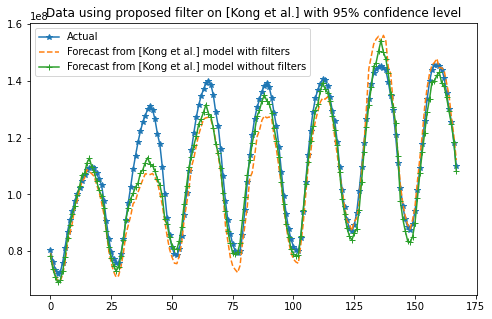

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from [Kong et al.] model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from [Kong et al.] model without filters')
plt.legend()
plt.title("Data using proposed filter on [Kong et al.] with 95% confidence level")
plt.show()

### CNNLSTM 

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
#train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

In [0]:
model = CNNLSTMModelBuilder.build(data_mon.shape[1],data_mon.shape[2])
model.summary()

Model: "mnist_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
inp (InputLayer)                [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 20, 16)       10656       inp[0][0]                        
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 18, 32)       1568        conv1d[0][0]                     
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, 16, 64)       6208        conv1d_1[0][0]                   
________________________________________________________________________________________

##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_mon.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 10:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 39 steps, validate on 19 steps
Epoch 1/50
37/39 [===========================>..] - ETA: 0s - loss: 0.0523 - mean_squared_error: 0.0048 - mean_absolute_percentage_error: 134.4915Evaluating: epoch 0 ends at 15:38:02.942800 with MAPE 
5.093417600346855
130.29026032733665
143.0807836594476
39/39 [==============================] - 5s 135ms/step - loss: 0.0525 - mean_squared_error: 0.0048 - mean_absolute_percentage_error: 144.6961 - val_loss: 0.0425 - val_mean_squared_error: 0.0030 - val_mean_absolute_percentage_error: 92.1407
Epoch 2/50
37/39 [===========================>..] - ETA: 0s - loss: 0.0466 - mean_squared_error: 0.0035 - mean_absolute_percentage_error: 138.8020Evaluating: epoch 1 ends at 15:38:06.311815 with MAPE 
5.90867427524091
154.86327143702846
163.94724501209086
39/39 [==============================] - 2s 53ms/step - loss: 0.0465 - mean_squared_error: 0.0035 - mean_absolute_percentage_error: 134.8671 - val_loss: 0.0497 - val_mean_squared_error: 0.0041 - val_mean_abso

In [0]:
6.081663783889149
5694118.129078507
6919588.244782632

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 10:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=500,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/500
271/273 [============================>.] - ETA: 0s - loss: 0.1818 - mean_squared_error: 0.0432 - mean_absolute_percentage_error: 3095.8103Evaluating: epoch 0 ends at 14:18:16.946244 with MAPE 
13.997743391280155
13362509.707116872
13745312.685264504
273/273 [==============================] - 22s 81ms/step - loss: 0.1817 - mean_squared_error: 0.0432 - mean_absolute_percentage_error: 3119.6975 - val_loss: 0.1328 - val_mean_squared_error: 0.0223 - val_mean_absolute_percentage_error: 11385.9111
Epoch 2/500
272/273 [============================>.] - ETA: 0s - loss: 0.1742 - mean_squared_error: 0.0369 - mean_absolute_percentage_error: 3035.0759Evaluating: epoch 1 ends at 14:18:38.224838 with MAPE 
23.00079011993518
21236817.811333954
21588985.336080473
273/273 [==============================] - 21s 77ms/step - loss: 0.1740 - mean_squared_error: 0.0368 - mean_absolute_percentage_error: 3026.0356 - val_loss: 0.2172 - val_mean_squared_error:

KeyboardInterrupt: ignored

In [0]:
6.084002895309037
5699394.545657854
6921107.420309196

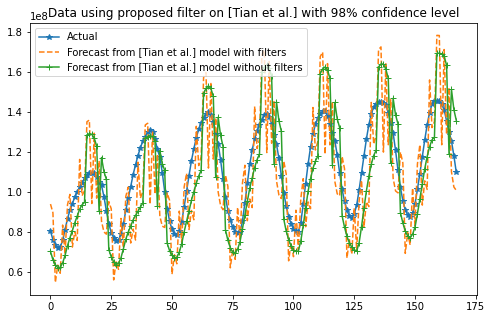

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from [Tian et al.] model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from [Tian et al.] model without filters')
plt.legend()
plt.title("Data using proposed filter on [Tian et al.] with 98% confidence level")
plt.show()

### Wavenet 

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

BATCH_SIZE = 8
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
#train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

In [0]:
model = wavenet.build_wavenet_model(data_rests.shape[1],data_rests.shape[2],16,3,18)
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
conv1d_57 (Conv1D)              (None, 24, 16)       6400        input_2[0][0]                    
__________________________________________________________________________________________________
conv1d_58 (Conv1D)              (None, 24, 16)       784         conv1d_57[0][0]                  
__________________________________________________________________________________________________
conv1d_59 (Conv1D)              (None, 24, 16)       784         conv1d_57[0][0]                  
____________________________________________________________________________________________

##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_rests.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 4:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=50,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 97 steps, validate on 48 steps
Epoch 1/50
96/97 [============================>.] - ETA: 1s - loss: 0.0358 - mean_squared_error: 0.0020 - mean_absolute_percentage_error: 6843.8286Evaluating: epoch 0 ends at 18:22:43.517903 with MAPE 
4.89182173368929
127.53550491263069
173.8895302133344
97/97 [==============================] - 214s 2s/step - loss: 0.0358 - mean_squared_error: 0.0020 - mean_absolute_percentage_error: 6776.4575 - val_loss: 0.0347 - val_mean_squared_error: 0.0019 - val_mean_absolute_percentage_error: 344.1139
Epoch 2/50
96/97 [============================>.] - ETA: 1s - loss: 0.0351 - mean_squared_error: 0.0019 - mean_absolute_percentage_error: 5542.9663Evaluating: epoch 1 ends at 18:26:12.083406 with MAPE 
5.012710417792048
132.41904806907007
173.82345164540544
97/97 [==============================] - 179s 2s/step - loss: 0.0350 - mean_squared_error: 0.0019 - mean_absolute_percentage_error: 5491.0117 - val_loss: 0.0366 - val_mean_squared_error: 0.0021 - val_mean_

KeyboardInterrupt: ignored

In [0]:
3.559792447660026
3424608.3939229795
4054294.407598905

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_rests.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      #AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)**2)
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=25,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 97 steps, validate on 48 steps
Epoch 1/25
96/97 [============================>.] - ETA: 1s - loss: 0.0255 - mean_squared_error: 0.0012 - mean_absolute_percentage_error: 4607.3745Evaluating: epoch 0 ends at 17:09:58.841026 with MAPE 
5.730972193259856
149.32646381608308
193.85717998187434
97/97 [==============================] - 184s 2s/step - loss: 0.0254 - mean_squared_error: 0.0012 - mean_absolute_percentage_error: 4561.4883 - val_loss: 0.0267 - val_mean_squared_error: 0.0013 - val_mean_absolute_percentage_error: 233.2879
Epoch 2/25
96/97 [============================>.] - ETA: 1s - loss: 0.0254 - mean_squared_error: 0.0012 - mean_absolute_percentage_error: 5181.0068Evaluating: epoch 1 ends at 17:12:59.078808 with MAPE 
5.762712837935628
150.38907541700723
194.15914623254358
97/97 [==============================] - 179s 2s/step - loss: 0.0254 - mean_squared_error: 0.0012 - mean_absolute_percentage_error: 5128.7729 - val_loss: 0.0267 - val_mean_squared_error: 0.0013 - val_mea

KeyboardInterrupt: ignored

In [0]:
3.6016885726862977
3463870.8078632844
4076884.7237214483

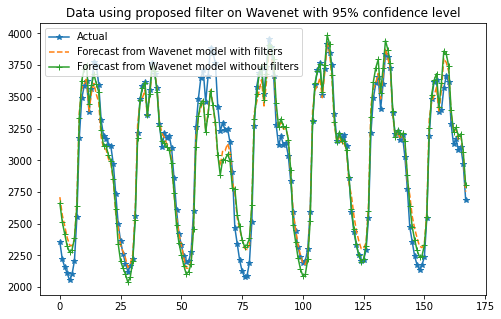

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from Wavenet model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from Wavenet model without filters')
plt.legend()
plt.title("Data using proposed filter on Wavenet with 95% confidence level")
plt.show()

### Wavenet + LSTM

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

BATCH_SIZE = 4
BUFFER_SIZE = 1000

train = tf.data.Dataset.from_tensor_slices((x_train, y_train[:,:,0]))
train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat().prefetch(1)
#train = train.cache().batch(BATCH_SIZE).repeat()


val = tf.data.Dataset.from_tensor_slices((x_val, y_val[:,:,0]))
val = val.batch(BATCH_SIZE).repeat().prefetch(1)

In [0]:
model = wavenet.build_wavenet_model(data_sun.shape[1],data_sun.shape[2],16,3,18)
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
conv1d_114 (Conv1D)             (None, 24, 16)       6400        input_3[0][0]                    
__________________________________________________________________________________________________
conv1d_115 (Conv1D)             (None, 24, 16)       784         conv1d_114[0][0]                 
__________________________________________________________________________________________________
conv1d_116 (Conv1D)             (None, 24, 16)       784         conv1d_114[0][0]                 
____________________________________________________________________________________________

##### Training

###### With filter

In [0]:
#for tensorflow 2.0
import datetime
#plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_sun.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      #plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=30,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 39 steps, validate on 19 steps
Epoch 1/30
38/39 [============================>.] - ETA: 1s - loss: 0.0947 - mean_squared_error: 0.0143 - mean_absolute_percentage_error: 111.2691Evaluating: epoch 0 ends at 14:33:46.996971 with MAPE 
7.129431349202964
170.5218010419273
183.53453185688863
39/39 [==============================] - 96s 2s/step - loss: 0.0939 - mean_squared_error: 0.0141 - mean_absolute_percentage_error: 110.7092 - val_loss: 0.0594 - val_mean_squared_error: 0.0055 - val_mean_absolute_percentage_error: 92.5865
Epoch 2/30
38/39 [============================>.] - ETA: 0s - loss: 0.0481 - mean_squared_error: 0.0037 - mean_absolute_percentage_error: 97.0859Evaluating: epoch 1 ends at 14:35:15.476095 with MAPE 
4.8546094457167435
112.4546385214992
127.34467343342429
39/39 [==============================] - 37s 950ms/step - loss: 0.0482 - mean_squared_error: 0.0037 - mean_absolute_percentage_error: 95.7790 - val_loss: 0.0389 - val_mean_squared_error: 0.0024 - val_mean_absol

KeyboardInterrupt: ignored

In [0]:
from tensorflow import keras
from tensorflow.keras import layers, Model
#for tensorflow 2.0
import datetime
plot_val = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_rests.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.0001
  else:
    return 0.0001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
model_fine = model.output
model_fine = layers.Reshape((24,1))(model_fine)
model_fine = layers.LSTM(100,return_sequences = True, activation='relu')(model_fine)
model_fine = layers.Dense(1)(model_fine)
model_fine = layers.Flatten()(model_fine)
model_final = Model(inputs=model.input, outputs=model_fine)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=15,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])



Train on 97 steps, validate on 48 steps
Epoch 1/15
96/97 [============================>.] - ETA: 1s - loss: 0.0331 - mean_squared_error: 0.0017 - mean_absolute_percentage_error: 1891.9408Evaluating: epoch 0 ends at 18:49:35.747100 with MAPE 
4.818262233365835
125.63950771603886
171.8990240510949
97/97 [==============================] - 190s 2s/step - loss: 0.0331 - mean_squared_error: 0.0017 - mean_absolute_percentage_error: 1874.1471 - val_loss: 0.0336 - val_mean_squared_error: 0.0017 - val_mean_absolute_percentage_error: 820.6652
Epoch 2/15
96/97 [============================>.] - ETA: 1s - loss: 0.0330 - mean_squared_error: 0.0017 - mean_absolute_percentage_error: 2150.9858Evaluating: epoch 1 ends at 18:52:39.066524 with MAPE 
4.824647556679339
125.90299363689681
171.96497228624438
97/97 [==============================] - 179s 2s/step - loss: 0.0329 - mean_squared_error: 0.0017 - mean_absolute_percentage_error: 2130.7112 - val_loss: 0.0336 - val_mean_squared_error: 0.0017 - val_mean

KeyboardInterrupt: ignored

In [0]:
3.539693634817098
3406576.6528809867
4029700.5747583597

###### No filter

In [0]:
#for tensorflow 2.0
import datetime
#plot_val1 = []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_scaled.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      #plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      #AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)**2)
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=500,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])

Train on 273 steps, validate on 135 steps
Epoch 1/500
272/273 [============================>.] - ETA: 0s - loss: 0.0492 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 5512.8315Evaluating: epoch 0 ends at 23:57:35.776178 with MAPE 
6.622000204974834
1302.002388145604
1635.8096938668857
273/273 [==============================] - 269s 984ms/step - loss: 0.0493 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 5493.0996 - val_loss: 0.0480 - val_mean_squared_error: 0.0035 - val_mean_absolute_percentage_error: 9400.5996
Epoch 2/500
272/273 [============================>.] - ETA: 0s - loss: 0.0496 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 11589.4629Evaluating: epoch 1 ends at 00:02:00.540468 with MAPE 
6.564630119162653
1304.4957647077645
1614.739487032414
273/273 [==============================] - 249s 913ms/step - loss: 0.0495 - mean_squared_error: 0.0038 - mean_absolute_percentage_error: 11548.3525 - val_loss: 0.0466 - val_mean_squared_erro

KeyboardInterrupt: ignored

KeyboardInterrupt: ignored

In [0]:
from tensorflow import keras
from tensorflow.keras import layers, Model
#for tensorflow 2.0
import datetime
plot_val1= []
class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    print('Evaluating: epoch {} ends at {} with MAPE '.format(epoch, datetime.datetime.now().time()))
    checkpoint_path = './'+str(datetime.datetime.now().time())+"_cp.h5" 
    #checkpoint_dir = os.path.dirname(checkpoint_path)
    model.save(checkpoint_path)
    AVG = []
    AVG1 = []
    AVG2 = []
    pred = []
    
    for i in range(len(test_inp)):
      test_pred = model.predict(test_inp[i].reshape(-1,data_rests.shape[1],133))
      pred.append(test_pred)
      #real_pred = test_scaler.inverse_transform(test_pred)
      real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
      real_pred = np.e**real_pred
      #print(test_pred.shape)
      #print(real_pred)
      #print(pretest_out[i,:,0])
      #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
      plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
      AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
      AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
      #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
      #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
      AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
    AVG = np.array(AVG)
    AVG1 = np.array(AVG1)
    AVG2 = np.array(AVG2)
    pred=np.array(pred)
    print(np.sum(AVG)/len(test_inp))
    print(np.sum(AVG1)/len(test_inp))
    print((np.sqrt(np.sum(AVG2)/len(test_inp))))

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.0001 * np.math.exp(0.1 * (1 - epoch))

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
model_fine = model.output
model_fine = layers.Reshape((24,1))(model_fine)
model_fine = layers.LSTM(100,return_sequences = True, activation='relu')(model_fine)
model_fine = layers.Dense(1)(model_fine)
model_fine = layers.Flatten()(model_fine)
model_final = Model(inputs=model.input, outputs=model_fine)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit(train, steps_per_epoch=x_train.shape[0]//BATCH_SIZE, epochs=15,
                      validation_data=val, validation_steps=x_val.shape[0]//BATCH_SIZE,callbacks=[tensorboard_callback, callback, MyCustomCallback()])



Train on 97 steps, validate on 48 steps
Epoch 1/15
96/97 [============================>.] - ETA: 1s - loss: 0.0236 - mean_squared_error: 0.0011 - mean_absolute_percentage_error: 5830.5142Evaluating: epoch 0 ends at 18:00:42.417086 with MAPE 
5.820083731946129
151.95685958416158
195.96309047360427
97/97 [==============================] - 186s 2s/step - loss: 0.0235 - mean_squared_error: 0.0010 - mean_absolute_percentage_error: 5772.6675 - val_loss: 0.0271 - val_mean_squared_error: 0.0013 - val_mean_absolute_percentage_error: 376.8805
Epoch 2/15
96/97 [============================>.] - ETA: 1s - loss: 0.0237 - mean_squared_error: 0.0011 - mean_absolute_percentage_error: 5968.9512Evaluating: epoch 1 ends at 18:03:43.633156 with MAPE 
5.822767321435741
152.05633787216783
195.94084168926116
97/97 [==============================] - 179s 2s/step - loss: 0.0237 - mean_squared_error: 0.0011 - mean_absolute_percentage_error: 5908.3350 - val_loss: 0.0271 - val_mean_squared_error: 0.0013 - val_mea

KeyboardInterrupt: ignored

In [0]:
6.451660636678543
1279.6313291944734
1605.4005080892537

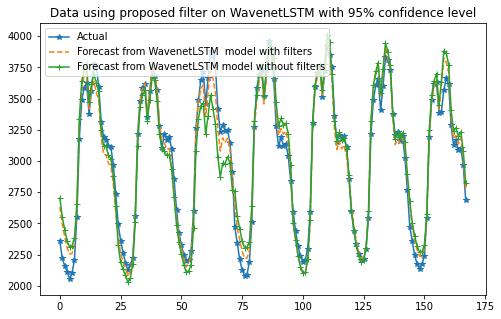

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from WavenetLSTM  model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from WavenetLSTM model without filters')
plt.legend()
plt.title("Data using proposed filter on WavenetLSTM with 95% confidence level")
plt.show()

### DAE

#### Training

##### With filter

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

bbrbm = RBMDAE.BBRBM(n_visible=24, n_hidden=64, learning_rate=0.001, momentum=0.95, use_tqdm=True)
errs = bbrbm.fit(x_train[:,:,0], n_epoches=200, batch_size=4)



Instructions for updating:
Use `tf.cast` instead.


Epoch: 0: 100%|##########| 274/274 [00:02<00:00, 116.50it/s]
Train error: 0.2751

Epoch: 1: 100%|##########| 274/274 [00:00<00:00, 369.05it/s]
Train error: 0.1958

Epoch: 2: 100%|##########| 274/274 [00:00<00:00, 349.76it/s]
Train error: 0.1408

Epoch: 3: 100%|##########| 274/274 [00:00<00:00, 374.94it/s]
Train error: 0.1032

Epoch: 4: 100%|##########| 274/274 [00:00<00:00, 365.88it/s]
Train error: 0.0773

Epoch: 5: 100%|##########| 274/274 [00:00<00:00, 364.99it/s]
Train error: 0.0593

Epoch: 6: 100%|##########| 274/274 [00:00<00:00, 369.72it/s]
Train error: 0.0467

Epoch: 7: 100%|##########| 274/274 [00:00<00:00, 361.12it/s]
Train error: 0.0375

Epoch: 8: 100%|##########| 274/274 [00:00<00:00, 369.90it/s]
Train error: 0.0308

Epoch: 9: 100%|##########| 274/274 [00:00<00:00, 363.77it/s]
Train error: 0.0258

Epoch: 10: 100%|##########| 274/274 [00:00<00:00, 358.69it/s]
Train error: 0.0219

Epoch: 11: 100%|##########| 274/274 [00:00<

In [0]:
AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val = []
for i in range(len(test_inp)):
  test_pred = bbrbm.reconstruct(test_inp[i,:,0:1].reshape(-1,24))
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

6.050606044780152
5645458.178944004
6881657.097681694


In [0]:
6.050606044780152
5645458.178944004
6881657.097681694

##### No filter

In [0]:
# for pure keras
x_train, x_val, y_train, y_val = train_test_split(inp,out,
                                                  random_state=42, test_size =0.33,shuffle=True)

bbrbm = RBMDAE.BBRBM(n_visible=24, n_hidden=64, learning_rate=0.001, momentum=0.95, use_tqdm=True)
errs = bbrbm.fit(x_train[:,:,0], n_epoches=150, batch_size=4)

Epoch: 0: 100%|##########| 274/274 [00:00<00:00, 346.62it/s]
Train error: 0.2354

Epoch: 1: 100%|##########| 274/274 [00:00<00:00, 359.11it/s]
Train error: 0.1676

Epoch: 2: 100%|##########| 274/274 [00:00<00:00, 350.48it/s]
Train error: 0.1211

Epoch: 3: 100%|##########| 274/274 [00:00<00:00, 358.04it/s]
Train error: 0.0895

Epoch: 4: 100%|##########| 274/274 [00:00<00:00, 361.87it/s]
Train error: 0.0678

Epoch: 5: 100%|##########| 274/274 [00:00<00:00, 356.74it/s]
Train error: 0.0527

Epoch: 6: 100%|##########| 274/274 [00:00<00:00, 356.70it/s]
Train error: 0.0419

Epoch: 7: 100%|##########| 274/274 [00:00<00:00, 351.79it/s]
Train error: 0.0340

Epoch: 8: 100%|##########| 274/274 [00:00<00:00, 380.78it/s]
Train error: 0.0281

Epoch: 9: 100%|##########| 274/274 [00:00<00:00, 357.16it/s]
Train error: 0.0237

Epoch: 10: 100%|##########| 274/274 [00:00<00:00, 360.31it/s]
Train error: 0.0203

Epoch: 11: 100%|##########| 274/274 [00:00<00:00, 353.57it/s]
Train error: 0.0176

Epoch: 12: 100

In [0]:
AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val1 = []
for i in range(len(test_inp)):
  test_pred = bbrbm.reconstruct(test_inp[i,:,0:1].reshape(-1,24))
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

6.052395940856418
5641764.380505451
6879584.29225612


In [0]:
6.052395940856418
5641764.380505451
6879584.29225612

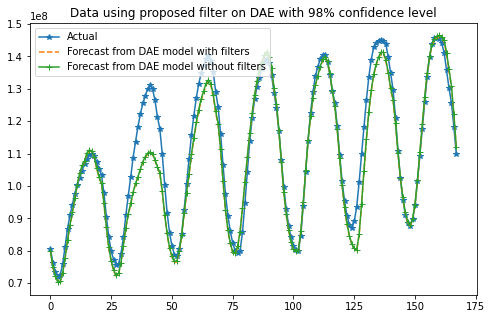

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0,:].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from DAE model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from DAE model without filters')
plt.legend()
plt.title("Data using proposed filter on DAE with 98% confidence level")
plt.show()

### WNN 

In [0]:
inp_high, inp_low_low, inp_low_high = waveletFunction.extract(inp)

In [0]:
# for pure keras
x_train_high, x_val_high, y_train, y_val = train_test_split(inp_high,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

In [0]:
# for pure keras
x_train_low_low, x_val_low_low, y_train, y_val = train_test_split(inp_low_low,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

In [0]:
# for pure keras
x_train_low_high, x_val_low_high, y_train, y_val = train_test_split(inp_low_high,out,
                                                  random_state=42, test_size =0.33,shuffle=False)

In [0]:
# define two sets of inputs
inputA = tf.keras.Input(shape=(x_train_high.shape[1],x_train_high.shape[2]))
inputB = tf.keras.Input(shape=(x_train_low_low.shape[1],x_train_low_low.shape[2]))
inputC = tf.keras.Input(shape=(x_train_low_high.shape[1],x_train_low_high.shape[2]))

# the first branch opreates on the first input
x = tf.keras.layers.Dense(100, activation="selu")(inputA)
x = tf.keras.layers.Dense(100, activation="selu")(x)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dropout(0.3)(x)
x = tf.keras.layers.Dense(24, activation="linear")(x)
x = tf.keras.Model(inputs = inputA, outputs = x)

# the second branch opreates on the second input
y = tf.keras.layers.Dense(100, activation="selu")(inputB)
y = tf.keras.layers.Dense(100, activation="selu")(y)
y = tf.keras.layers.Flatten()(y)
y = tf.keras.layers.Dropout(0.3)(y)
y = tf.keras.layers.Dense(24, activation="linear")(y)
y = tf.keras.Model(inputs = inputB, outputs = y)

# the third branch opreates on the third input
z = tf.keras.layers.Dense(100, activation="selu")(inputC)
z = tf.keras.layers.Dense(100, activation="selu")(z)
z = tf.keras.layers.Flatten()(z)
z = tf.keras.layers.Dropout(0.3)(z)
z = tf.keras.layers.Dense(24, activation="linear")(z)
z = tf.keras.Model(inputs = inputC, outputs = z)

total = tf.keras.layers.Add()([x.output,y.output,z.output])

model = tf.keras.Model(inputs=[x.input, y.input, z.input], outputs=total)

In [0]:
model.summary()

Model: "model_35"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_25 (InputLayer)           [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
input_26 (InputLayer)           [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
input_27 (InputLayer)           [(None, 24, 133)]    0                                            
__________________________________________________________________________________________________
dense_72 (Dense)                (None, 24, 100)      13400       input_25[0][0]                   
___________________________________________________________________________________________

##### Training

###### With filter

In [0]:
#for tensorflow 2.0

def scheduler(epoch):
  if epoch < 5:
    return 0.01
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer='rmsprop', loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit([x_train_high,x_train_low_low,x_train_low_high],y_train[:,:,0], batch_size=4, epochs=50,
                      validation_data=([x_val_high,x_val_low_low,x_val_low_high],y_val[:,:,0]),callbacks=[callback])

Train on 1095 samples, validate on 540 samples
Epoch 1/50
1095/1095 [==============================] - 3s 3ms/sample - loss: 4.6169 - mean_squared_error: 63.0875 - mean_absolute_percentage_error: 112383.7578 - val_loss: 2.7066 - val_mean_squared_error: 12.0281 - val_mean_absolute_percentage_error: 198691.7344
Epoch 2/50
1095/1095 [==============================] - 2s 2ms/sample - loss: 2.8306 - mean_squared_error: 12.9198 - mean_absolute_percentage_error: 45135.6328 - val_loss: 2.3882 - val_mean_squared_error: 8.9834 - val_mean_absolute_percentage_error: 368566.3750
Epoch 3/50
1095/1095 [==============================] - 2s 2ms/sample - loss: 2.8949 - mean_squared_error: 13.7262 - mean_absolute_percentage_error: 64914.6445 - val_loss: 3.0314 - val_mean_squared_error: 14.3317 - val_mean_absolute_percentage_error: 75142.7578
Epoch 4/50
1095/1095 [==============================] - 2s 2ms/sample - loss: 2.9827 - mean_squared_error: 14.1408 - mean_absolute_percentage_error: 43547.1211 - val

In [0]:
import pywt

testinp_high, testinp_low_low, testinp_low_high = waveletFunction.extract(test_inp)

AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val = []
for i in range(len(test_inp)):
  test_pred = model.predict([testinp_high[i].reshape(-1,24,133),testinp_low_low[i].reshape(-1,24,133),testinp_low_high[i].reshape(-1,24,133)])
  
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred.reshape(-1)
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

3.5227531822414146
3418438.3851726702
4061634.606719081


In [0]:
3.5227531822414146
3418438.3851726702
4061634.606719081

###### No filter

In [0]:
#for tensorflow 2.0

def scheduler(epoch):
  if epoch < 5:
    return 0.001
  else:
    return 0.001 * np.math.exp(0.1 * (1 - epoch))
    #return 0.001

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#callback2 = tf.keras.callbacks.EarlyStopping(mode="min", monitor='val_loss')
model.compile(optimizer='rmsprop', loss='mae',metrics=['mse','mape'])


# fit network
history = model.fit([x_train_high,x_train_low_low,x_train_low_high],y_train[:,:,0], batch_size=4, epochs=25,
                      validation_data=([x_val_high,x_val_low_low,x_val_low_high],y_val[:,:,0]),callbacks=[callback])

Train on 1095 samples, validate on 540 samples
Epoch 1/25
1095/1095 [==============================] - 3s 3ms/sample - loss: 0.6615 - mean_squared_error: 0.7242 - mean_absolute_percentage_error: 10880.6328 - val_loss: 0.4649 - val_mean_squared_error: 0.3342 - val_mean_absolute_percentage_error: 8876.6162
Epoch 2/25
1095/1095 [==============================] - 2s 2ms/sample - loss: 0.4237 - mean_squared_error: 0.2854 - mean_absolute_percentage_error: 7508.0879 - val_loss: 0.3049 - val_mean_squared_error: 0.1442 - val_mean_absolute_percentage_error: 8361.1455
Epoch 3/25
1095/1095 [==============================] - 2s 2ms/sample - loss: 0.2993 - mean_squared_error: 0.1423 - mean_absolute_percentage_error: 4951.8799 - val_loss: 0.2436 - val_mean_squared_error: 0.0911 - val_mean_absolute_percentage_error: 53516.4297
Epoch 4/25
1095/1095 [==============================] - 2s 2ms/sample - loss: 0.2255 - mean_squared_error: 0.0800 - mean_absolute_percentage_error: 3384.4556 - val_loss: 0.1822 

In [0]:
import pywt

testinp_high, testinp_low_low, testinp_low_high = waveletFunction.extract(test_inp)

AVG = []
AVG1 = []
AVG2 = []
pred = []
plot_val1 = []
for i in range(len(test_inp)):
  test_pred = model.predict([testinp_high[i].reshape(-1,24,133),testinp_low_low[i].reshape(-1,24,133),testinp_low_high[i].reshape(-1,24,133)])
  
  #real_pred = test_scaler.inverse_transform(test_pred)
  real_pred = np.log(pretest_inp[i,:,0].T) + test_pred.reshape(-1)
  real_pred = np.e**real_pred
  #print(test_pred.shape)
  #print(real_pred)
  #print(pretest_out[i,:,0])
  #print(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))
  plot_val1.append([real_pred.T.reshape(-1),pretest_out[i,:,0].reshape(-1)])
  AVG.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1)))/pretest_out[i,:,0].reshape(-1))*100/24)
  AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)
  #AVG.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1)))/test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))*100/24)
  #AVG1.append(np.sum(abs((real_pred.T.reshape(-1)-test_scaler.inverse_transform(pretest_out[i,:,0:1].T).reshape(-1))))/24)
  AVG2.append((np.sum(abs((real_pred.T.reshape(-1)-pretest_out[i,:,0].reshape(-1))))/24)**2)
AVG = np.array(AVG)
AVG1 = np.array(AVG1)
AVG2 = np.array(AVG2)
print(np.sum(AVG)/len(test_inp))
print(np.sum(AVG1)/len(test_inp))
print((np.sqrt(np.sum(AVG2)/len(test_inp))))

3.6331669328361476
3525543.550924314
4106249.429547678


In [0]:
3.6331669328361476
3525543.550924314
4106249.429547678

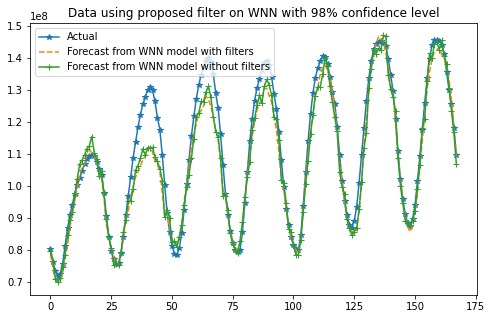

In [0]:
figure(figsize=(8,5))
plot_val = np.array(plot_val)
plot_val1 = np.array(plot_val1)
truth = plot_val[:,1,:].reshape(-1)
forecast1 = plot_val[:,0,:].reshape(-1)
forecast2 = plot_val1[:,0,:].reshape(-1)
plt.plot(truth[:7*24],'-*',label='Actual')
plt.plot(forecast1[:7*24],'--',label='Forecast from WNN model with filters')
plt.plot(forecast2[:7*24],'-+',label='Forecast from WNN model without filters')
plt.legend()
plt.title("Data using proposed filter on WNN with 98% confidence level")
plt.show()